In [3]:
# set parameters
norm_to_max = True
# device = 'cpu'
# batch_size = 32

In [14]:
# import functions

import scipy.io as sio

import numpy as np
import scipy

import torch.nn as nn
import torch.utils.data as torchdata
import torch

import importlib
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA


# own codes 
import dataset_gen
import sudo_algo2
import encoder
import helper

In [5]:
# some helper functions
def random_partition(l):
    index = [i for i in range(len(l))] 
    np.random.shuffle(index)
    num_partition = int(len(l)/200)

    part_index = []
    for i in range(num_partition):
        upper = (i + 1) * 200
        if i == num_partition:
            upper = len(index)
        part_index.append(index[i * 200: upper])
    
#     part_index = [index[i * 400: np.min((i + 1) * 400, len(l) - 1)] for i in range(num_partition)]
    return part_index


def reload():
    importlib.reload(encoder)
    importlib.reload(sudo_algo2)
    importlib.reload(dataset_gen)
    importlib.reload(helper)

In [6]:
# Read all genes file and store in a dic from gene to gene expression
reload()
path = './Circadian-zonation/'
dic_struc = ['00A','06A','12A','18A','00B','06B','12B','18B','00C','12C']
# rep_1 = ['00A','06A','12A','18A']

z_gene = helper.load_genes(path + 'Z_gene.csv')
r_gene = helper.load_genes(path + 'R_gene.csv')
z_r_gene = helper.load_genes(path + 'Z+R_gene.csv')
zxr_gene = helper.load_genes(path + 'ZxR_gene.csv')

total_gene = z_gene + r_gene + z_r_gene + zxr_gene 

data_seq_data_total = helper.load_data_key('seq_data', dic_struc, path, total_gene)
data_mat_norm_total = helper.load_data_key('mat_norm', dic_struc, path, total_gene)

In [7]:
# check structure of data file
# mat_norm * Pmat = mean_gene_expression (in R^8)

f = '00A'
load_path = path + 'Datasets/Profiles/ZT'+f+'.mat'
cur_data = sio.loadmat(load_path)
print(cur_data['seq_data'].shape)
print(cur_data['mat_norm'].shape)

print(cur_data['MeanGeneExp'].shape)
print(cur_data['SE'].shape)
print(type(cur_data['mat_norm'][0]))

test = cur_data['mat_norm'][1100]
pmat = np.array(cur_data['Pmat'])
res = np.matmul(test, pmat)
# print(res)

print(res - cur_data['MeanGeneExp'][1100])
# print(cur_data['Pmat'][1])

(14812, 2081)
(14812, 2081)
(14812, 8)
(14812, 8)
<class 'numpy.ndarray'>
[0. 0. 0. 0. 0. 0. 0. 0.]


In [8]:
# obtain time label for cells, stored in a dictionary from time to cell index.


dic_struc = {'rep1': ['00A','06A','12A','18A'], 'rep2': ['00B','06B','12B','18B'], 'rep3': ['00C',None,'12C',None]}

dic_pmat = {}
for key, val in dic_struc.items():
    for x in val:
        if x is not None:
#             colab_path = '/content/drive/MyDrive/Colab Notebooks/Circadian-zonation/'
            load_path = path + 'Datasets/Profiles/ZT'+x+'.mat'
            mat = scipy.io.loadmat(load_path)
            pmat = mat['Pmat']
            dic_pmat[x] = pmat
        

time_cell_num = {}
total = 0
for k in dic_pmat:
    num = int(int(k[:2])/6)
    m,n = dic_pmat[k].shape
    if num in time_cell_num:
        time_cell_num[num].append((total, total + m))
    else:
        time_cell_num[num] = [(total, total + m)]
    total += m
    

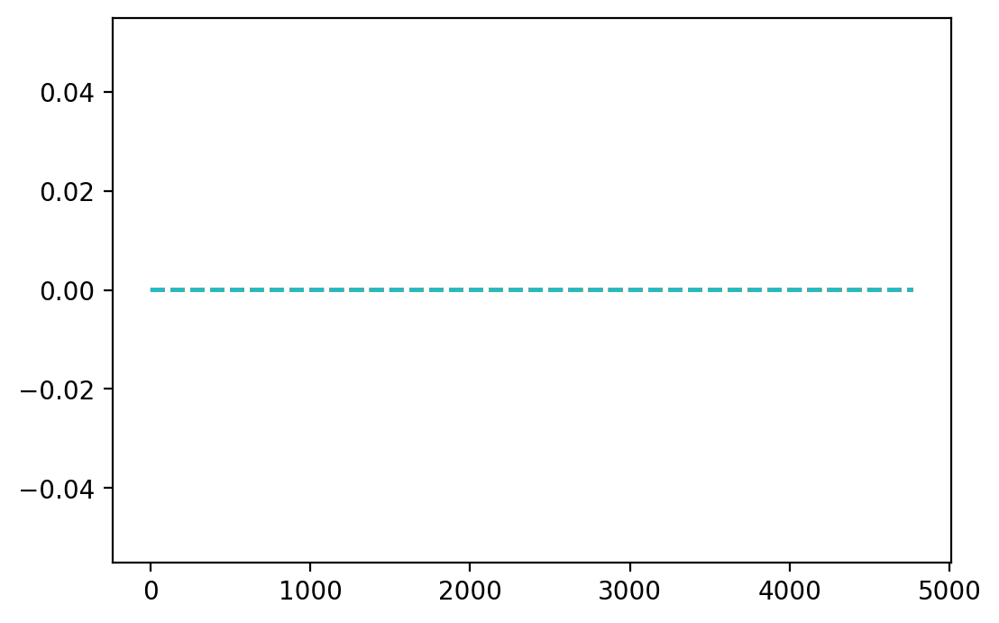

In [9]:

# check the time label for cells are correct
#      check each chunk of the data == data read directly from corresponding file


reload()
for key, val in dic_struc.items():
    for x in val:
        if x is not None:
#             colab_path = '/content/drive/MyDrive/Colab Notebooks/Circadian-zonation/'
            load_path = path + 'Datasets/Profiles/ZT'+x+'.mat'
            mat = scipy.io.loadmat(load_path)
        
            num = int(int(x[:2])/6)
            index = x[-1]
            r = None
            if index == 'A':
                r = time_cell_num[num][0]
            elif index == 'B':
                r = time_cell_num[num][1]
            else:
                r = time_cell_num[num][2]
       
            mat_norm = mat['mat_norm']
            cur_list = [temp[0].astype(str) for temp in mat['all_genes']]
            res = []
            for i in range(len(cur_list)):
                g = cur_list[i][0].astype(str)
                if (g in z_gene) or (g in r_gene) or (g in z_r_gene) or (g in zxr_gene):
                    if(np.linalg.norm(data_mat_norm_total[g][r[0]: r[1]] - mat_norm[i]) > 0):
                        print("error in " + x + g)
                    res.append(np.linalg.norm(data_mat_norm_total[g][r[0]: r[1]] - mat_norm[i]))
            helper.plot_vec([res])

In [10]:
# reconstruct true average recoverd in CZViz
# define functions for comparing our result to others

def transform_data(x):
    return np.log2(x+10**-4)-np.log2(11*10**-5)

def invert_transform(y):
    return 2**(y+np.log2(11*10**-5))-10**-4 

dic_itz = {}
dic_itz_raw = {}
dic_struc = {'rep1': ['00A','06A','12A','18A'], 'rep2': ['00B','06B','12B','18B'], 'rep3': ['00C',None,'12C',None]}
for key, val in dic_struc.items():
    for x in val:
        if x is not None:
#             colab_path = '/content/drive/MyDrive/Colab Notebooks/Circadian-zonation/'
            load_path = path + 'Datasets/Profiles/ZT'+x+'.mat'
            mat = scipy.io.loadmat(load_path)
        for name, data, SD in zip(mat['all_genes'], mat['MeanGeneExp'], mat['SE']):
            if name[0][0] not in dic_itz_raw:
                dic_itz_raw[name[0][0]] = {'rep1' : np.array([]), 'rep1_std' :np.array([]), 'rep2' : np.array([]), 'rep2_std' : np.array([]), 'rep3' : np.array([]), 'rep3_std' :  np.array([])}
                dic_itz[name[0][0]] = {'rep1' : np.array([]), 'rep1_std' :np.array([]), 'rep2' : np.array([]), 'rep2_std' : np.array([]), 'rep3' : np.array([]), 'rep3_std' :  np.array([])}
            if x is None:
                data = [np.nan]*8
                SD = [np.nan]*8
            if len(dic_itz_raw[name[0][0]][key])>0:
                dic_itz_raw[name[0][0]][key] = np.vstack( (dic_itz_raw[name[0][0]][key],np.array(data) ))
                dic_itz_raw[name[0][0]][key+'_std']= np.vstack((dic_itz_raw[name[0][0]][key+'_std'],np.array(SD)))
                dic_itz[name[0][0]][key]= np.vstack( (dic_itz[name[0][0]][key],transform_data(np.array(data))))
                dic_itz[name[0][0]][key+'_std']= np.vstack( (dic_itz[name[0][0]][key+'_std'],transform_data(np.array(SD))))
            else:
                dic_itz_raw[name[0][0]][key] = np.array(data) 
                dic_itz_raw[name[0][0]][key+'_std']= np.array(SD)
                dic_itz[name[0][0]][key]= transform_data(np.array(data))
                dic_itz[name[0][0]][key+'_std']= transform_data(np.array(SD))  
        
#take transpose everywhere
for key in dic_itz:
    for key2 in ['rep1' , 'rep1_std', 'rep2', 'rep2_std', 'rep3', 'rep3_std']:
        dic_itz[key][key2] = dic_itz[key][key2].T
        dic_itz_raw[key][key2] = dic_itz_raw[key][key2].T
        

l_names = list(dic_itz.keys())
#compute list of variance per time condition and per zone condition and then average
l_var = np.array([ np.mean(np.nanvar([dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3']], axis = 0))/np.nanvar(np.vstack((dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3']))) for gene_name in l_names])
l_var = np.array([x if not np.isnan(x) else 10**-10 for x in l_var ])
l_exp_log = [invert_transform(np.nanmax(np.vstack((dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3']))))  for gene_name in l_names]
l_exp = [np.nanmax(np.vstack((dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3']))) for gene_name in l_names]

set_names_kept_2 = set()


#add reference genes
flag_c = True
flag_z = True
flag_u = True
for exp, var,  name in zip(l_exp_log, l_var, l_names):
    if exp>10**-5 and var<0.5:
        set_names_kept_2.add(name)

dic_itz_clean = {}
for name in set_names_kept_2:
    if 'mup' not in name and 'pisd' not in name:
        dic_itz_clean[name] = dic_itz[name]
l_names = list(dic_itz_clean.keys())


# import seaborn as sn
def plot_cir(dic, name_gene, reconst):
#     color1 = sn.color_palette("husl", 4) 
#     color2 = sn.color_palette("GnBu_d",8)
#     color3 = sn.color_palette("husl", 24)
#     color4 = sn.color_palette("dark", 1)

    f, (ax1) = plt.subplots(1, 1)
    mean = np.zeros(8)
    for t in range(4):
        avg = np.nanmean((dic[name_gene]['rep1'][:,t],dic[name_gene]['rep2'][:,t],dic[name_gene]['rep3'][:,t]), axis = 0)
        std = np.nanstd((dic[name_gene]['rep1'][:,t],dic[name_gene]['rep2'][:,t],dic[name_gene]['rep3'][:,t]), axis = 0)
        ax1.plot(np.linspace(1,8,8, endpoint = True), avg, label = 'ZT'+str(int(t*6)), lw = 2)
        ax1.fill_between(np.linspace(1,8,8, endpoint = True), avg+std, avg-std, alpha=0.25)
        mean += avg
    mean = mean * 1/4
    ax1.plot(np.linspace(1,8,8, endpoint = True), reconst, label = 'reconst', color = 'k', lw = 2)
    ax1.plot(np.linspace(1,8,8, endpoint = True), mean, label = 'mean', color = 'b', lw = 2)
#     res = np.sum((reconst - np.mean(reconst)) * (mean - np.mean(reconst))) * 1/(np.linalg.norm(reconst - np.mean(reconst), 2) * np.linalg.norm(mean - np.mean(mean), 2))
#     ax1.plot(np.linspace(1,8,8, endpoint = True), mean * 1/4, label = 'reconst', color = 'b', lw = 2)
#     res = np.dot(reconst, mean) * 1/(np.linalg.norm(reconst , 2) * np.linalg.norm(mean , 2))
#     res = np.linalg.norm(reconst - mean, 2) /np.sqrt(len(reconst))
#     print(np.var(reconst))
#     print()
#     res = (np.mean(reconst) - np.mean(mean), np.sqrt(np.var(reconst - mean)))
    res = np.corrcoef(reconst,mean)[0][1]
    print(res)

    box = ax1.get_position()
    ax1.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax1.set_xlim([0.25,8.25])
    ax1.set_xticks([1,2,3,4,5,6,7,8])
    ax1.set_xlabel("Layer", fontsize=15)
    ax1.set_ylabel("Expression (fraction of total UMI)", fontsize=15)

    
    plt.show() 
    return res

def plot_temp(dic, name_gene, reconst):
    f, (ax1) = plt.subplots(1, 1)
    mean = np.zeros(4)
    res = 0
    for x in range(8):
        
        avg = np.nanmean((dic[name_gene]['rep1'][x,:], dic[name_gene]['rep2'][x,:],dic[name_gene]['rep3'][x,:]), axis = 0)
#         print(len(avg))
        std = np.nanstd((dic[name_gene]['rep1'][x,:], dic[name_gene]['rep2'][x,:],dic[name_gene]['rep3'][x,:]), axis = 0)
        ax1.plot(np.linspace(0,18,4, endpoint = True), avg, label = ''+str(int((x+1))), lw = 2)
        ax1.fill_between(np.linspace(0,18,4, endpoint = True), avg+std, avg-std, alpha=0.25)
        mean += avg
    ax1.plot(np.linspace(0,18,4, endpoint = True), reconst, label = 'reconst', color = 'k', lw = 2)
    ax1.plot(np.linspace(0,18,4, endpoint = True), mean * 1/8, label = 'mean', color = 'b', lw = 2)
    box = ax1.get_position()
#     ax1.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    #ax2.set_xlim([-0.5,18.5])
    ax1.set_xlim([-0.5,24])
    #ax2.set_xticks([0,6,12,18])
    ax1.set_xticks([0,6,12,18,24])
    
    plt.show() 
    return res

/var/folders/31/lx_42hf9627cb80wrhr0mft40000gn/T/ipykernel_59078/438575064.py:46: RuntimeWarning: invalid value encountered in double_scalars
  l_var = np.array([ np.mean(np.nanvar([dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3']], axis = 0))/np.nanvar(np.vstack((dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3']))) for gene_name in l_names])


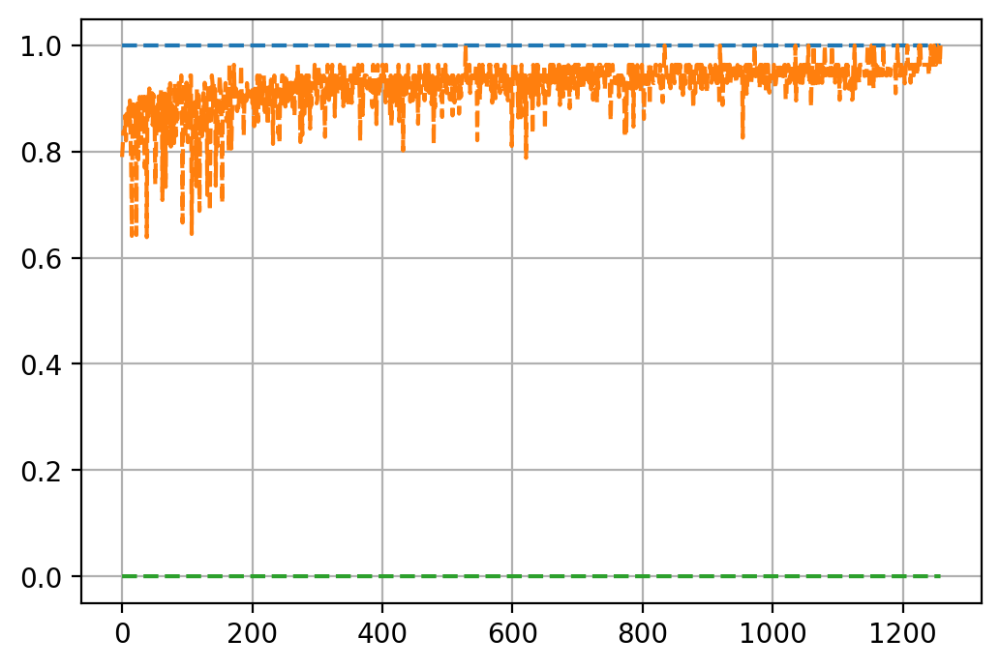

In [11]:
# preprocessing
# load data to a dictionary and check the min and max of each gene 
data_total = {}
for g in data_seq_data_total.keys():
    temp = data_seq_data_total[g] + np.array([1e-08] * len(data_seq_data_total[g]))
#     temp = data_mat_norm_total[g] + np.array([1e-08] * len(data_mat_norm_total[g]))
    data_total[g] = np.log2(np.array(temp))
    if norm_to_max:
        data_total[g] = np.array(helper.shift(data_total[g], g))

# check the min and max of each gene 
helper.plot_vec([[np.max(data_total[g]) for g in z_gene], [np.where(data_total[g] > 0, data_total[g], np.inf).min() for g in z_gene], [np.min(data_total[g]) for g in z_gene]])

```{note}
experiment on z_gene only
```

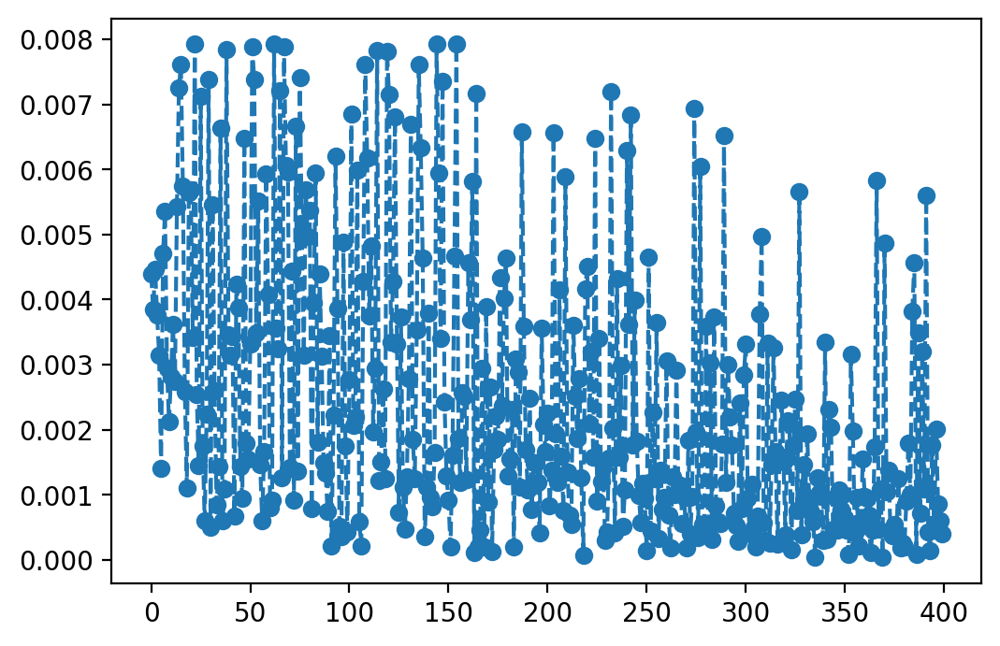

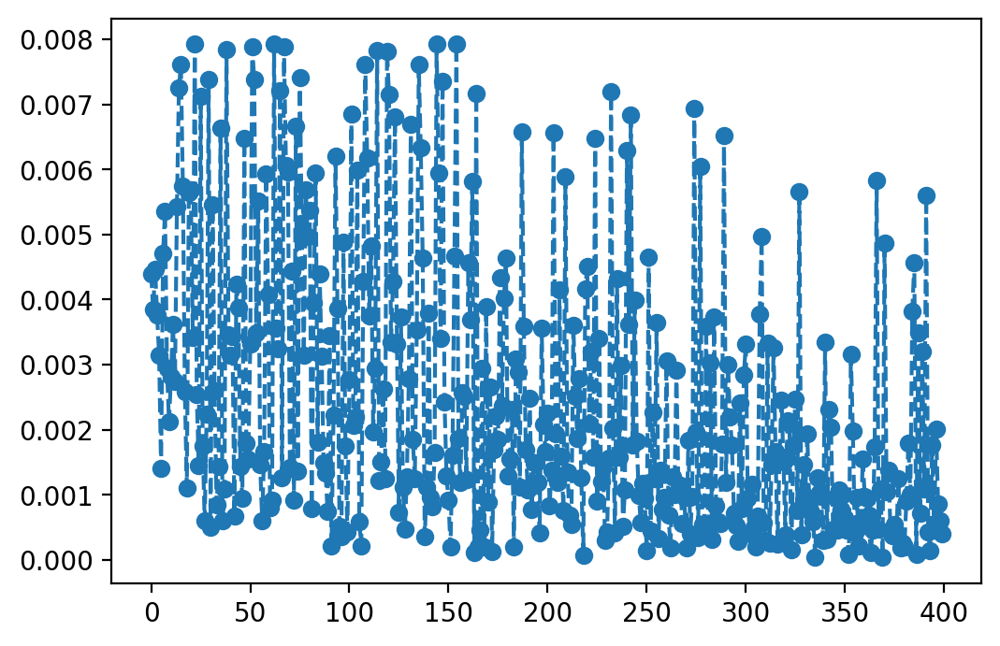

In [59]:
# check performace on z_gene only 

reload()
output_mat = helper.dic_to_array(data_total, [z_gene[0:400]])
data_dim, cell_dim = output_mat.shape

# set input parameters for the algorithm
max_epoch = 200
code_dim = 1
# hidden_layers = [64, 8]
hidden_layers = [128]
step_size = 0.1
num_iter = 0
train_len = int(cell_dim * 0.99)

# set initial weights for cell and gene
# init_weight = 1 * np.array([1/data_dim]*data_dim) 
init_weight = np.sum([output_mat >0][0], axis = 1)/ np.sum(np.sum([output_mat >0][0]))
init_cell_weight = np.array([1/train_len]*train_len)

algo_output1 = sudo_algo2.multi_weight_weightedMSE(output_mat, data_dim, max_epoch, code_dim, hidden_layers, step_size, num_iter, init_weight,init_cell_weight, False)

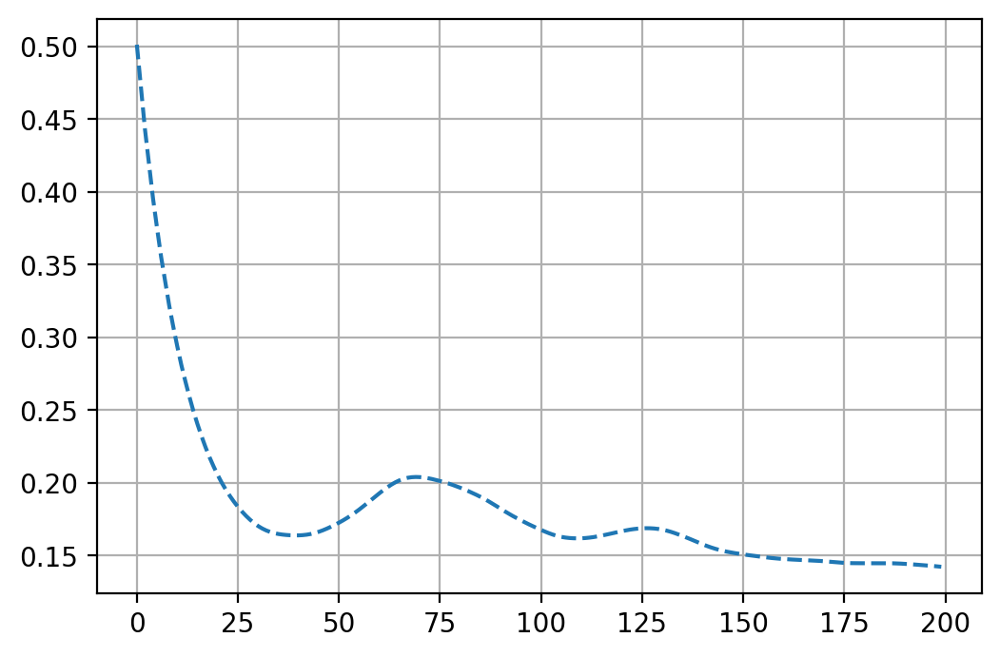

In [60]:
# check loss function is decreasing
helper.plot_vec(algo_output1[-1])

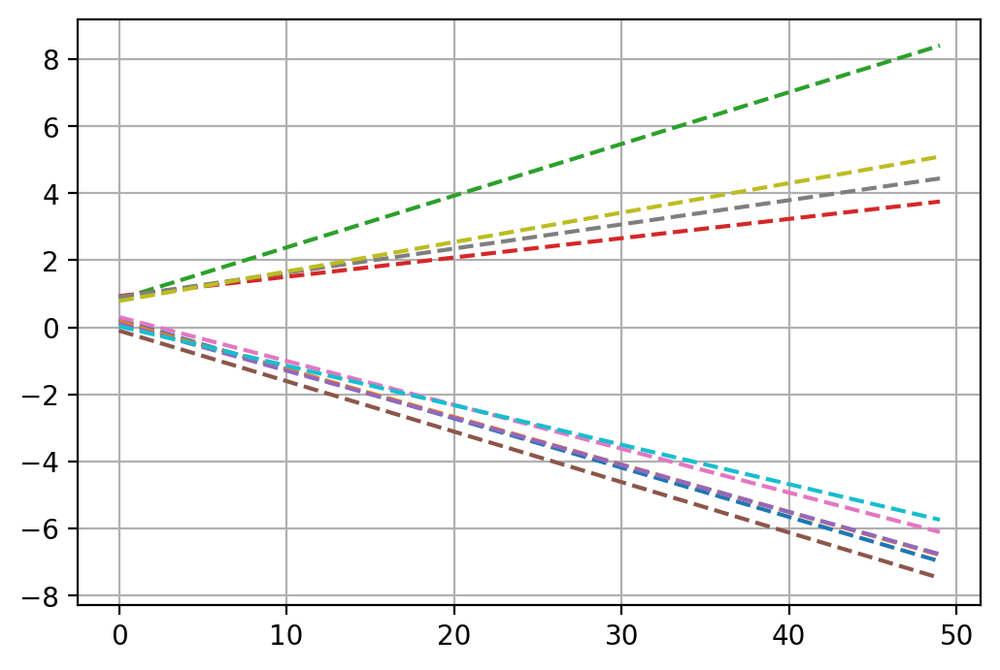

In [61]:
# check decoder function for first 10 genes
helper.plot_output_function(algo_output1[0], range(10))

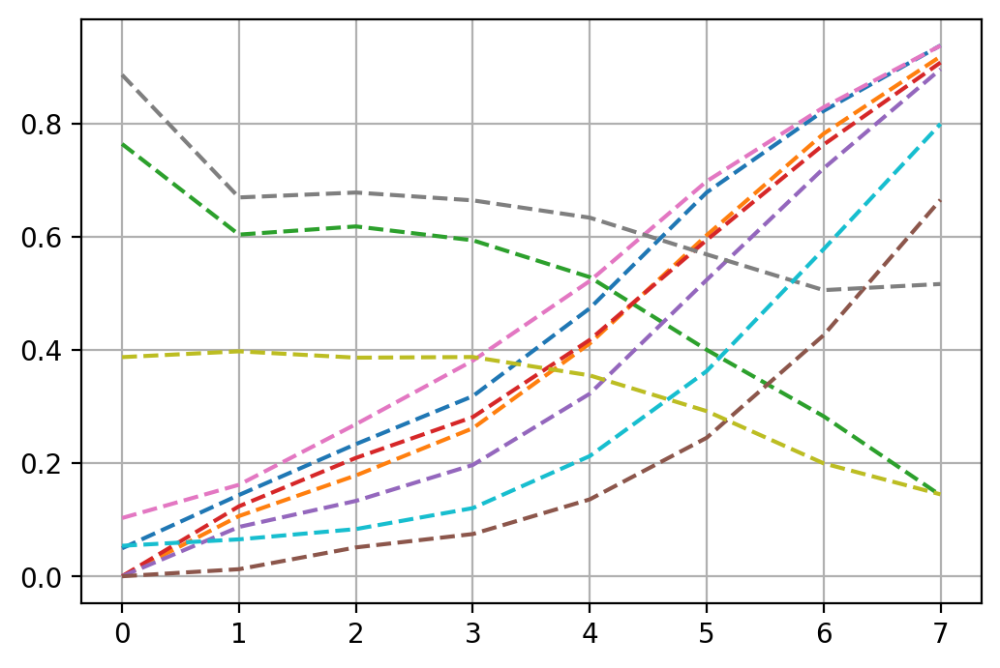

In [62]:
# check encoder output 
reload()
codes = helper.get_encoder(algo_output1[0], output_mat[:, 0:train_len])
shifted_codes = helper.shift(codes, 'none')
res = []
for i in z_gene[0:10]:
    if i in z_gene:
        res.append(helper.partial_average_shift(data_total[i][0:train_len], np.array(shifted_codes).T[0], 0))
helper.plot_vec(res)

0.9718882246552701


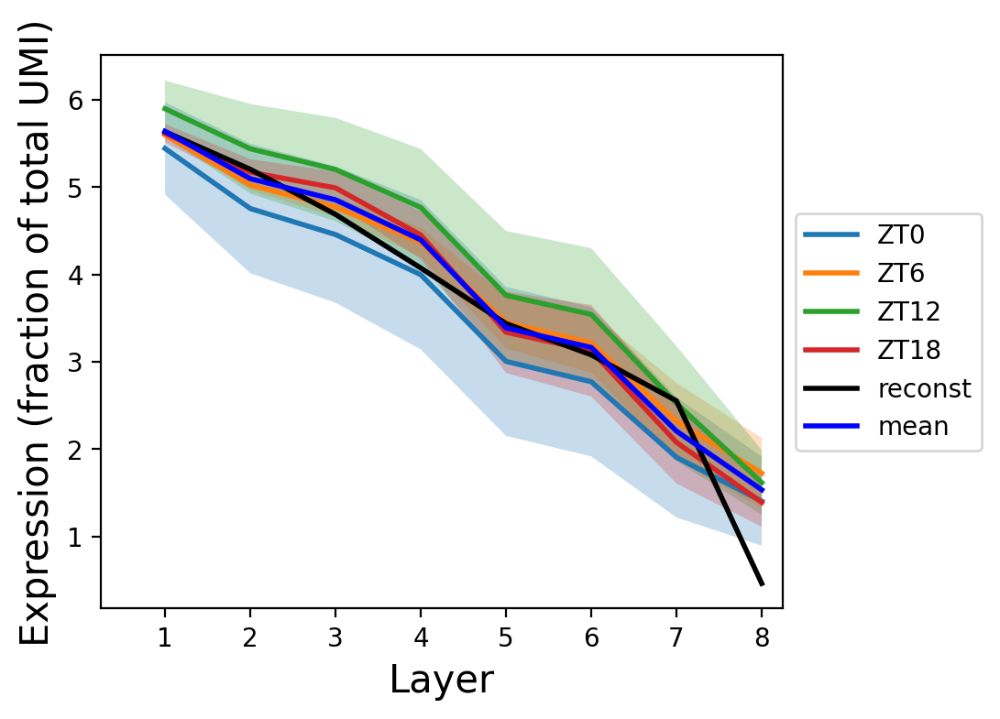

0.9547300534782741


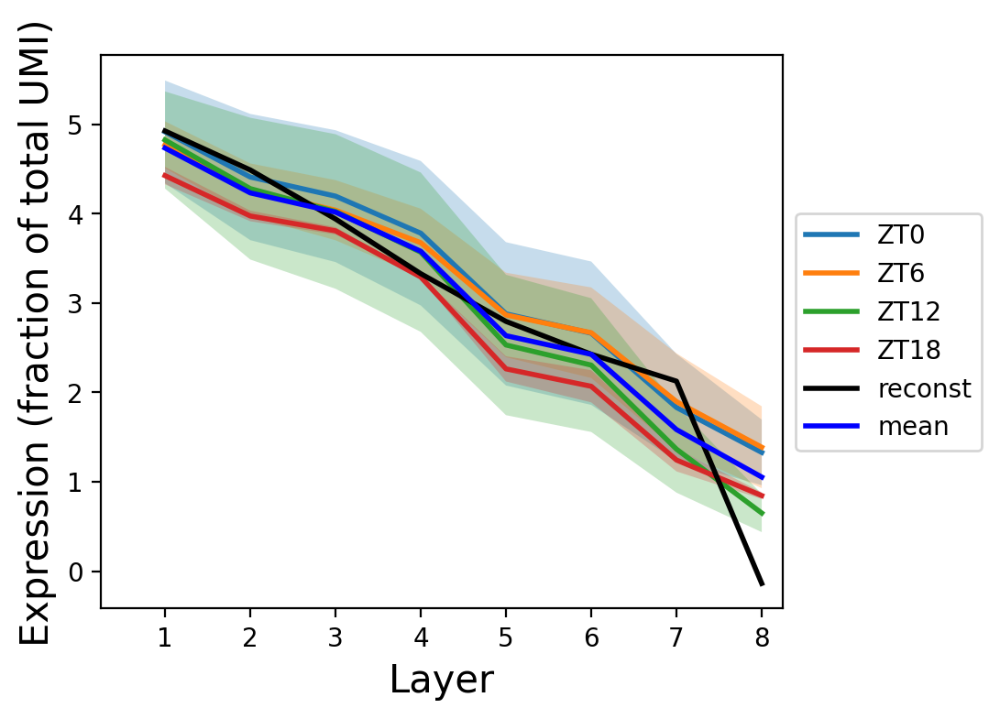

0.9884602453045163


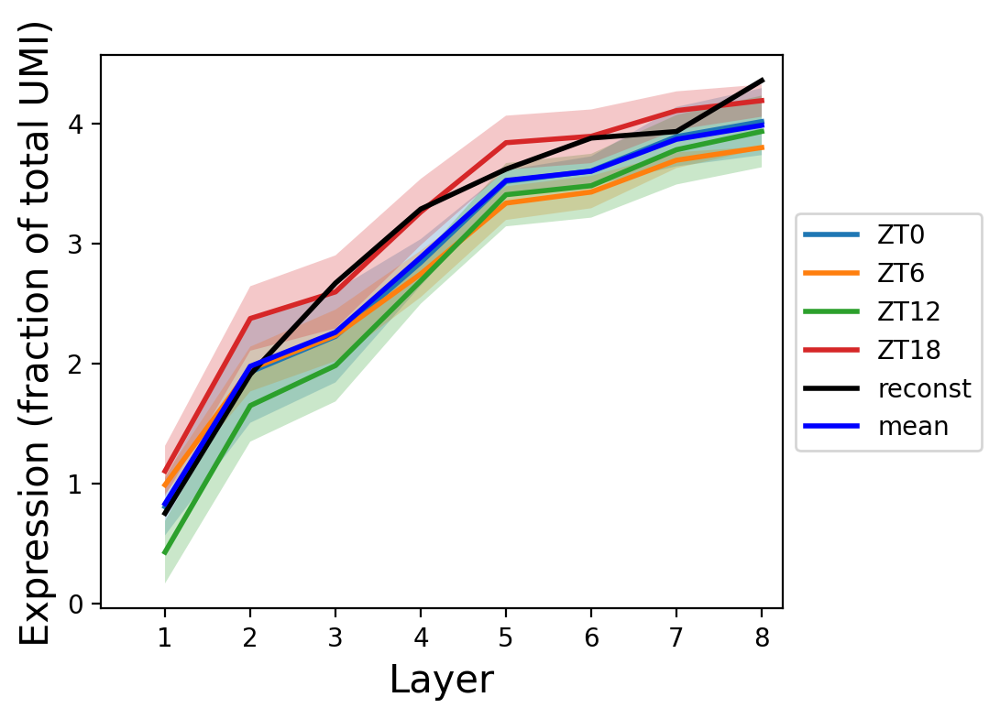

0.9504540479742378


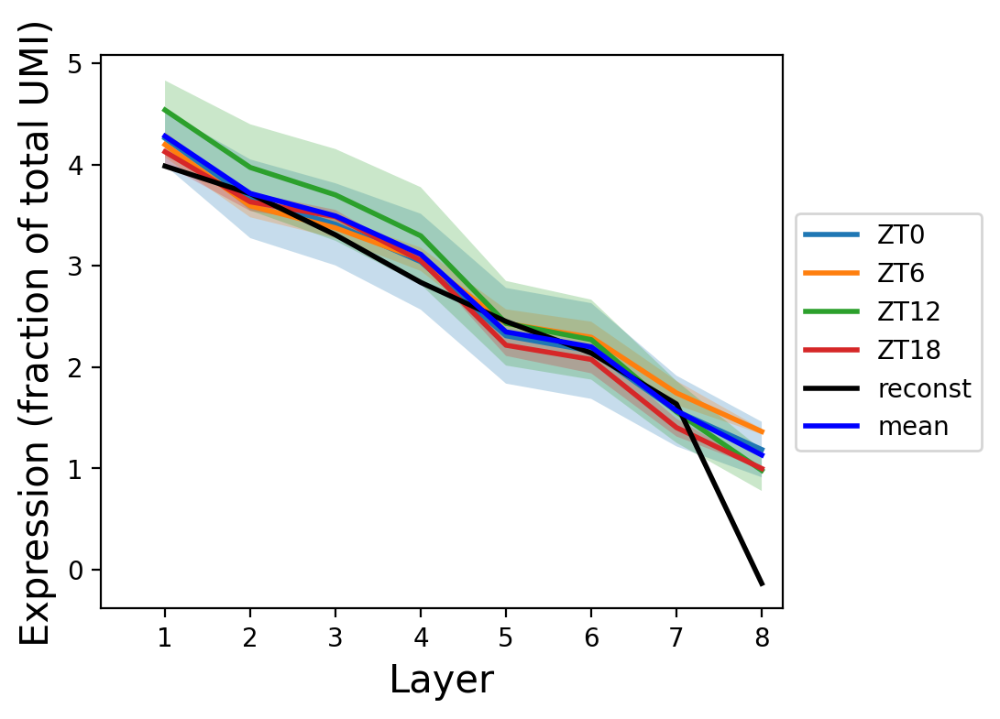

0.9713928799808376


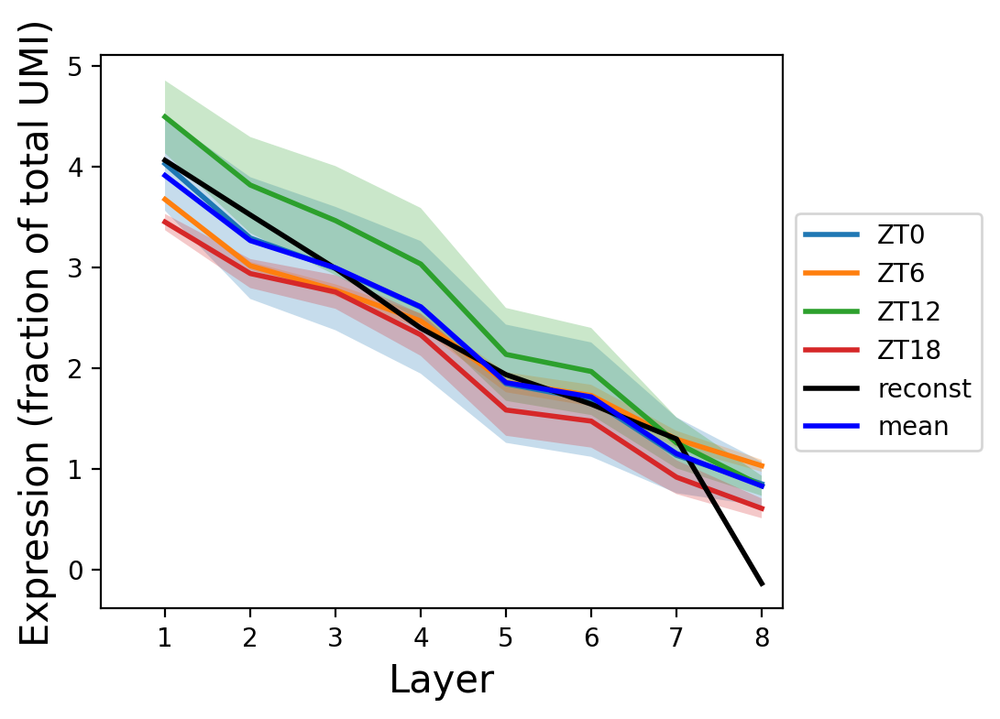

0.9813074602804249


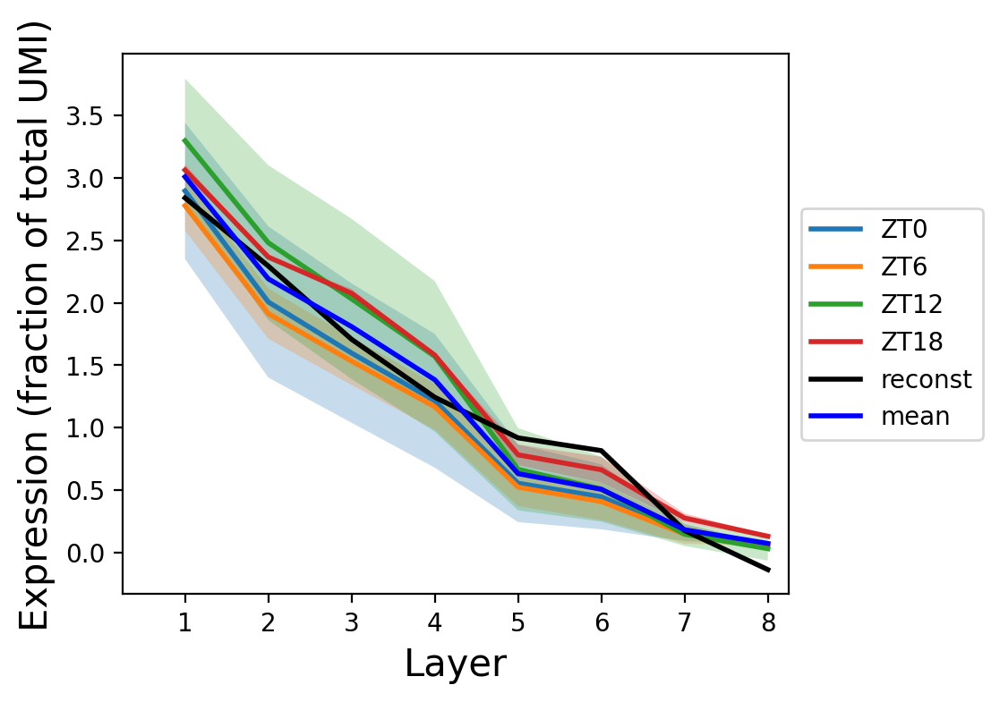

0.9878503481845584


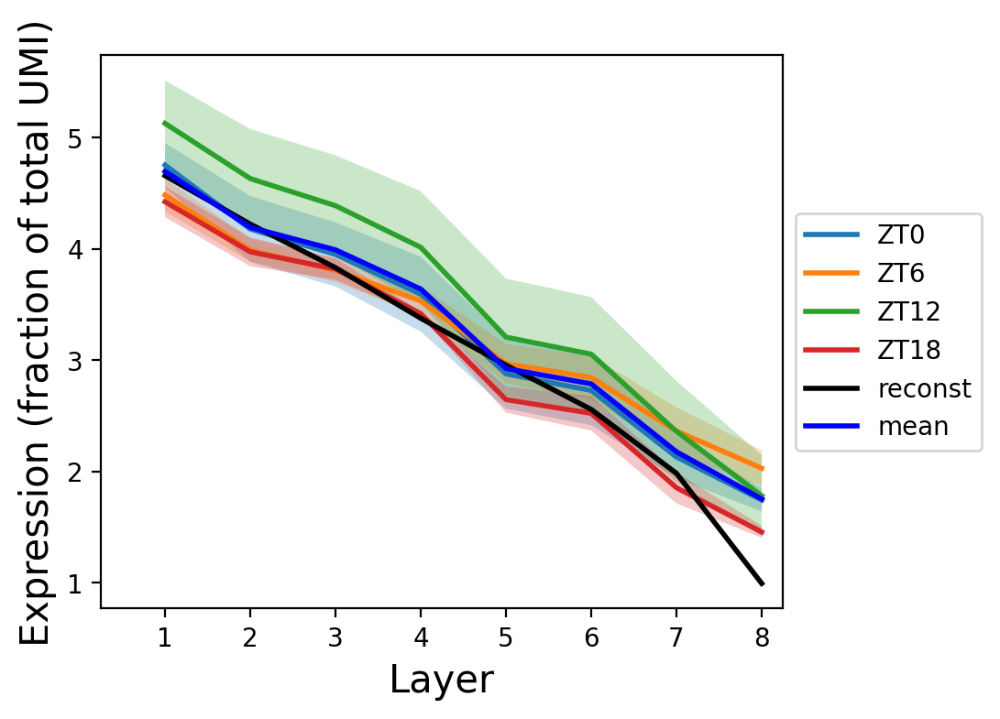

0.9923717183877911


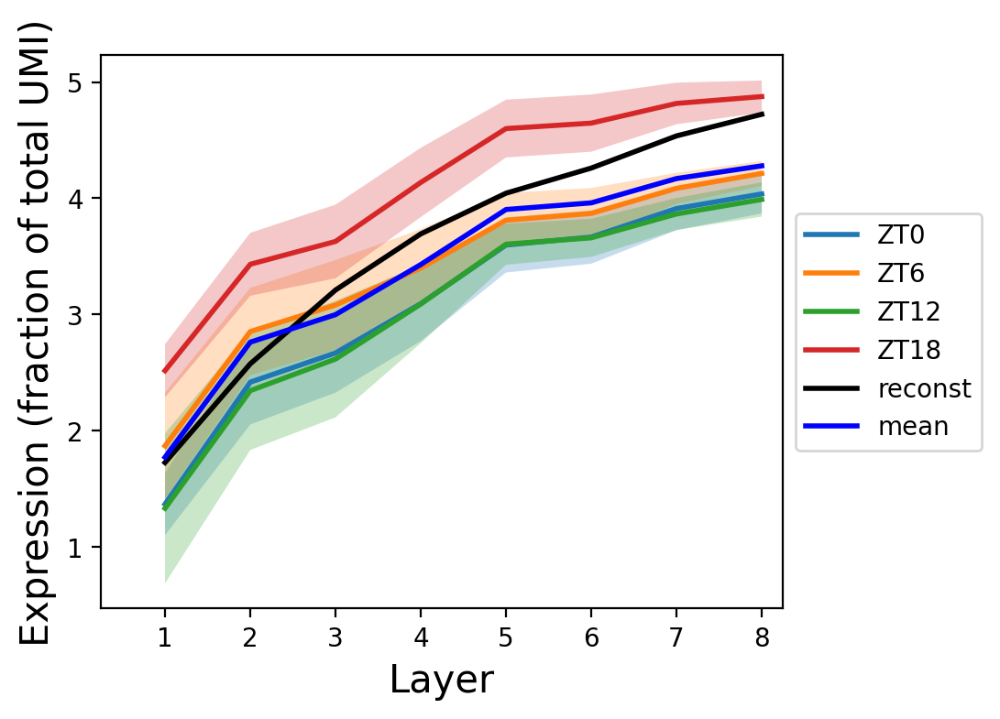

0.9821910148770391


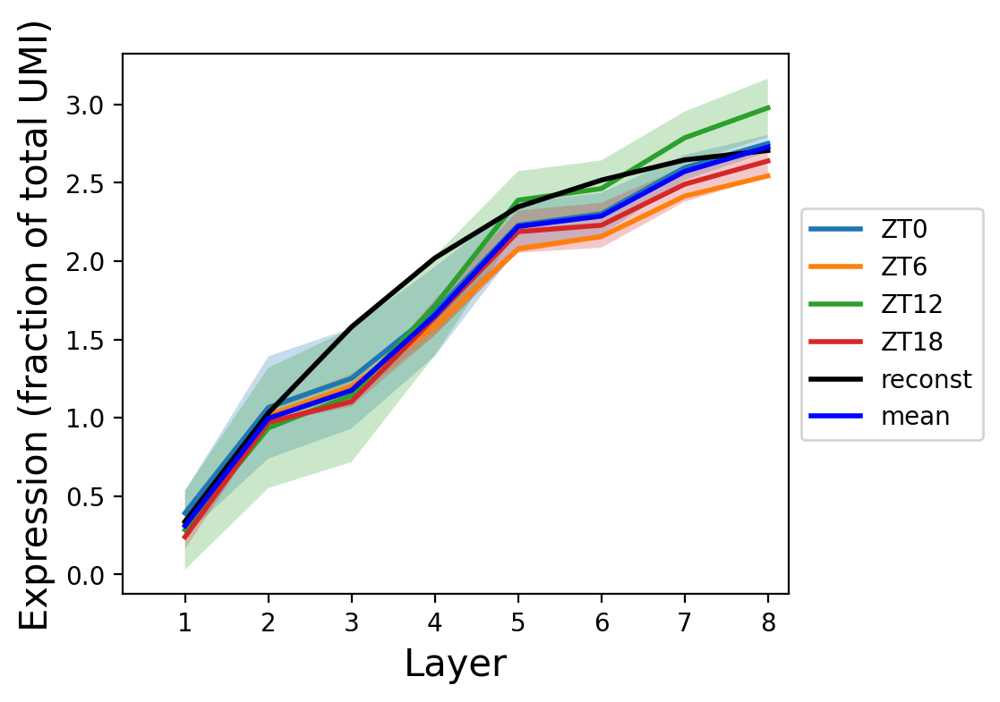

0.9776929407803133


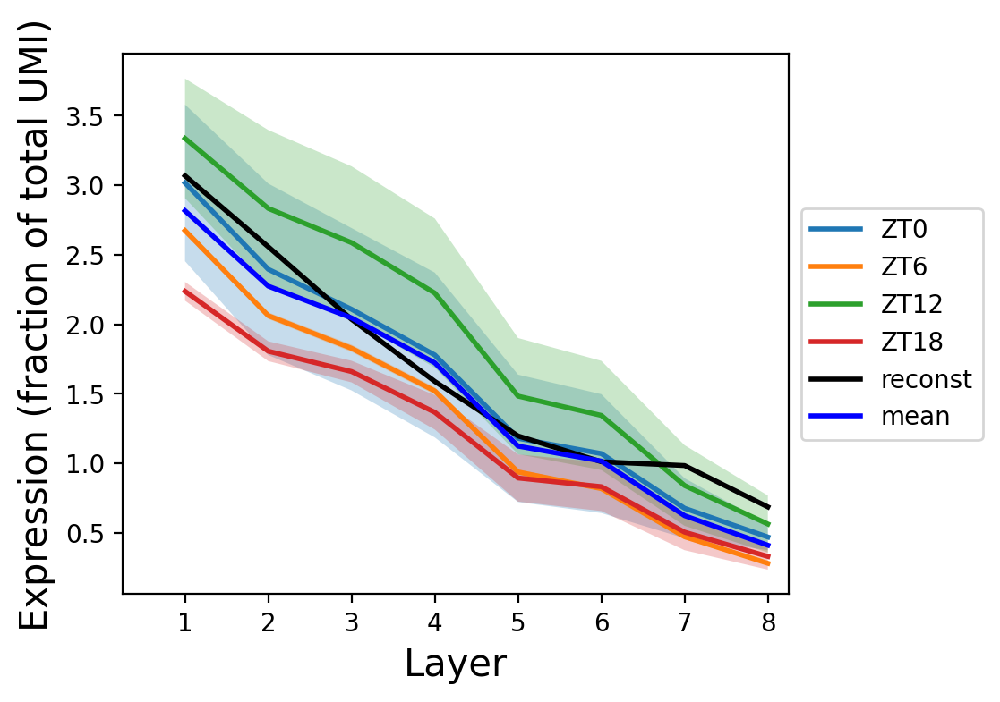

0.9904487605676774


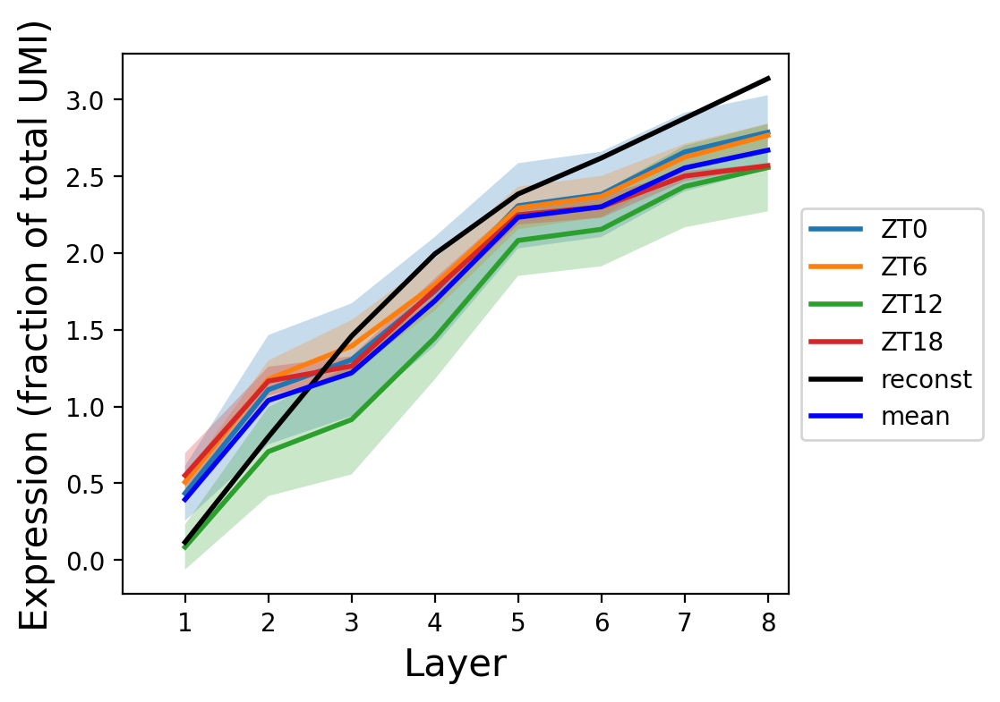

0.9734748278483408


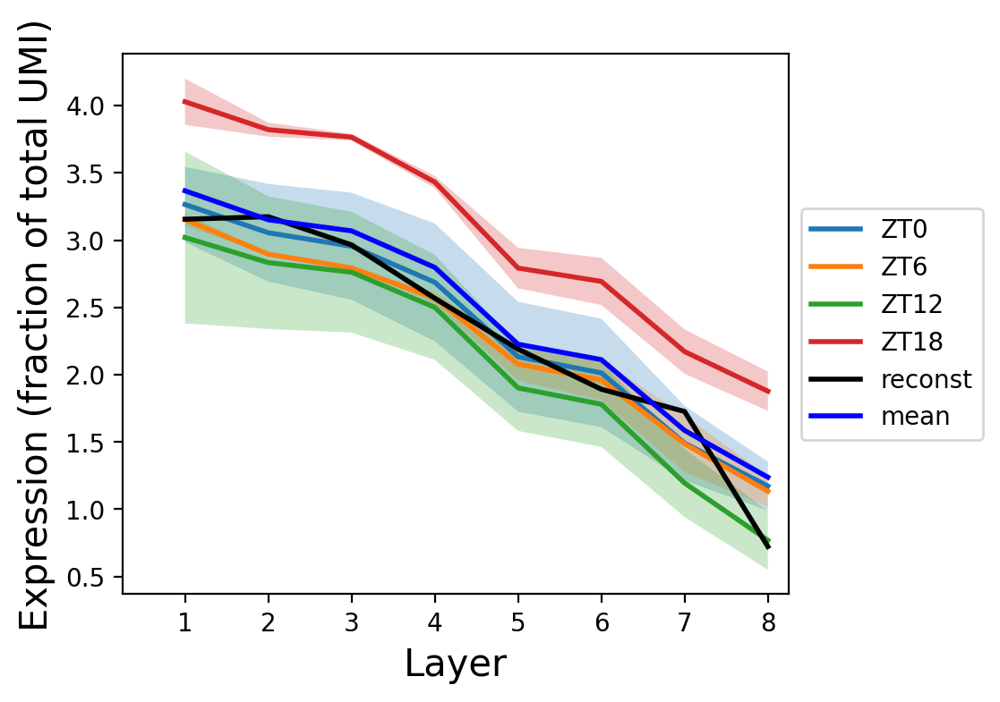

0.9918529617707907


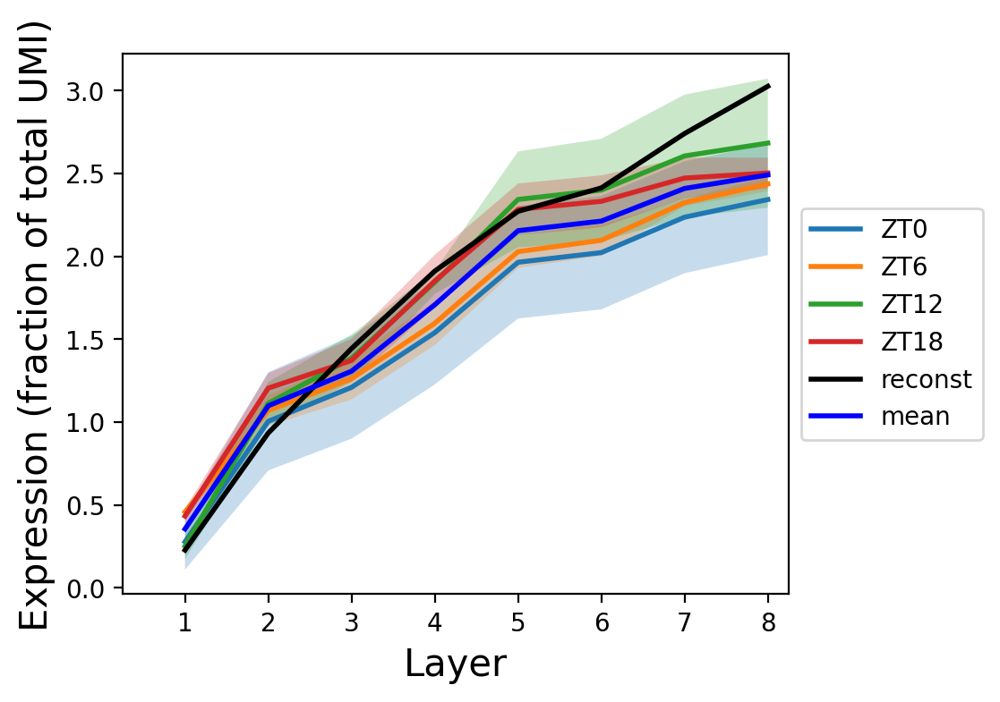

0.9256095064625232


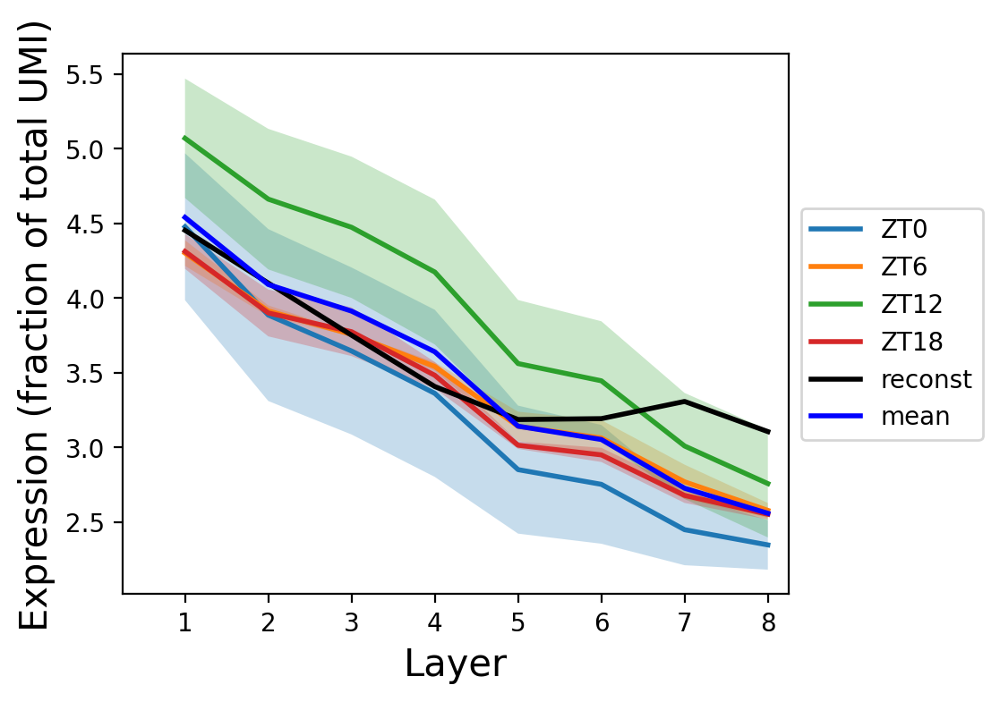

0.982423544851032


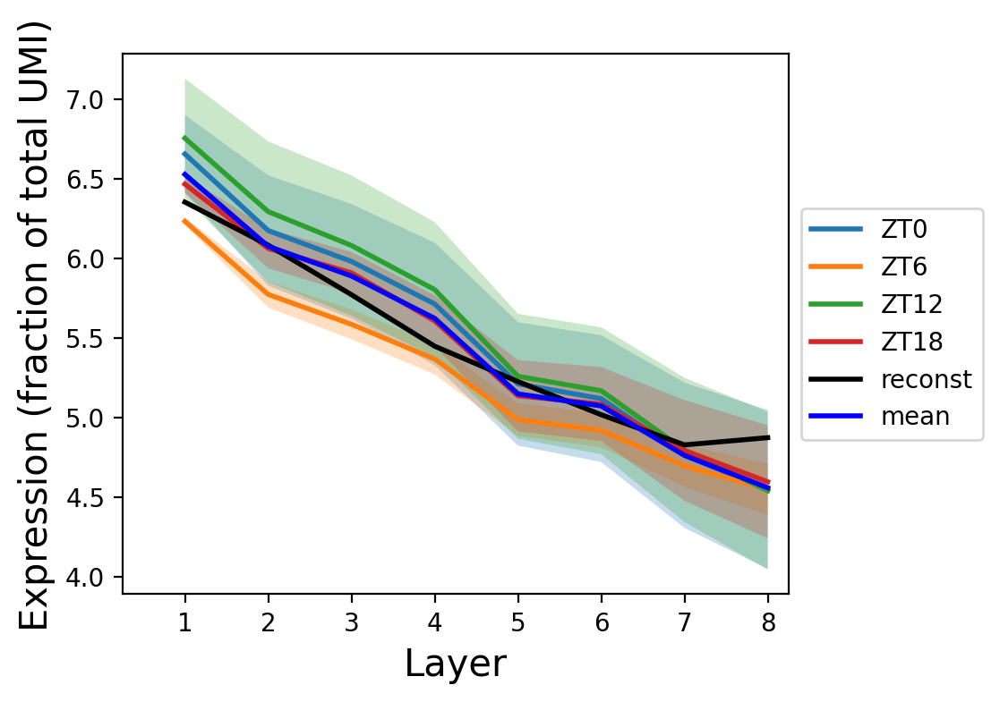

0.9407205705762841


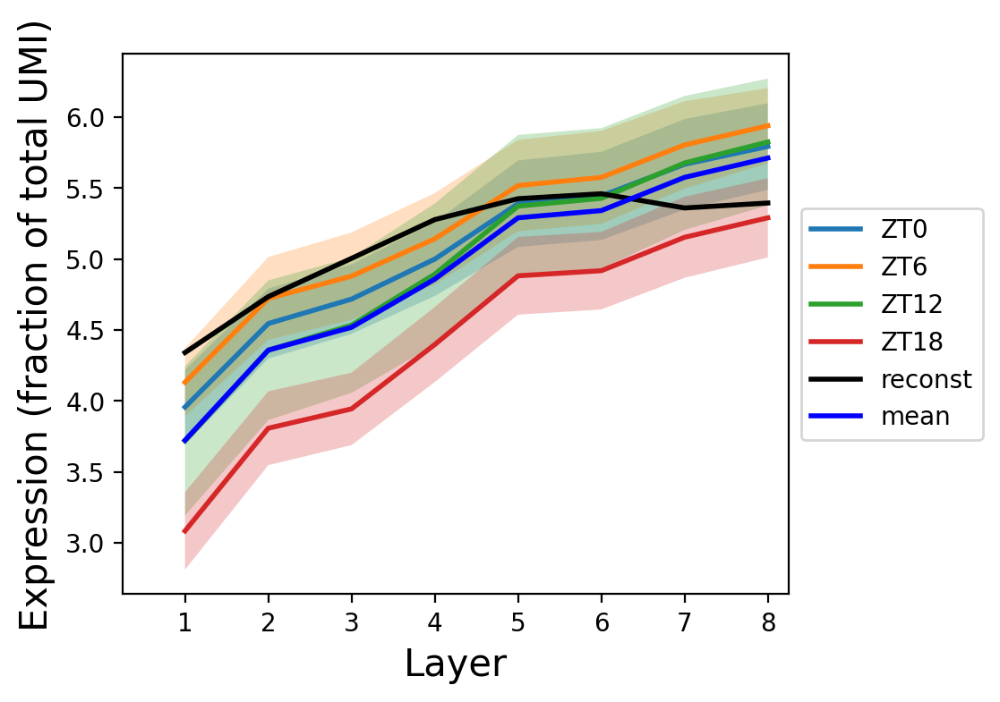

0.9899031992143531


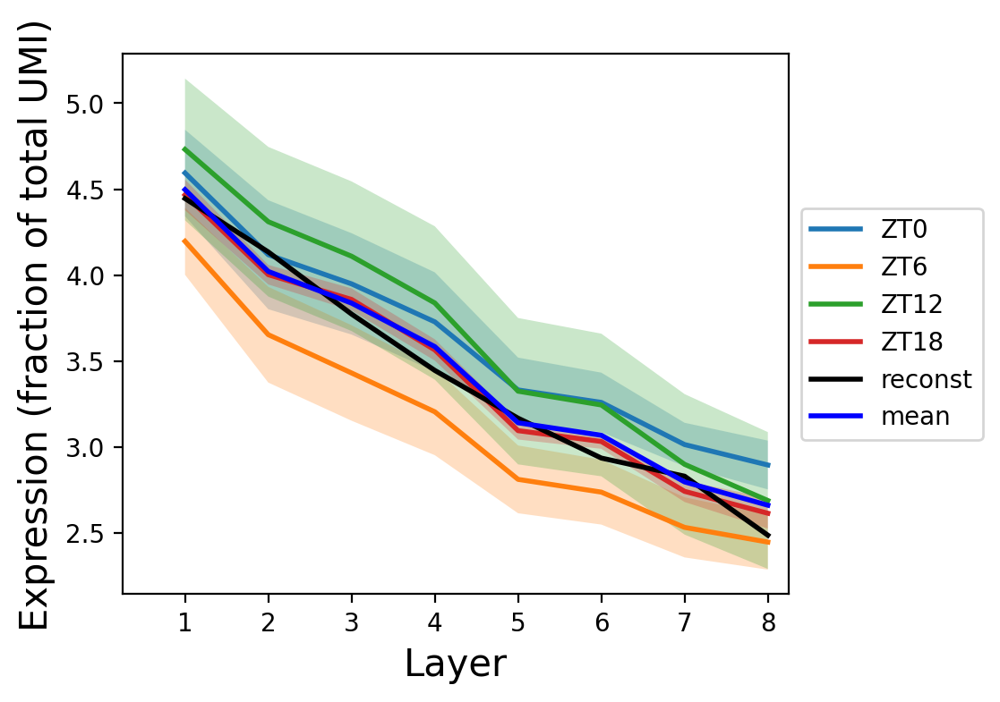

0.9744895752988962


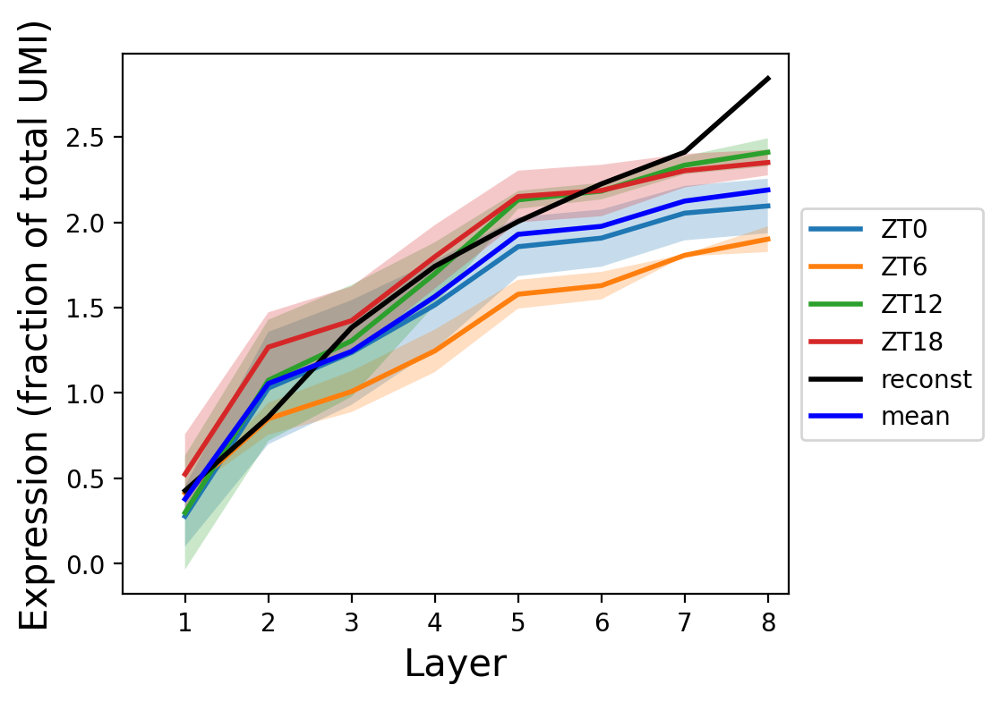

0.990419806661694


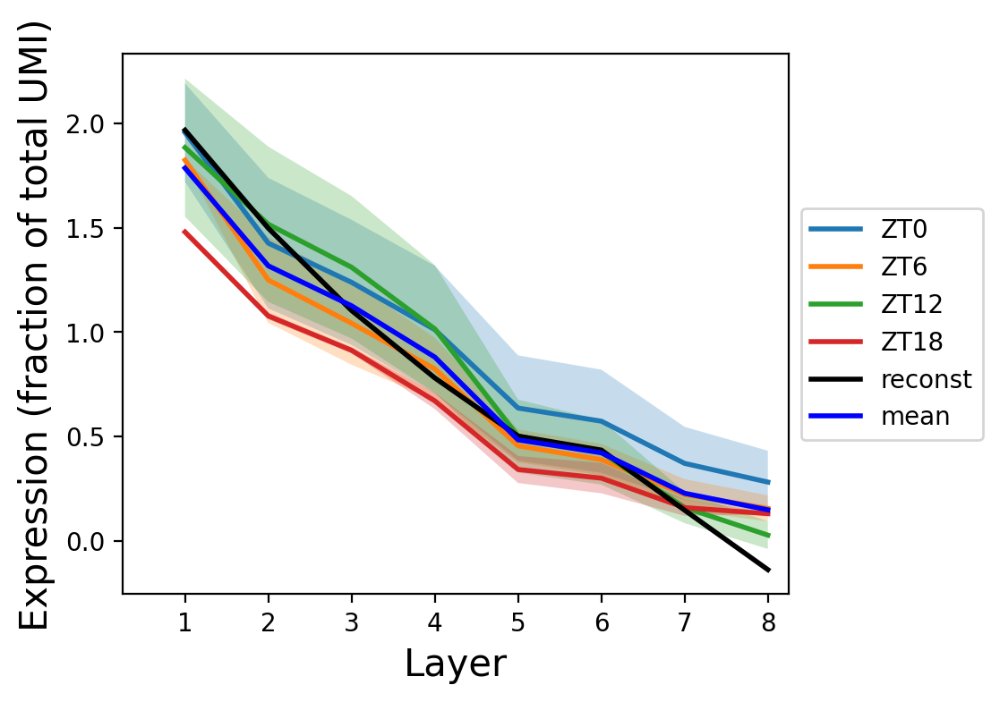

0.9860494020774259


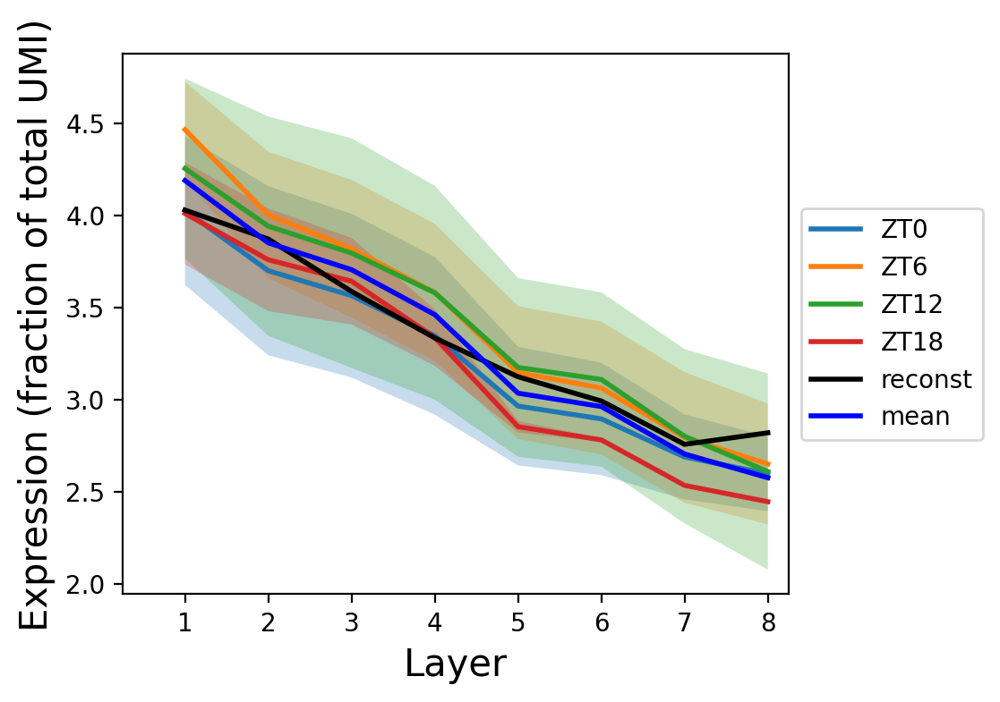

0.9532507851278085


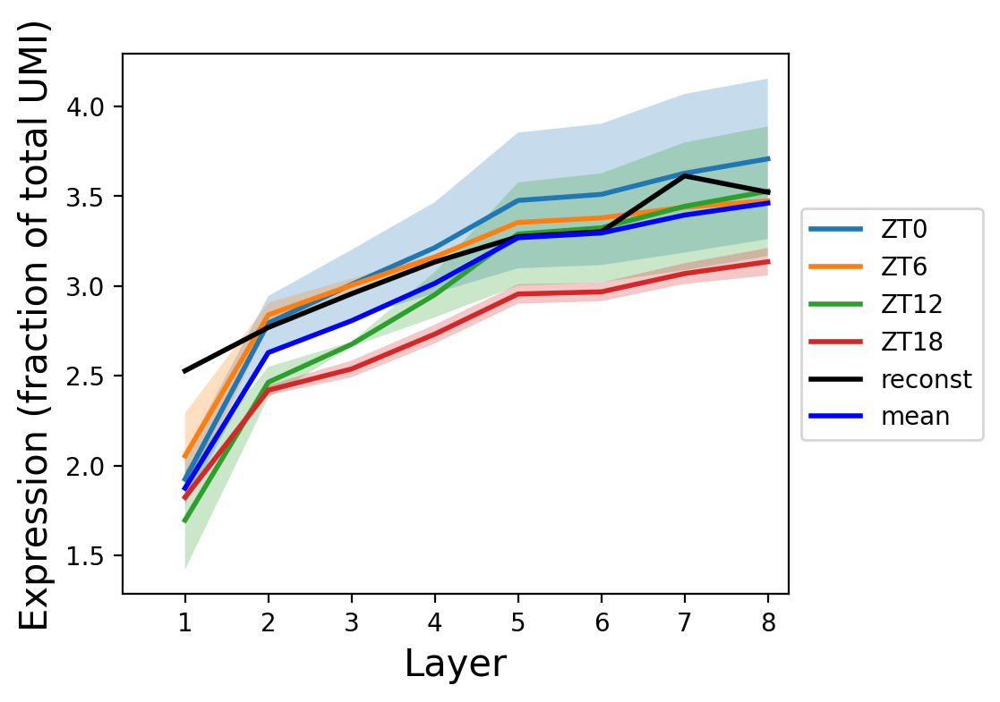

0.9832953712430161


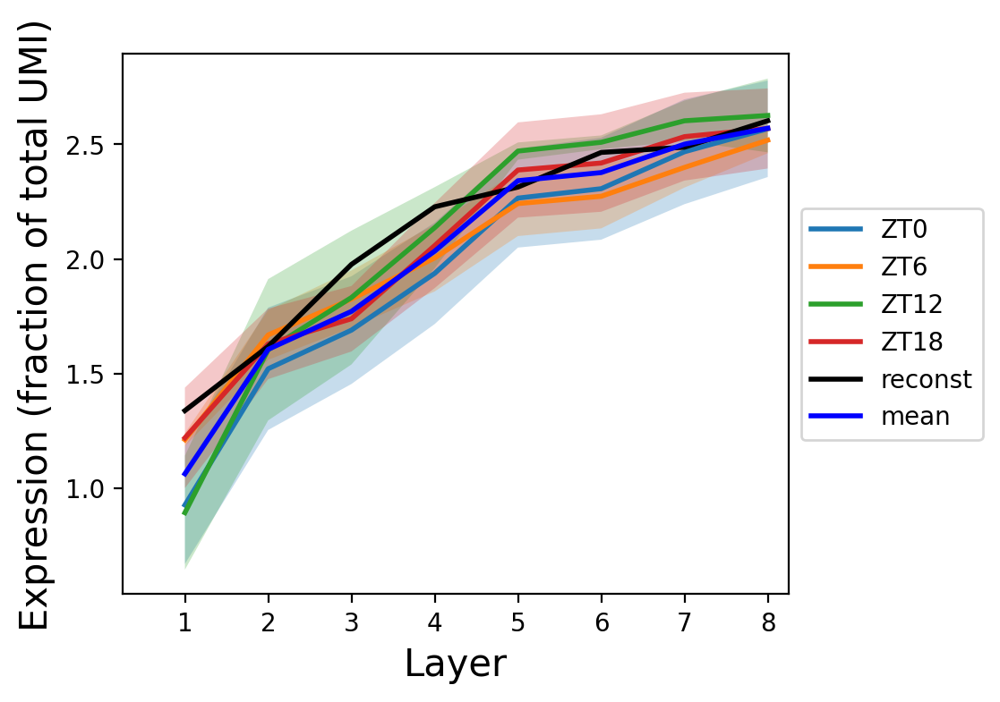

0.9906227666926697


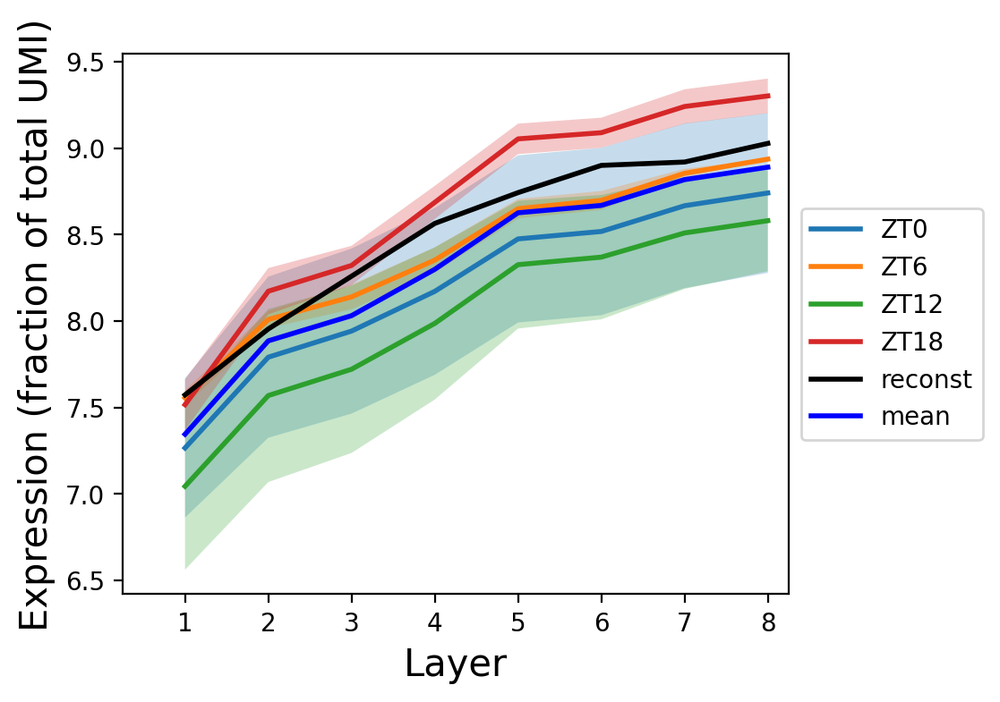

0.8658607396374346


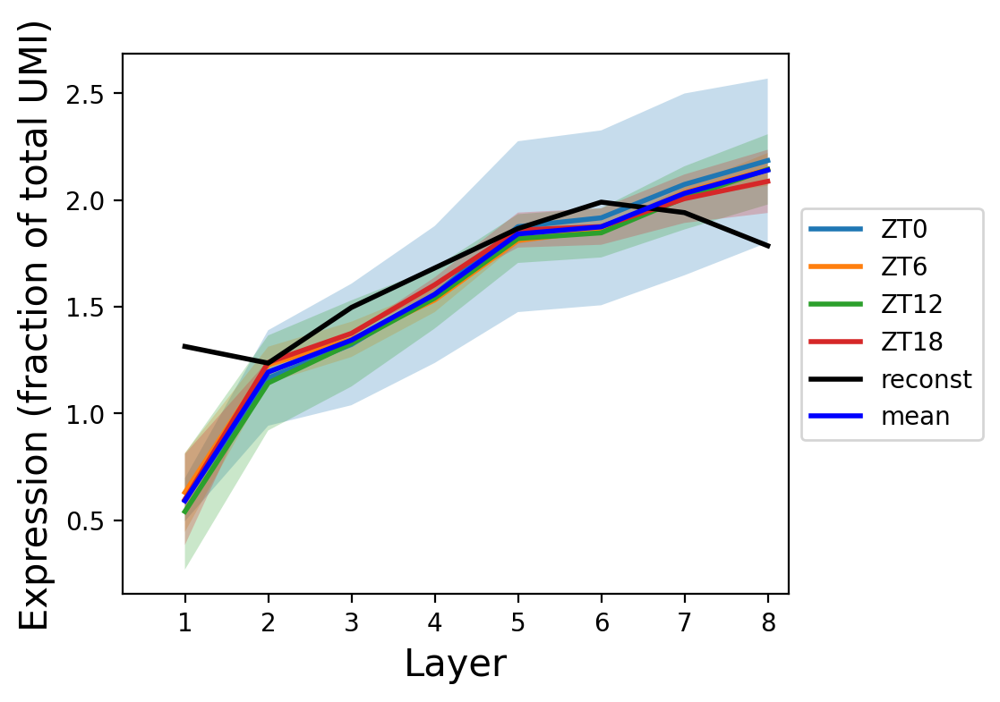

0.9754357821088833


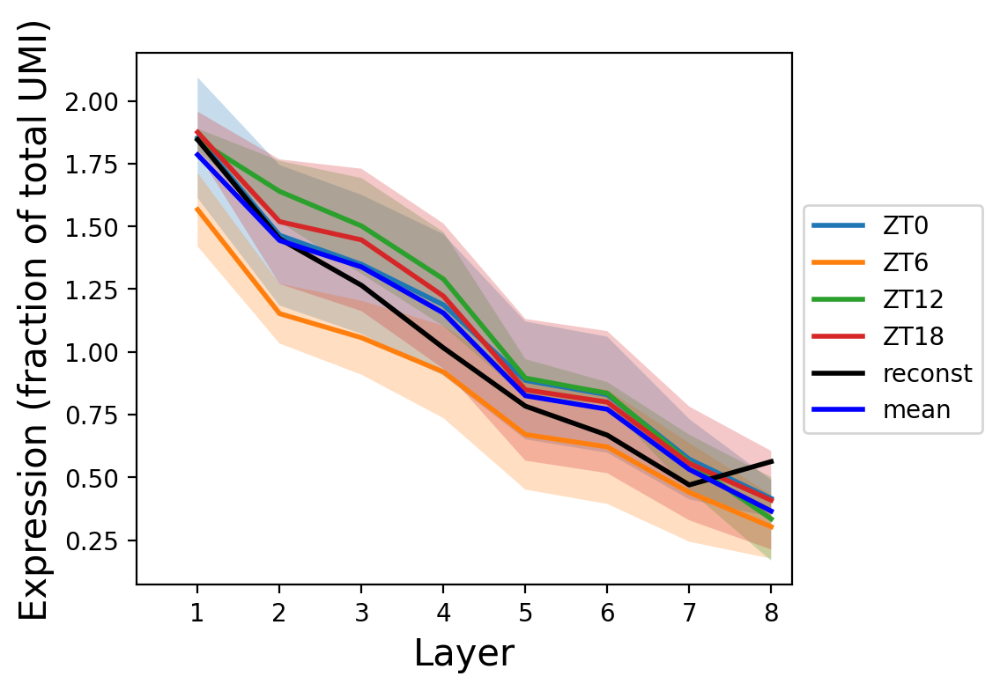

0.977963193323763


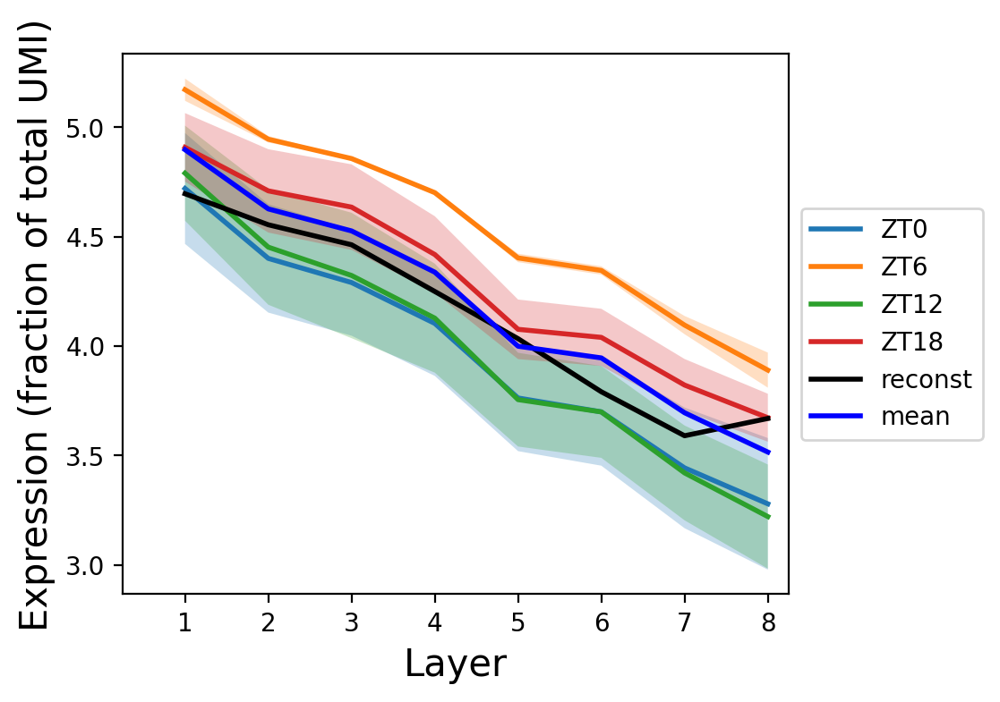

0.8198114803292441


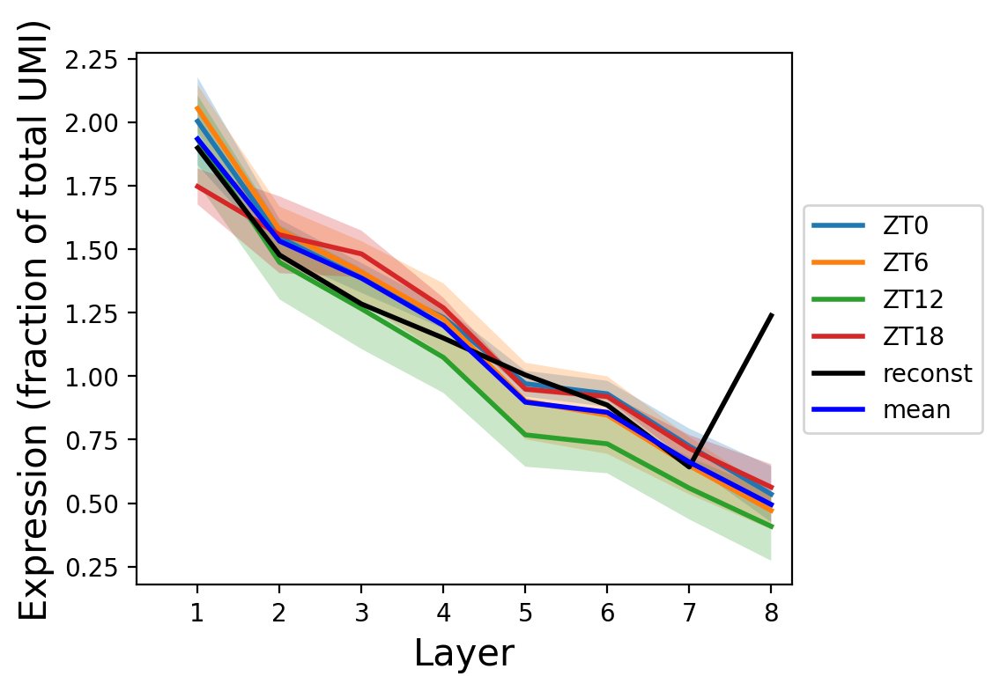

0.9715100630288558


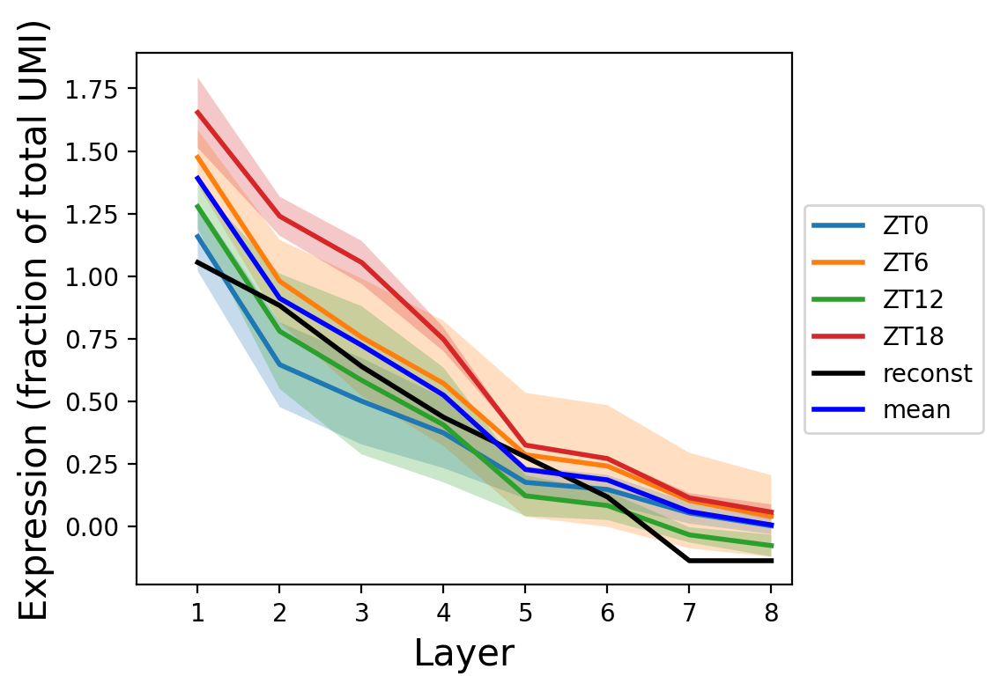

0.9176283494219589


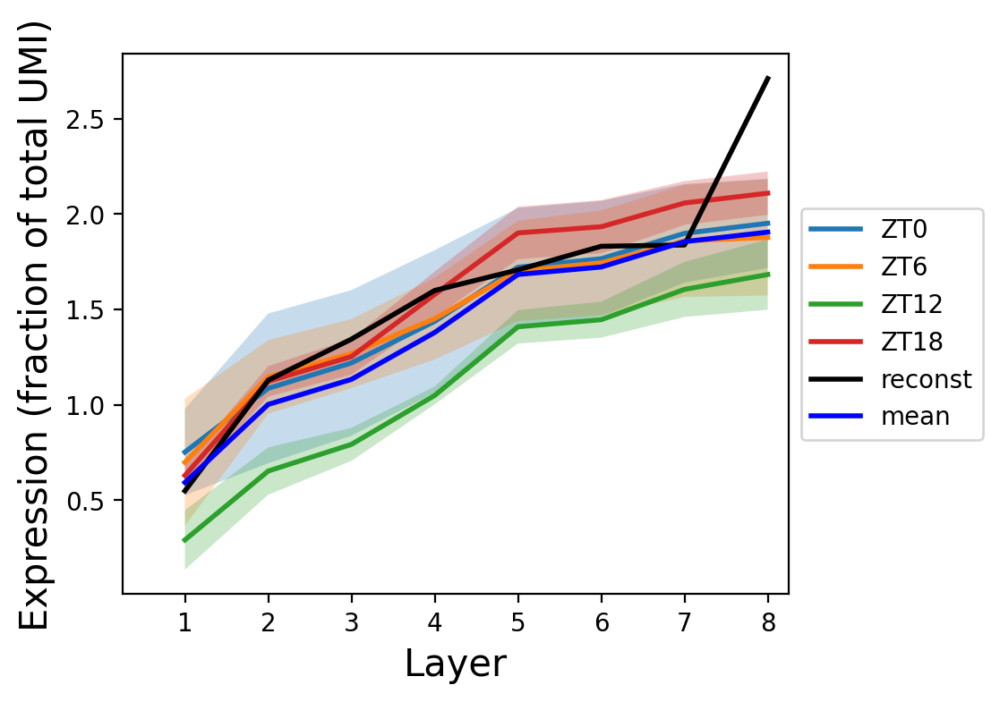

0.909074994472945


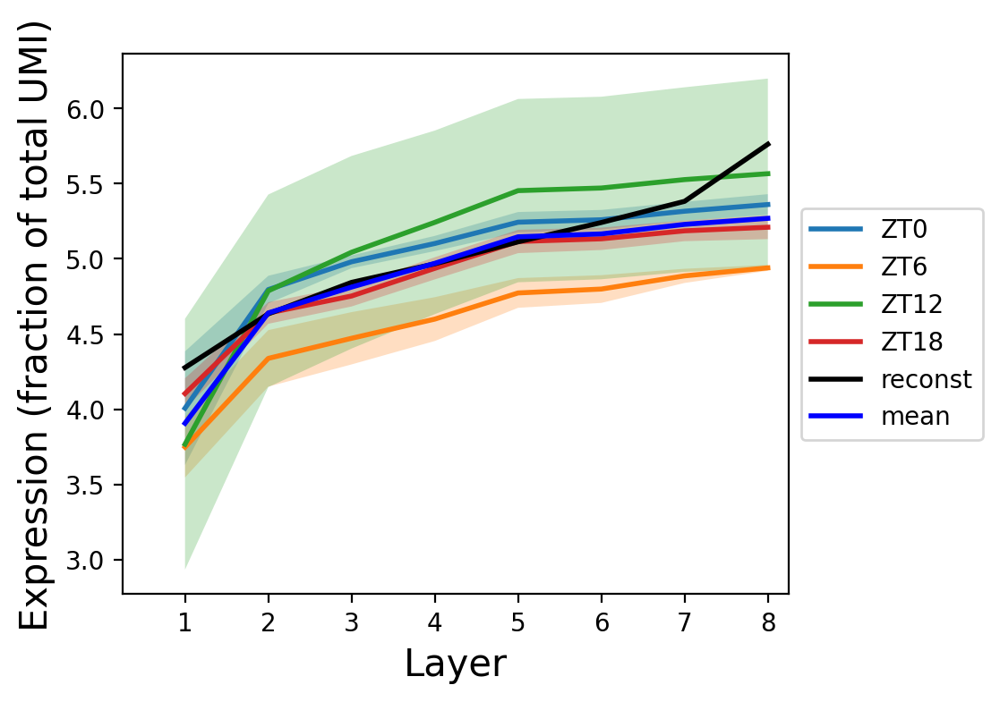

0.9873990891023894


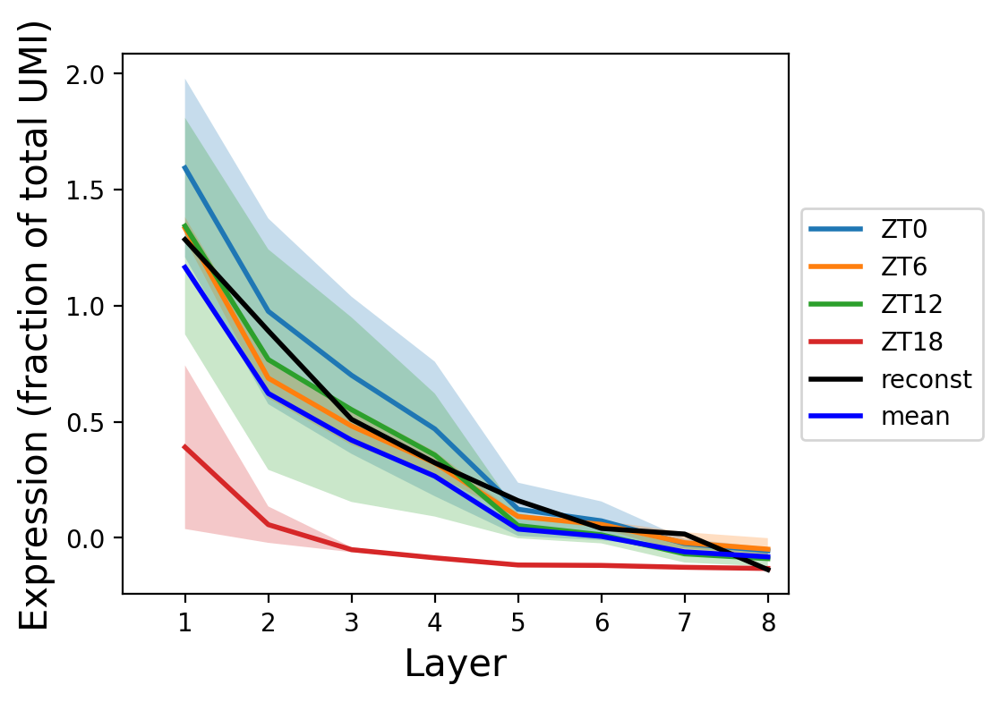

0.9509309405281877


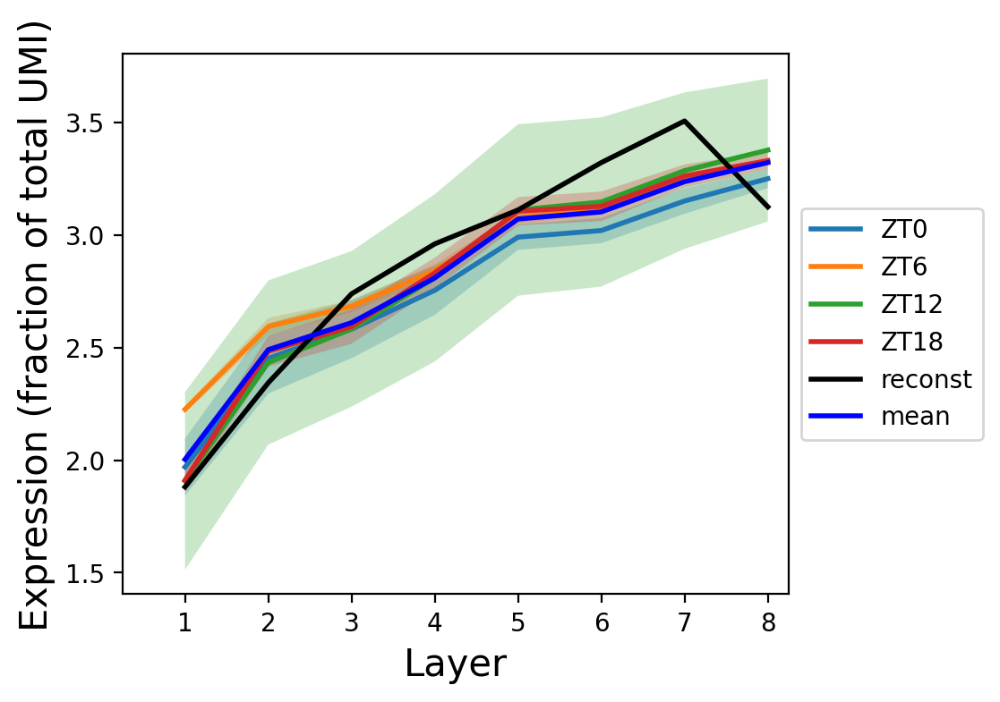

0.9746493931393477


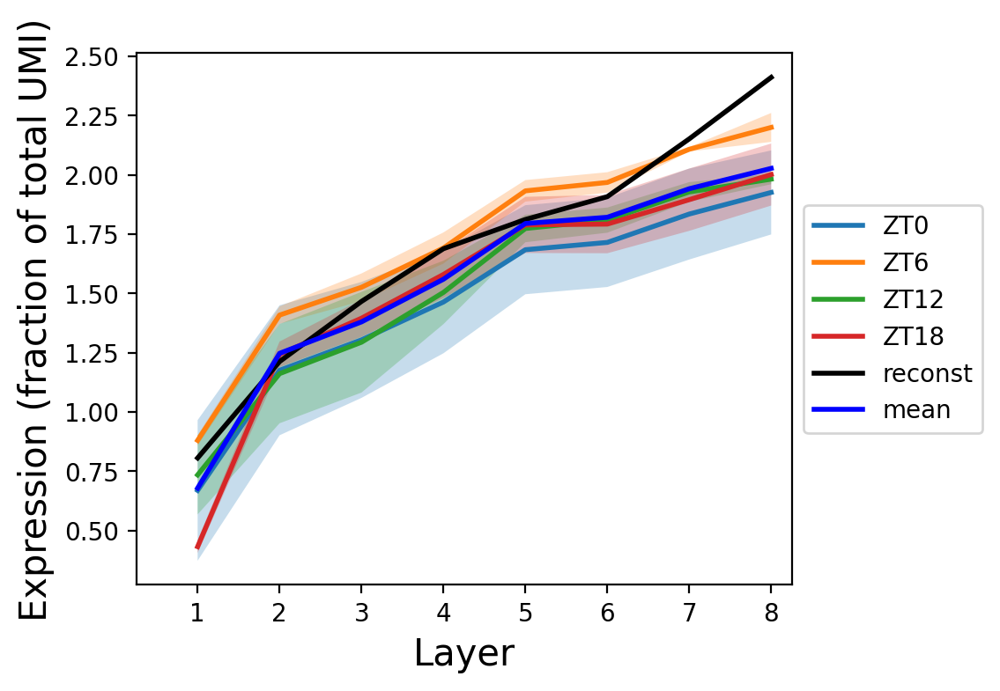

0.8647582608189658


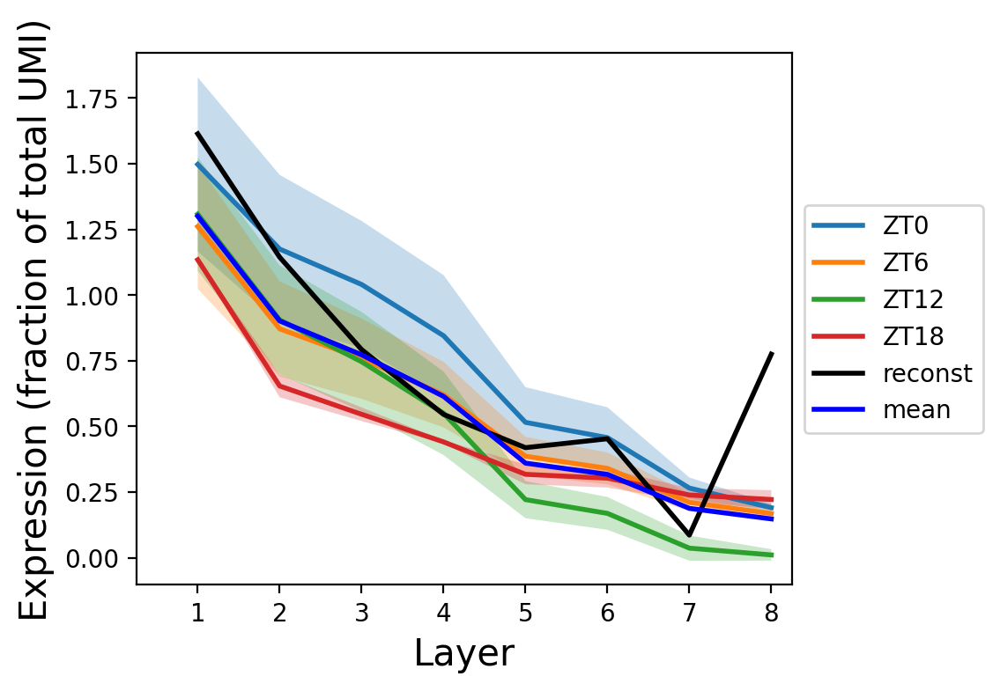

0.9808222674239174


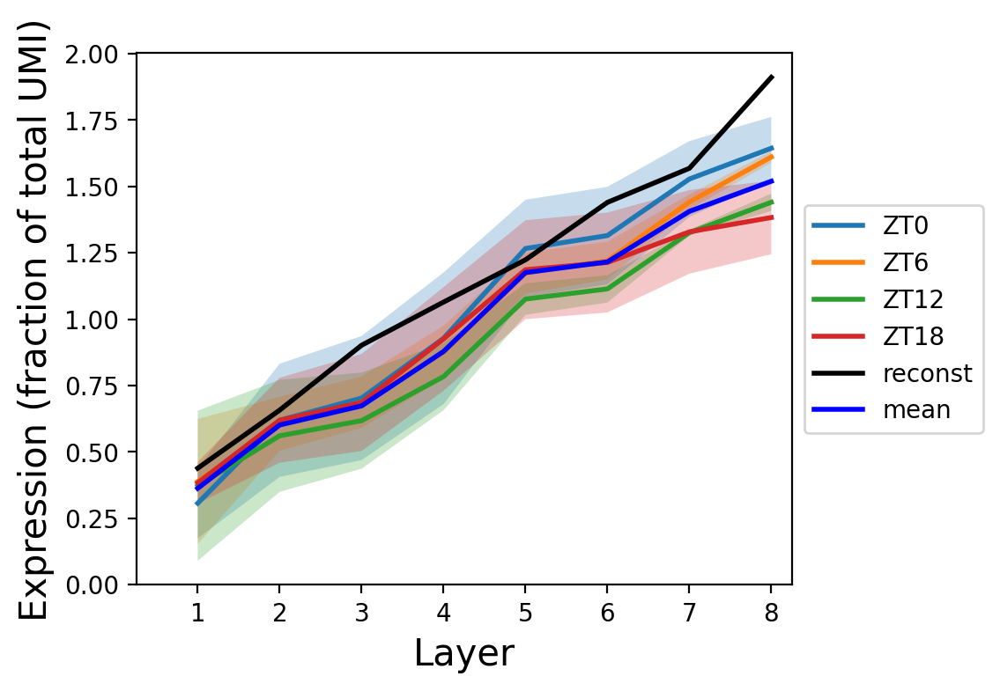

0.8821691608016451


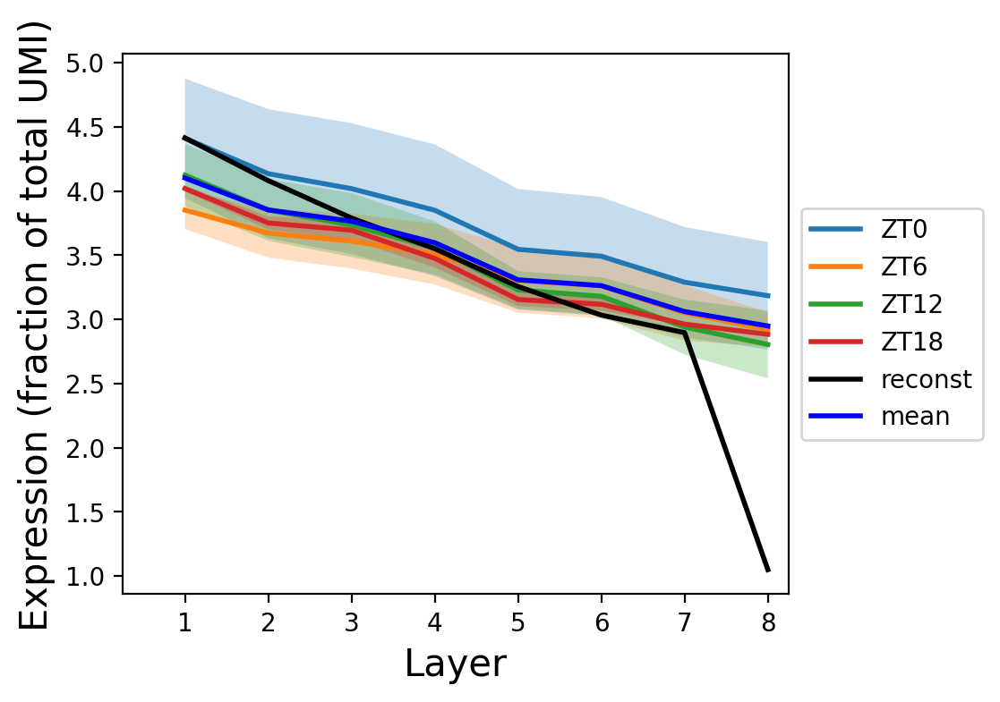

0.9509235948001478


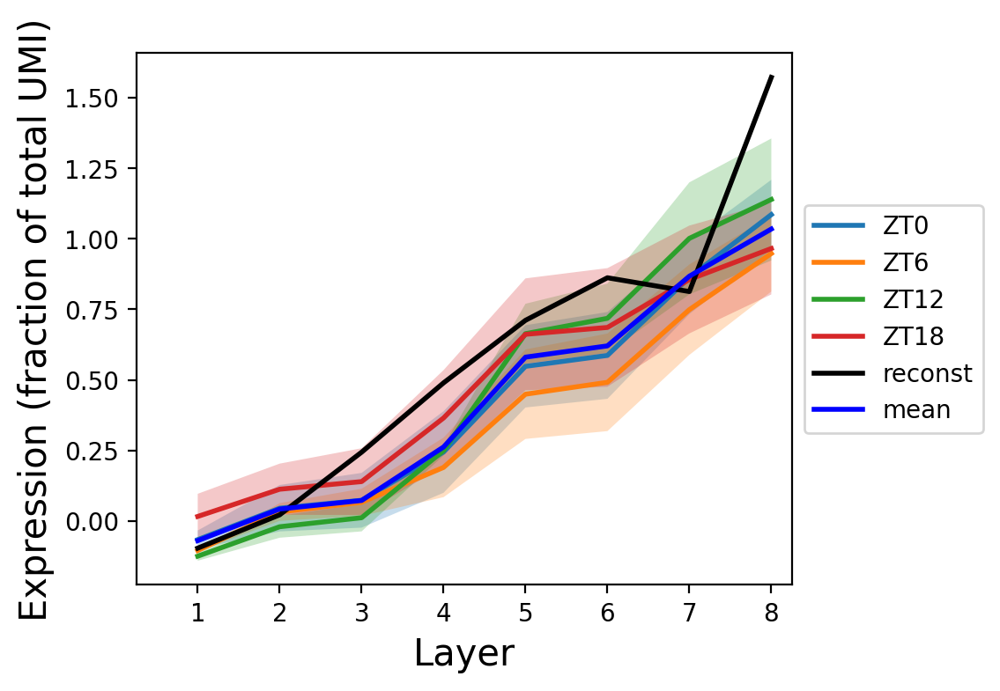

0.8931032535359664


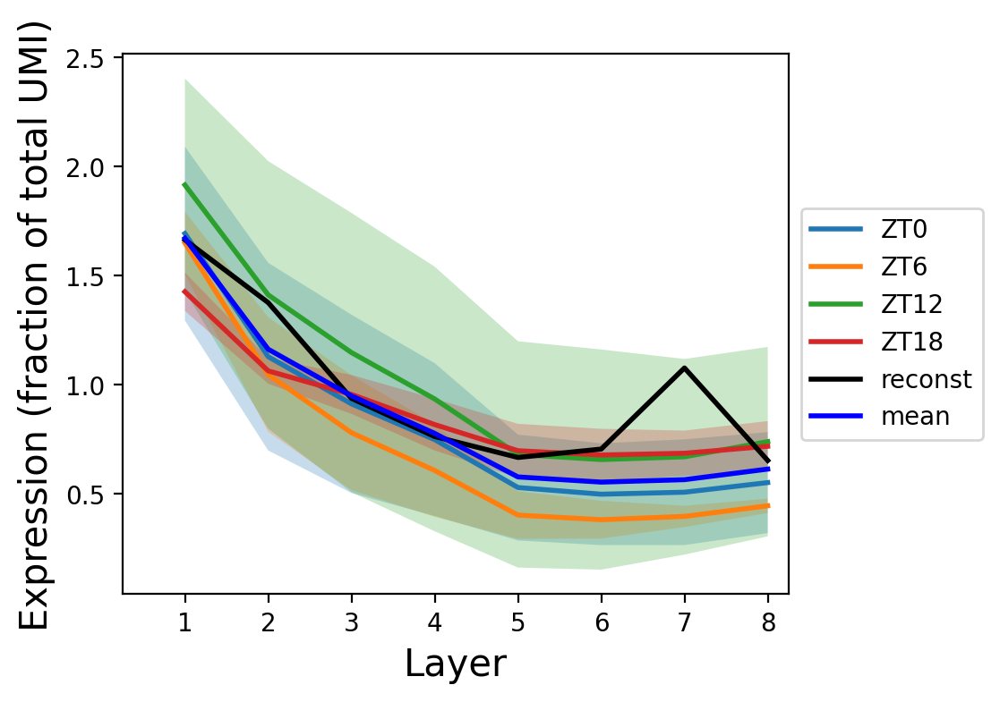

0.9549461087938836


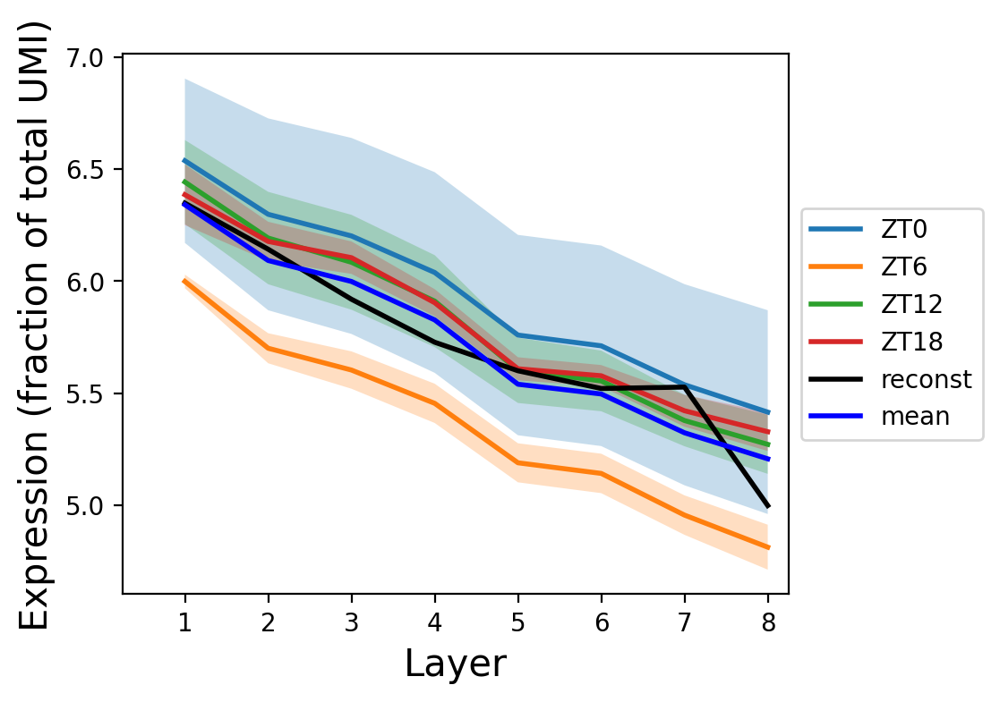

0.3484059911580224


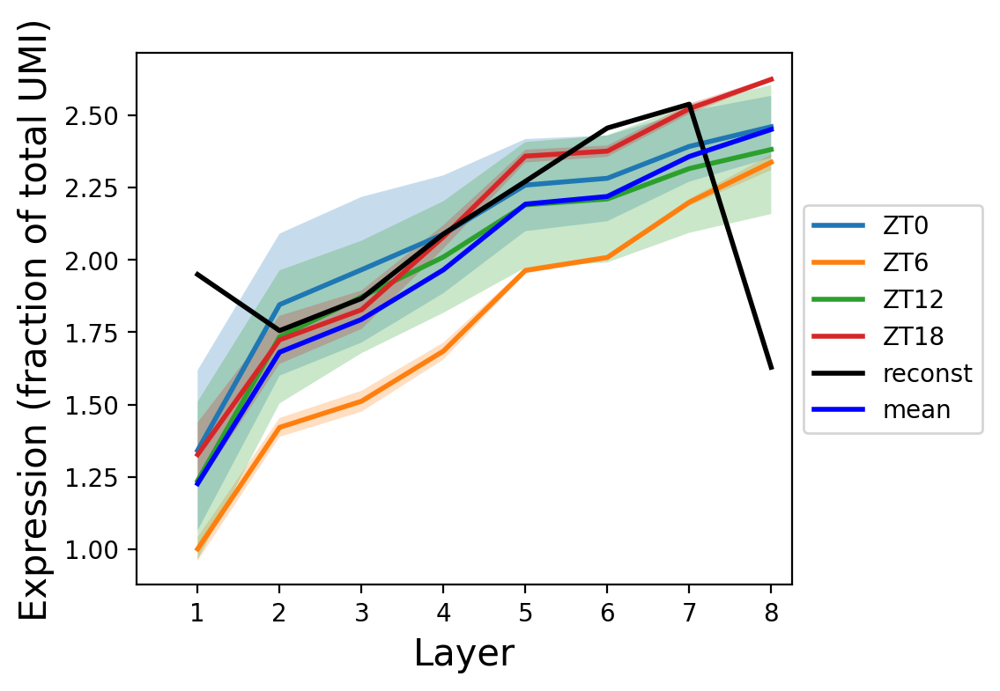

0.8872214877679186


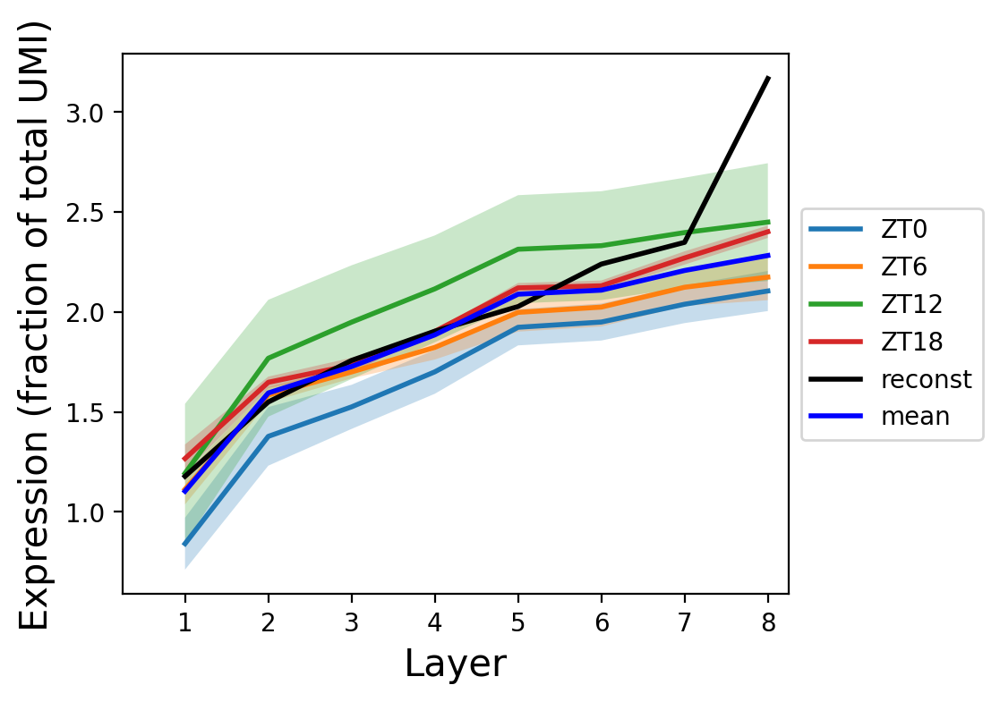

0.9899571522743561


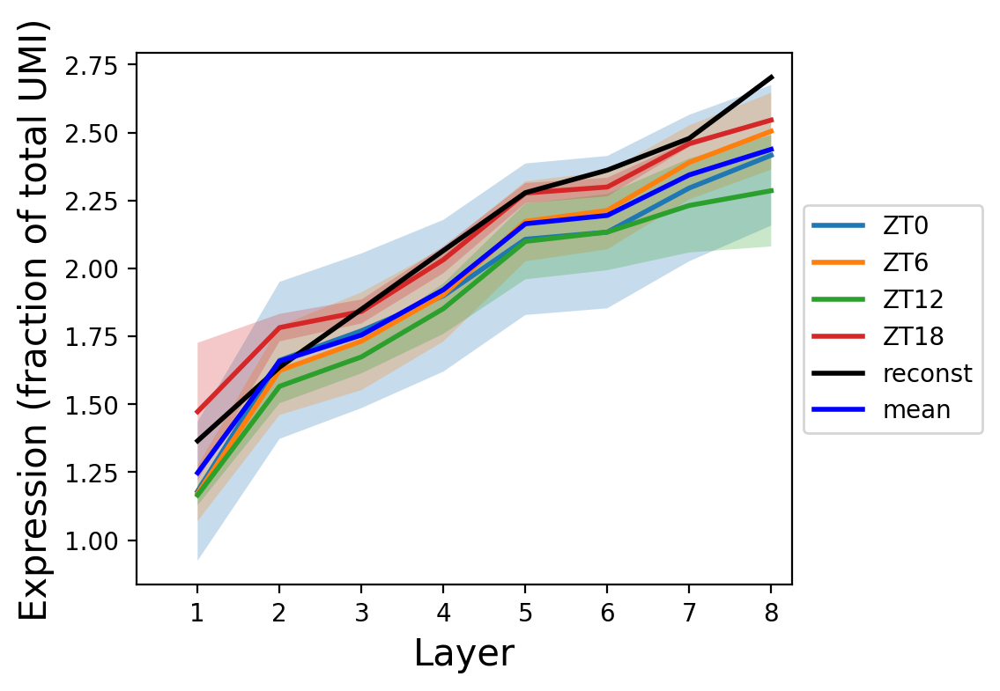

0.9015658164428523


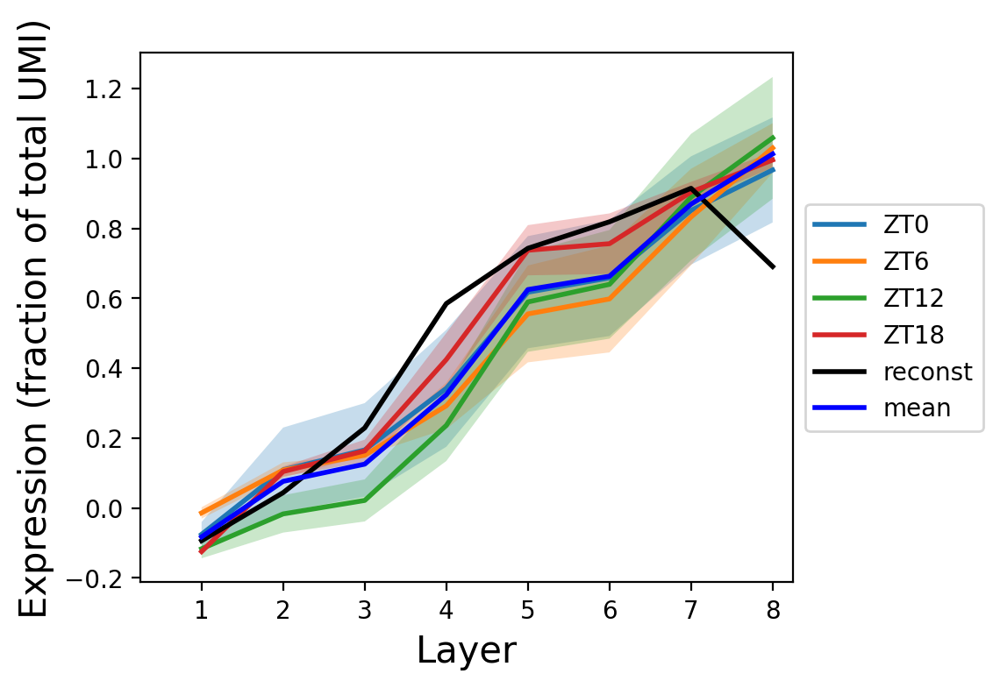

0.8935431529622694


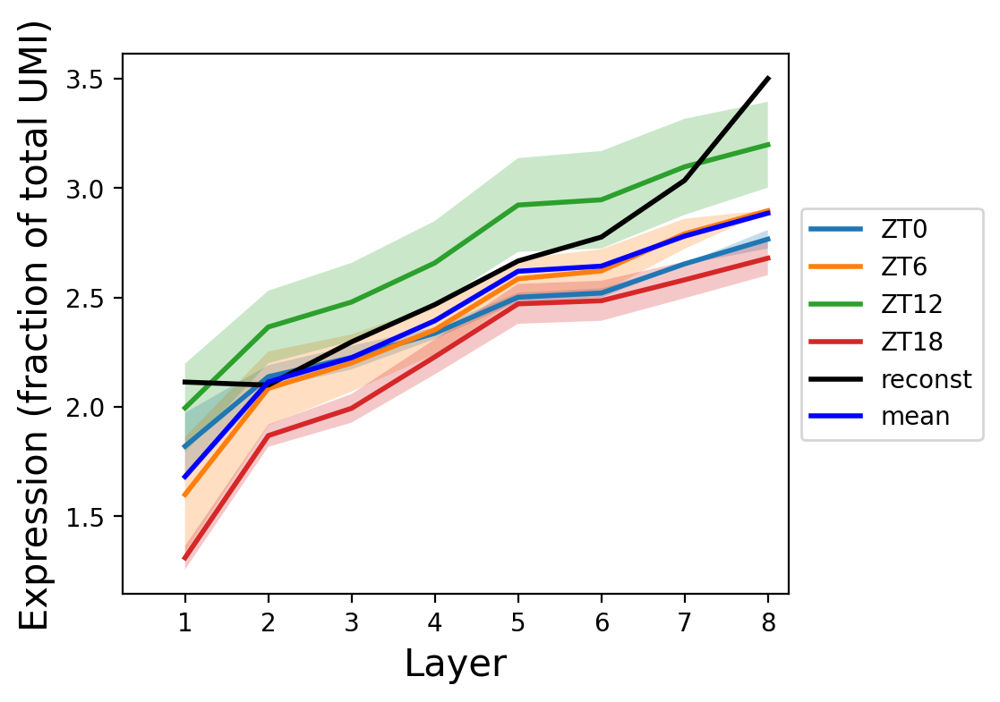

0.7093475650439162


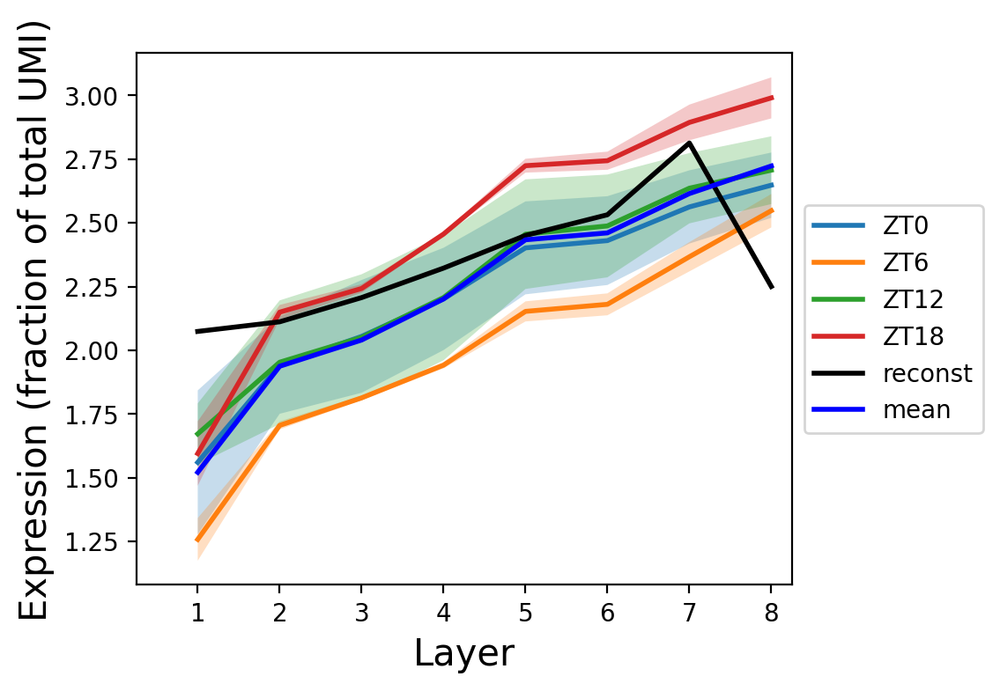

0.6487607216430404


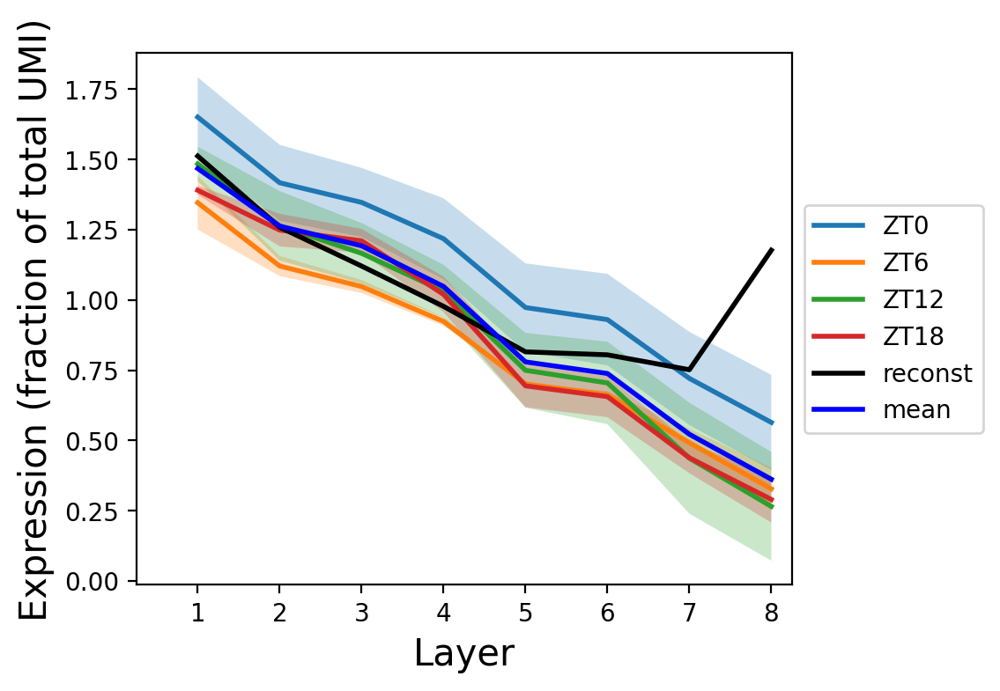

0.9723973018986819


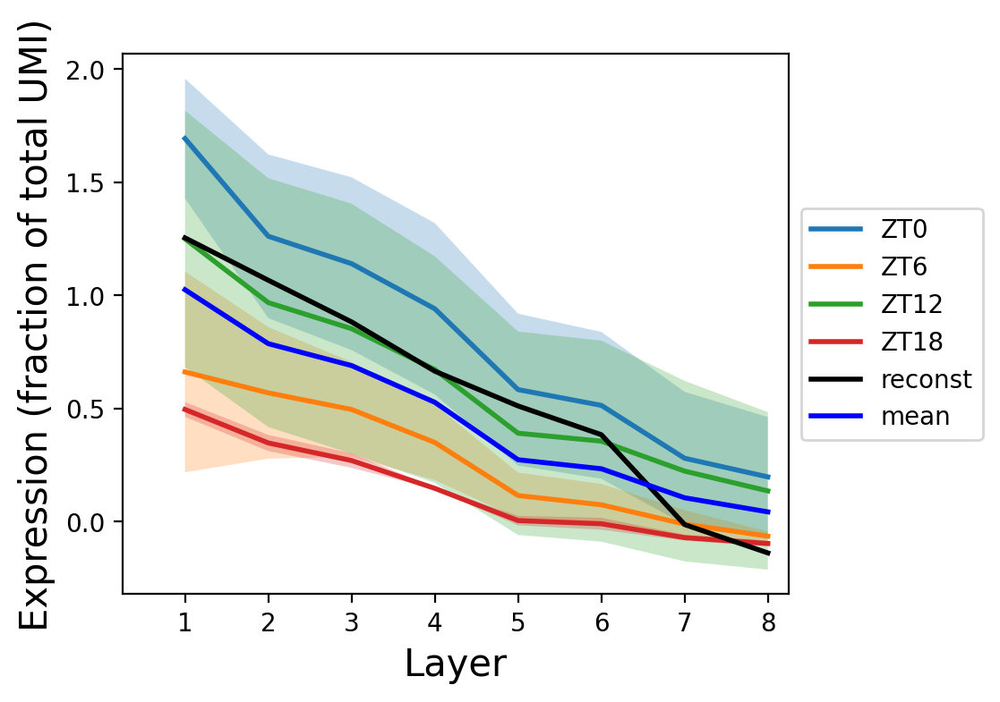

0.9475454323800379


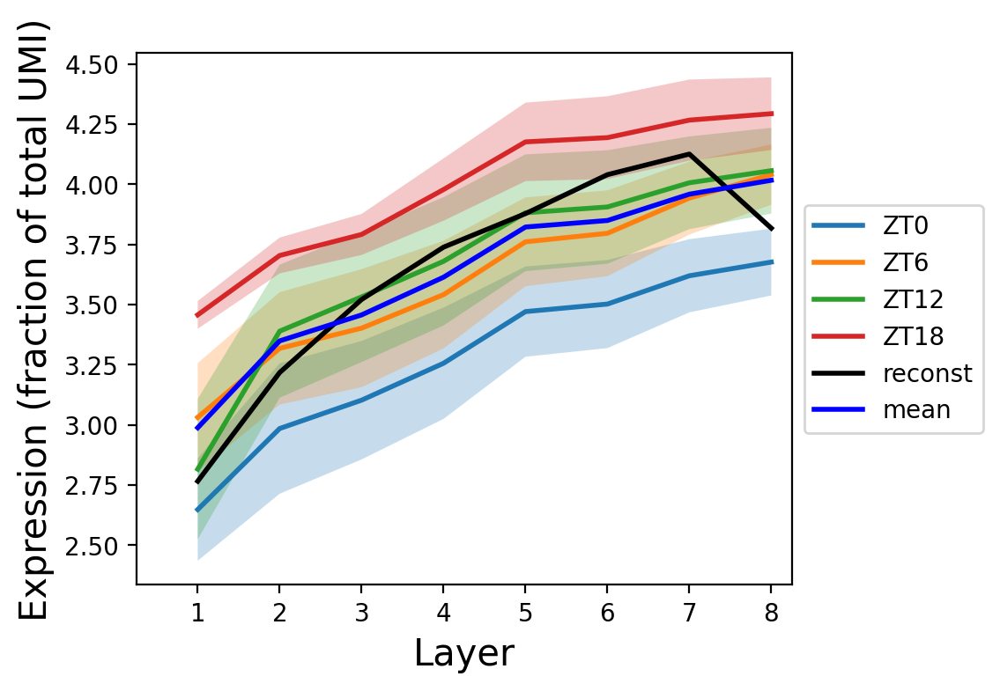

-0.22572609499437996


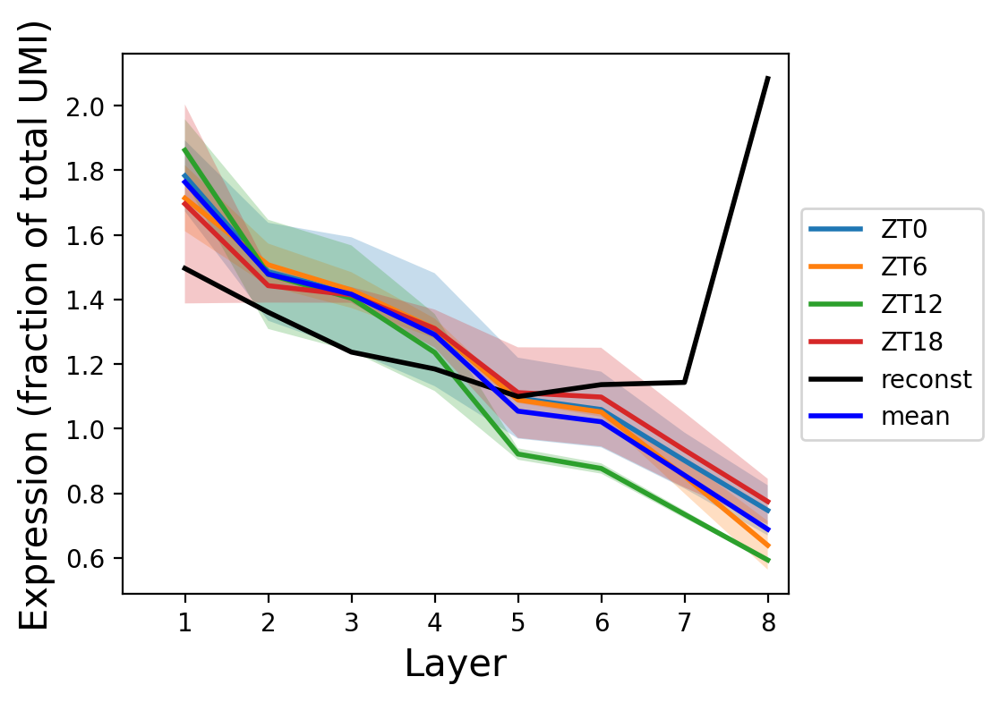

0.8400044975157237


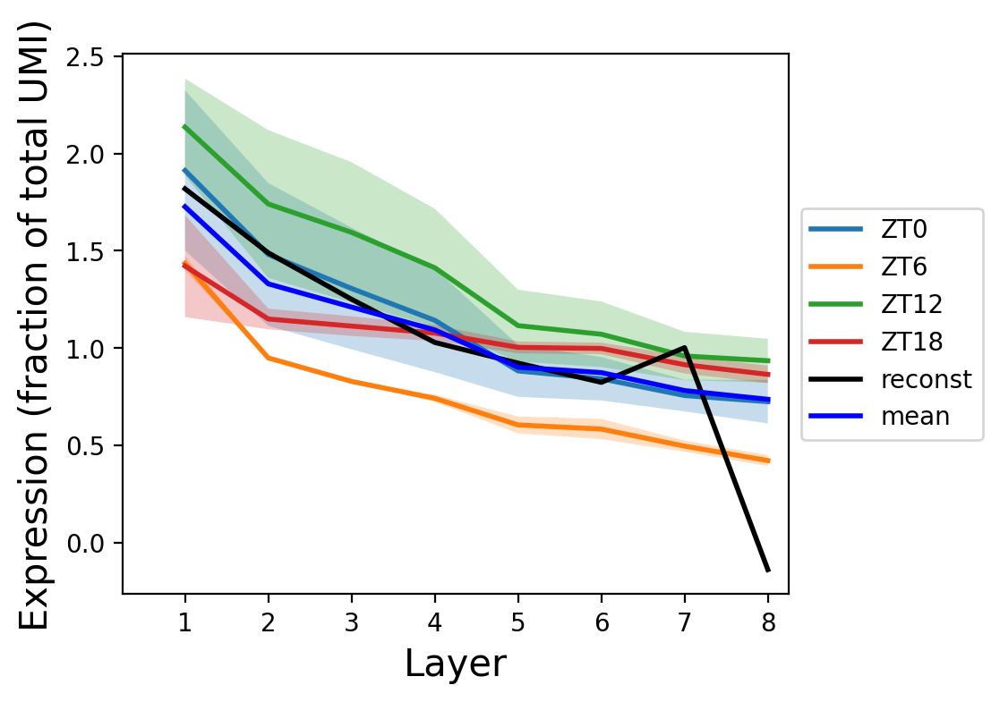

0.9894949543023311


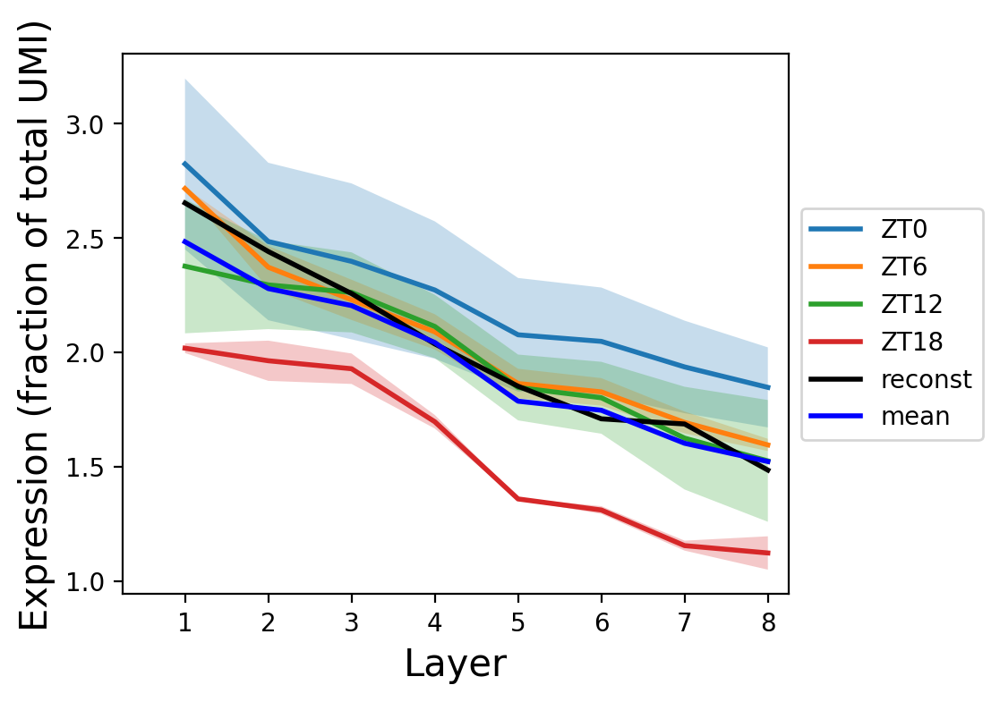

0.8735412287494221


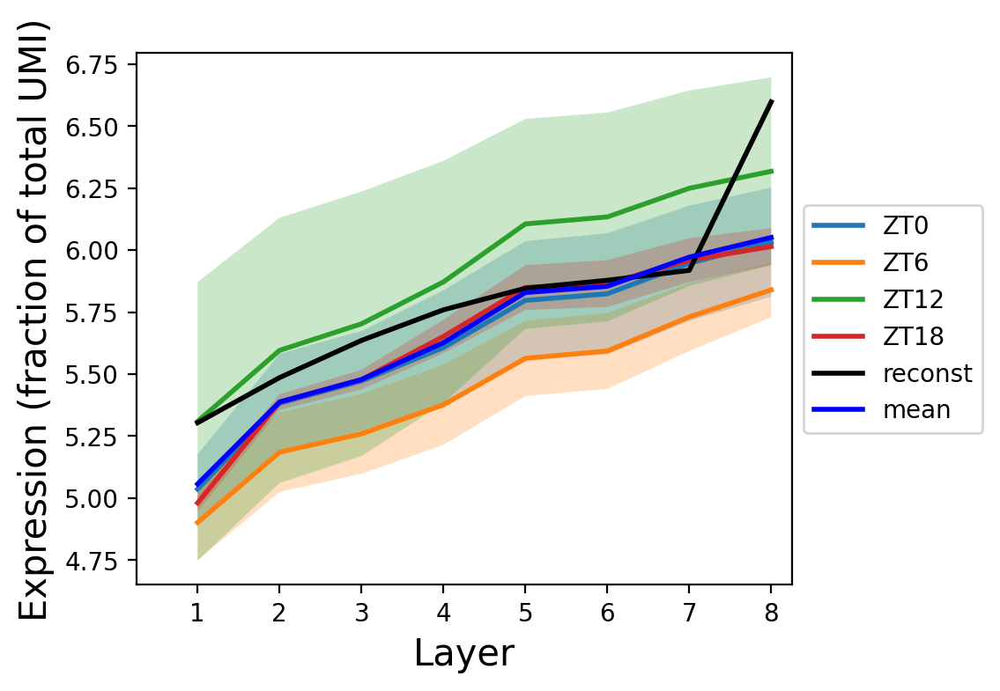

0.8014562740915449


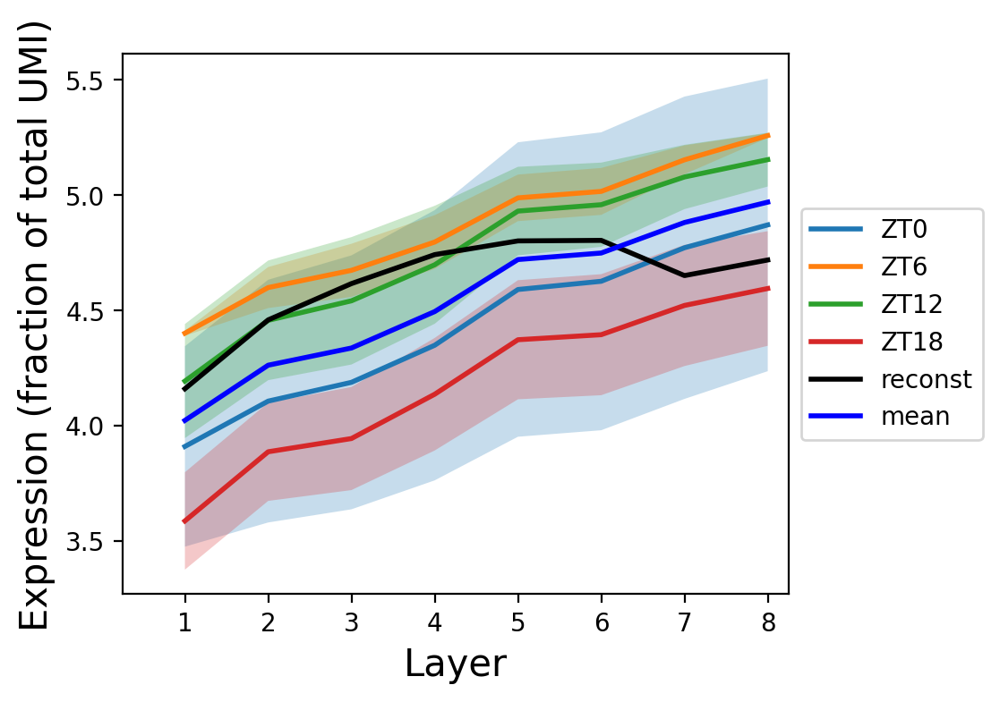

0.8944224326891971


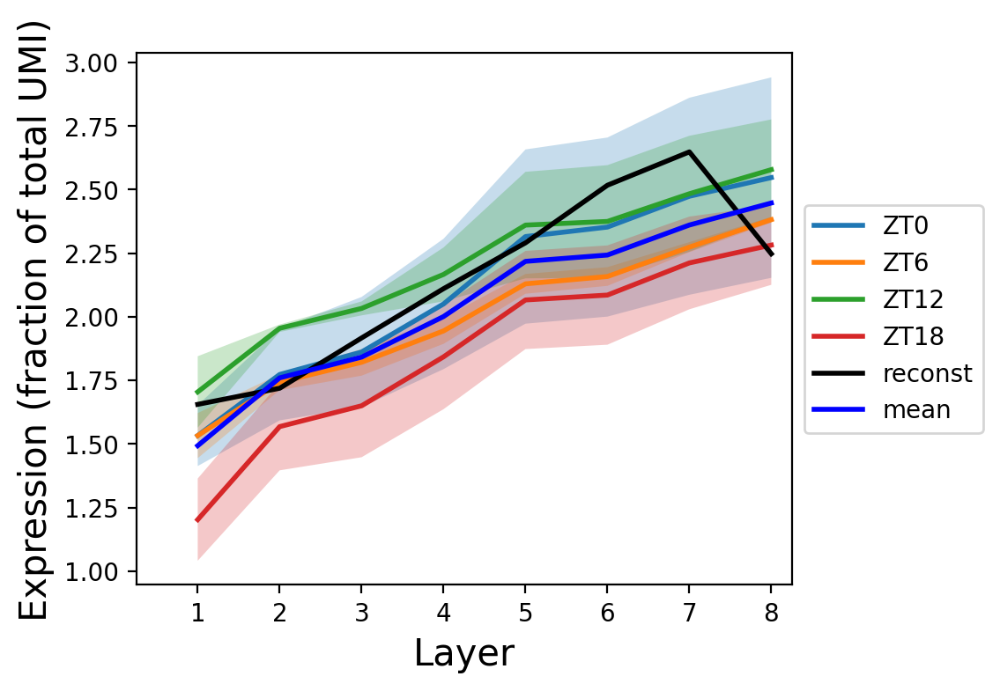

0.8431619157970636


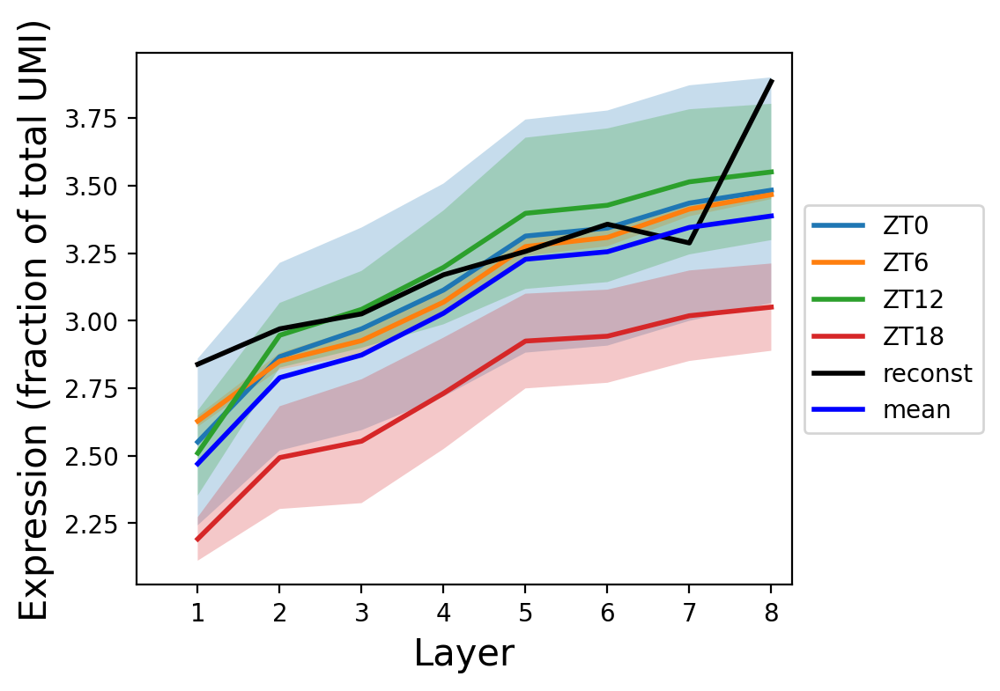

0.8880167257254824


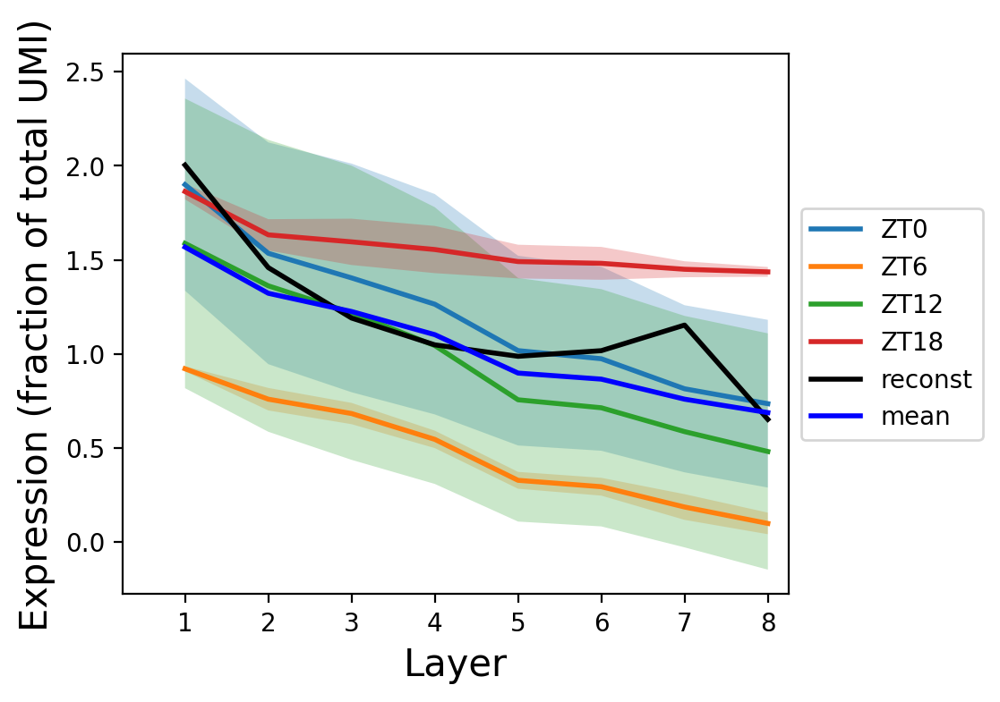

0.9781441003945683


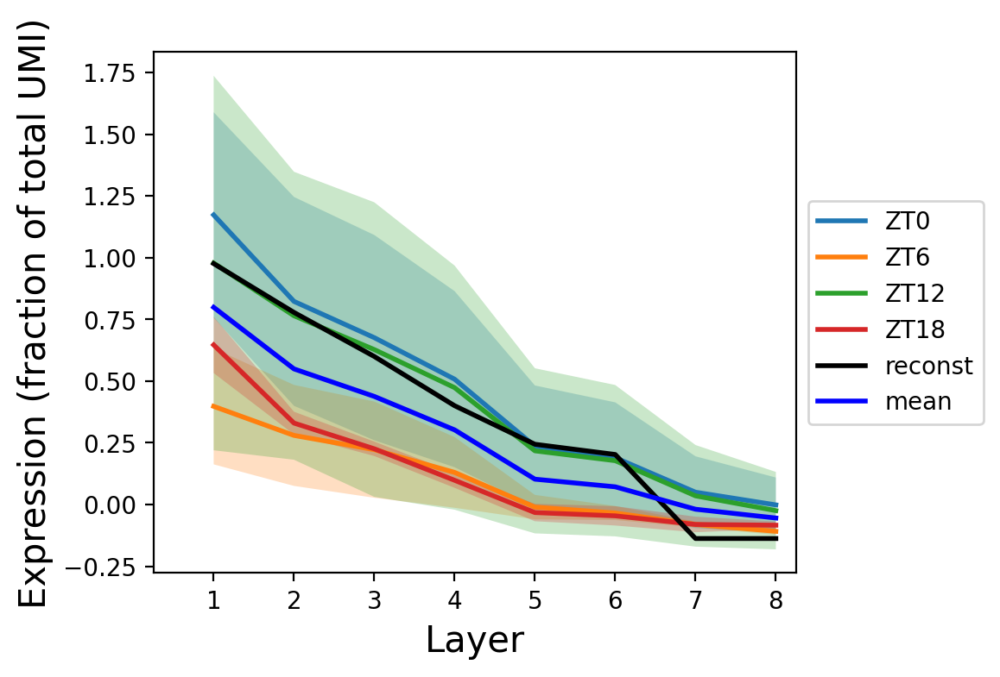

0.9095632587051049


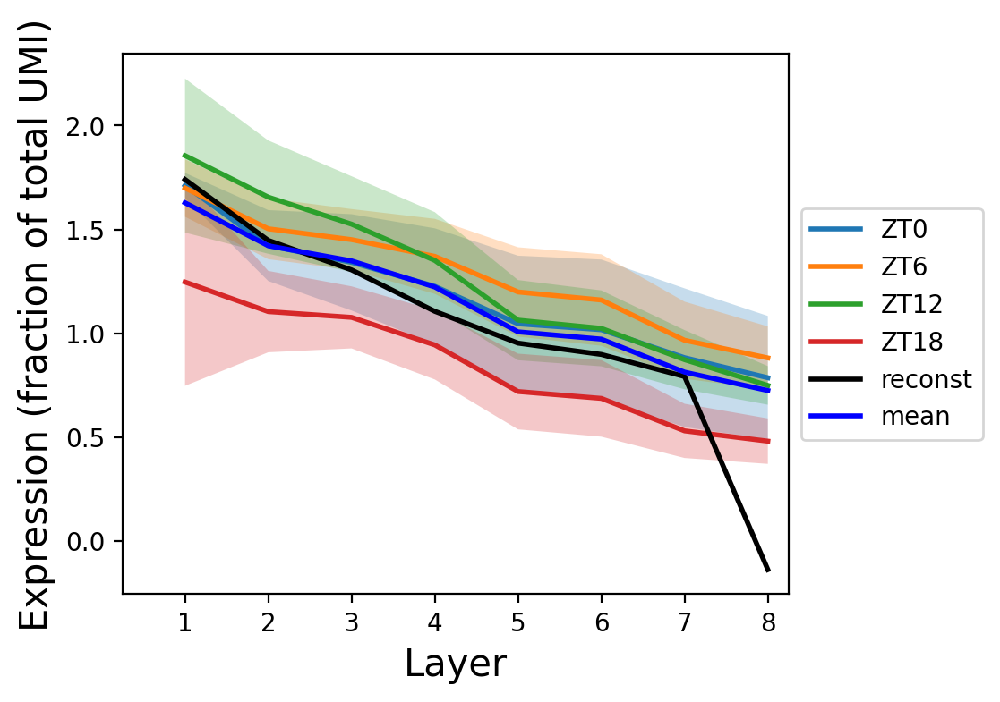

0.961156062646113


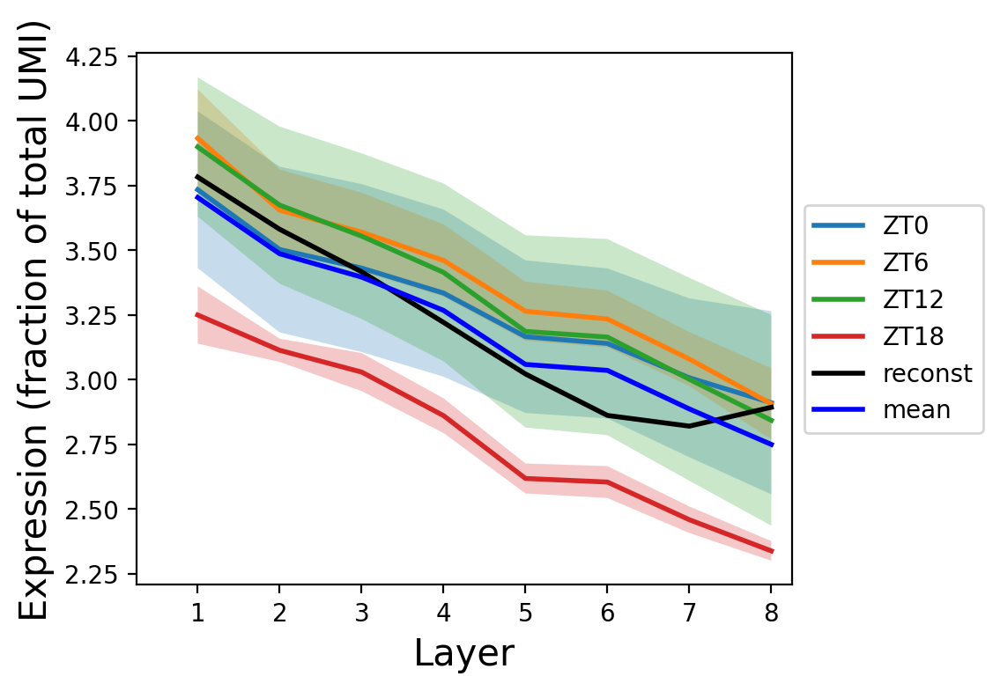

0.7066135837722682


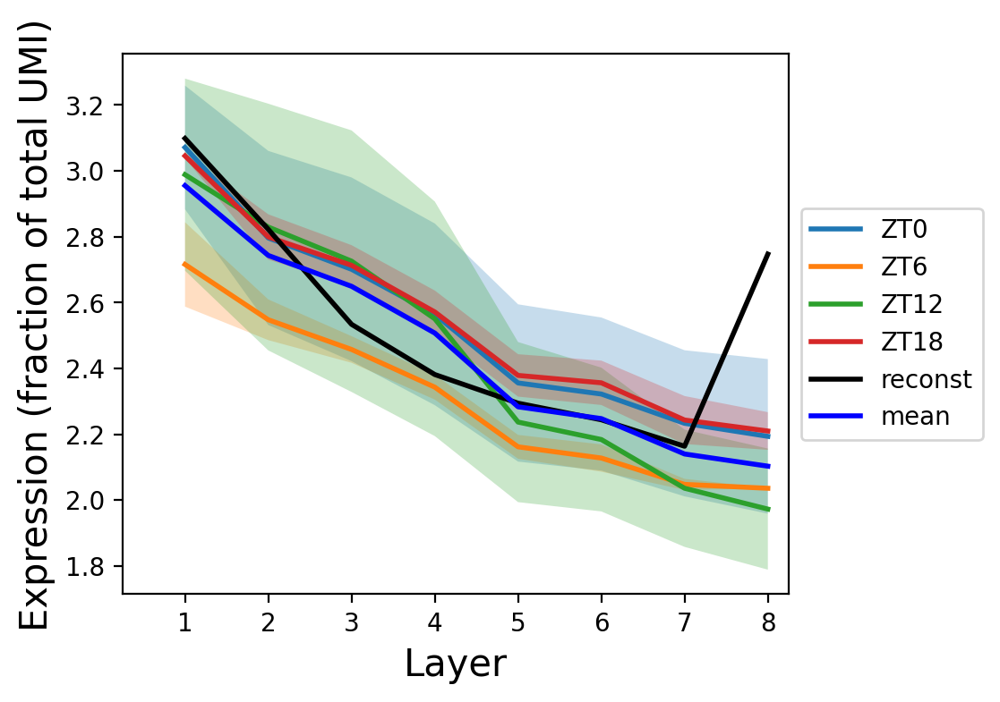

0.6832060481210137


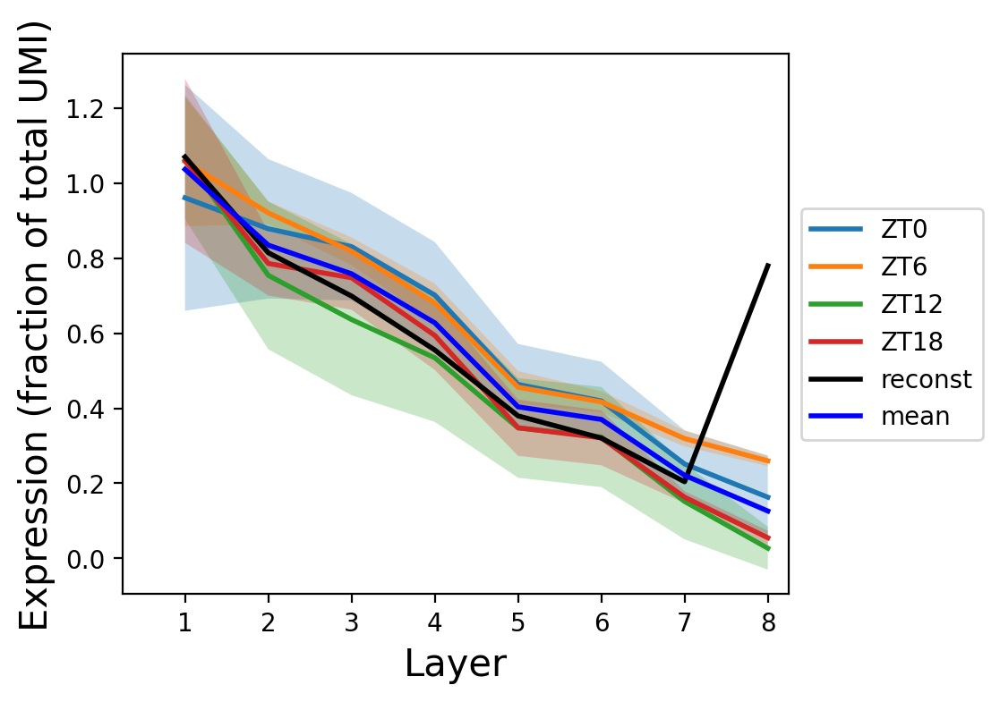

0.9326467123557108


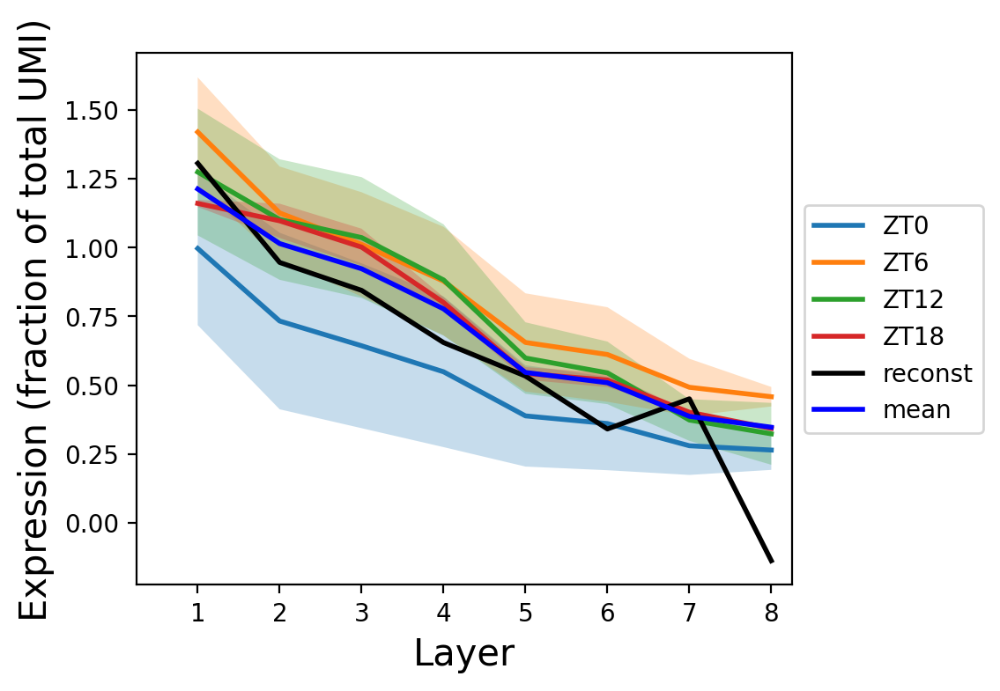

0.9333049452808954


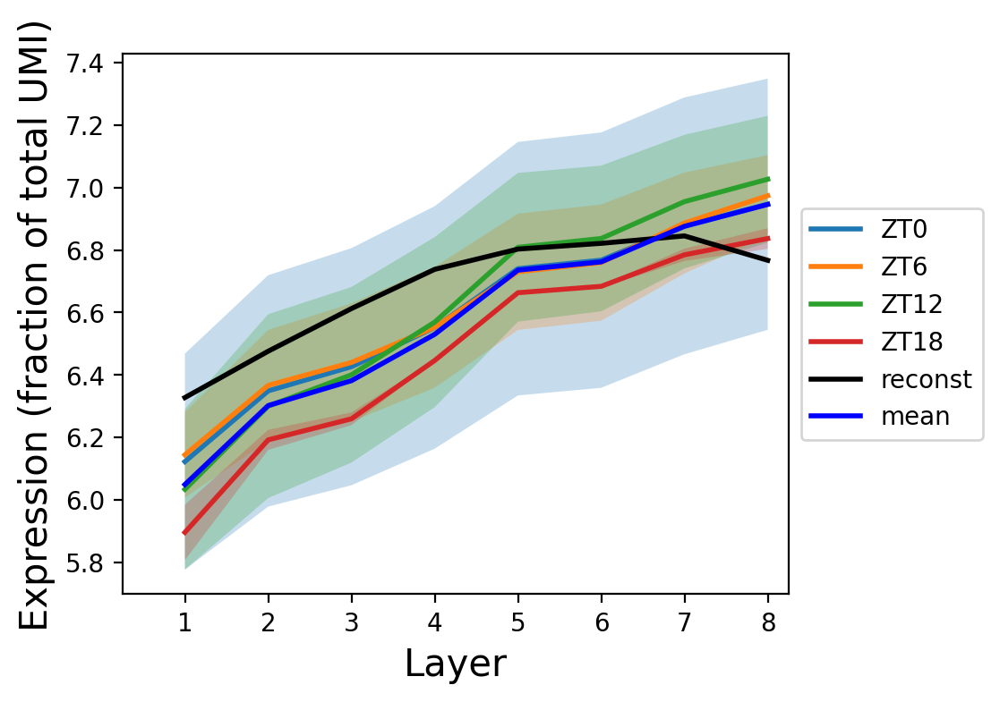

0.567290047474872


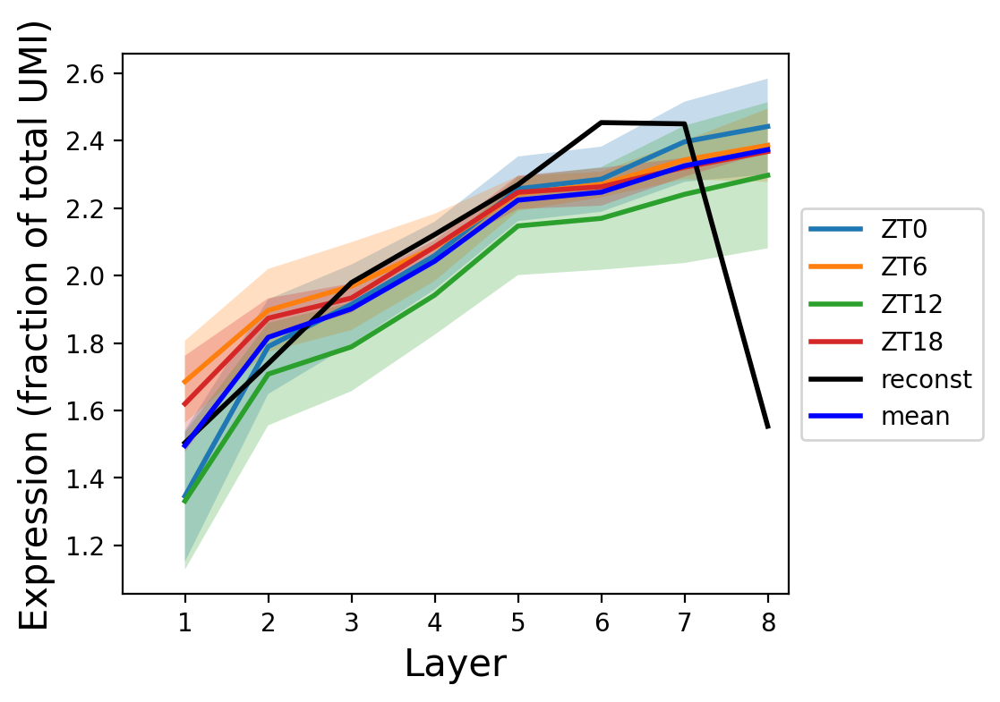

0.2494432477114533


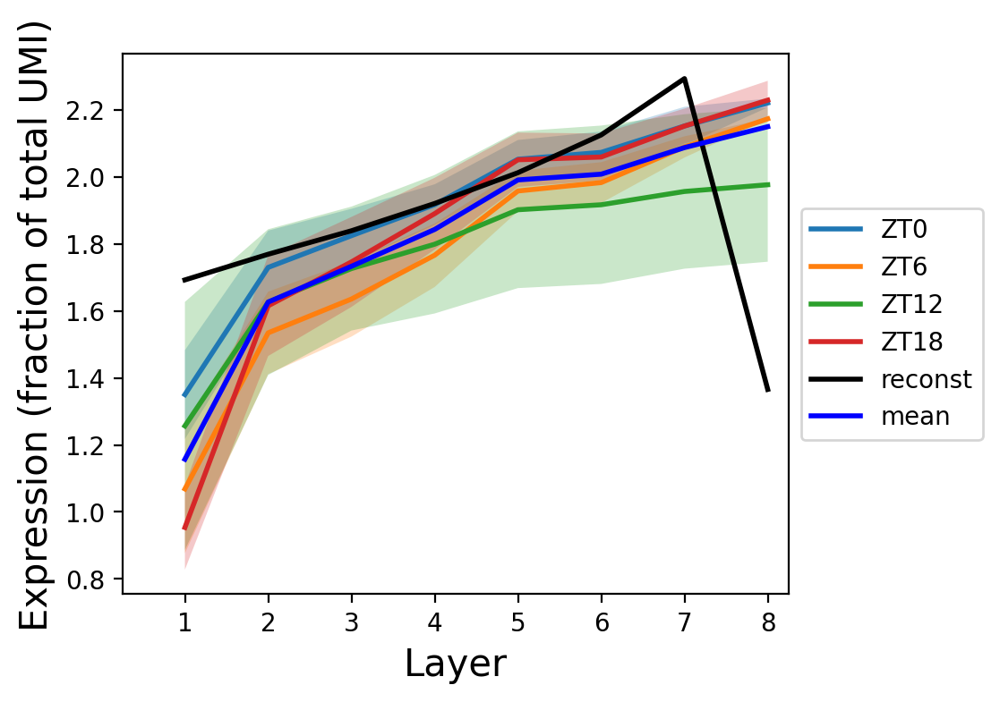

-0.6798035060414283


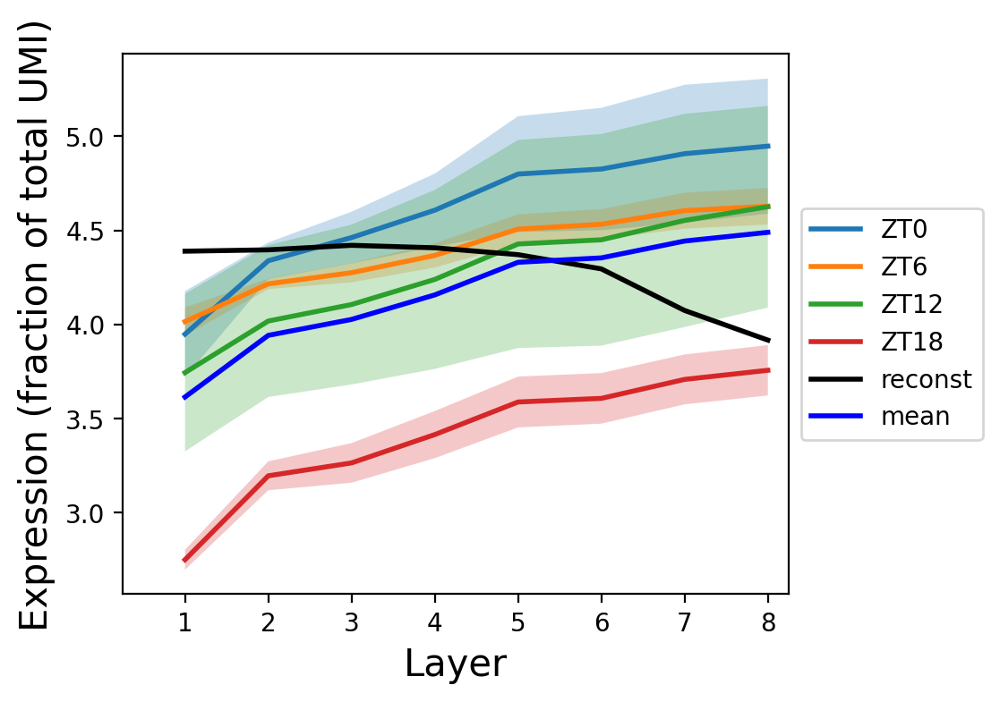

0.7426193483486778


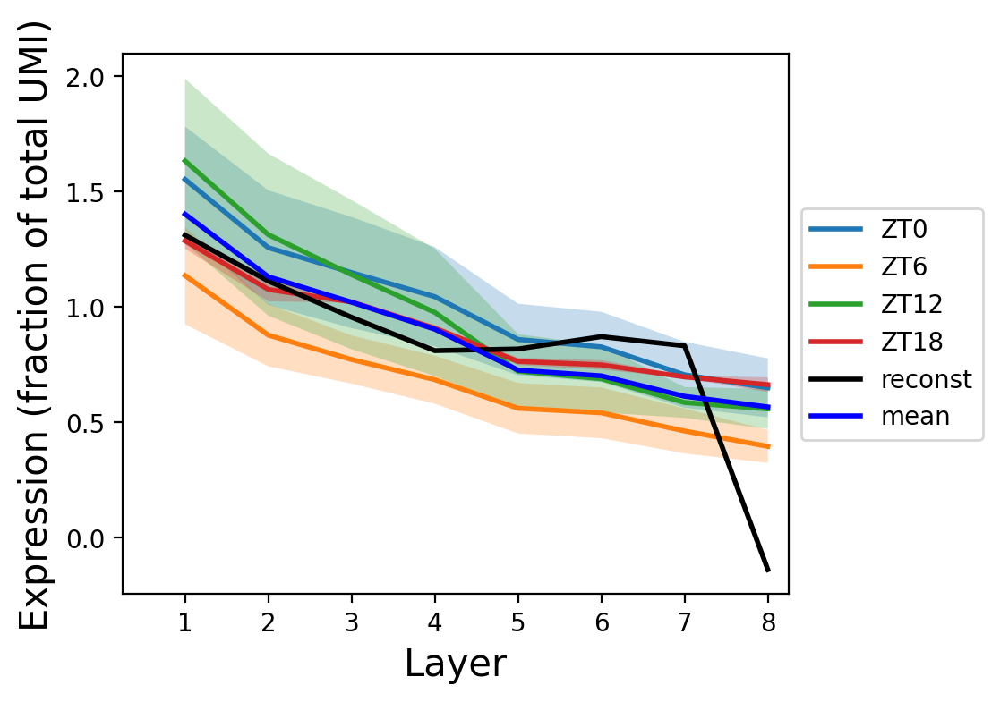

0.9816423959373599


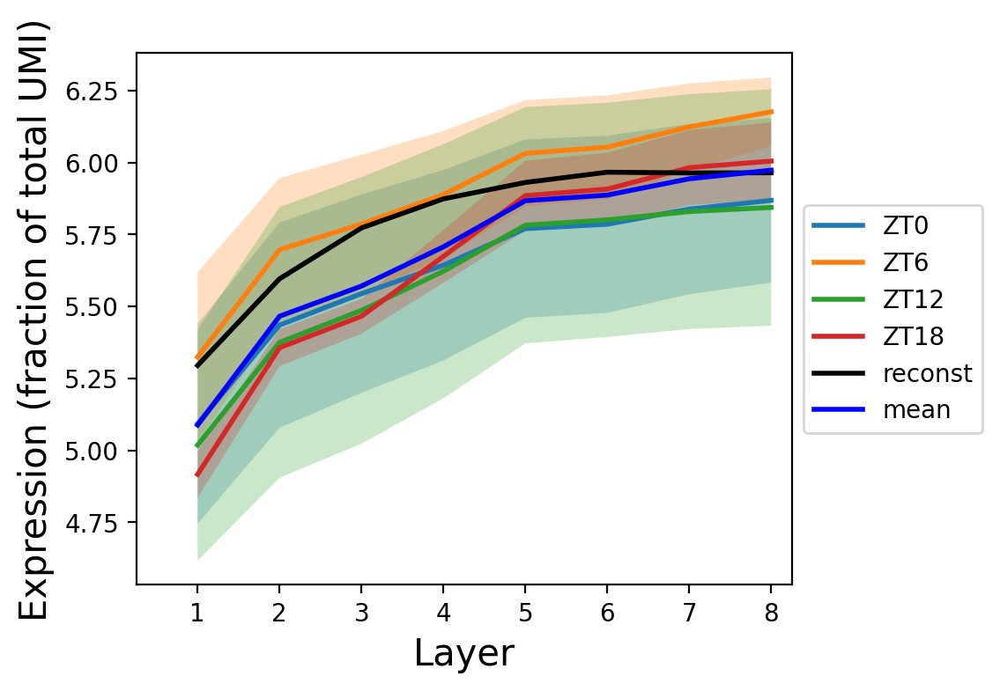

0.9326924631368828


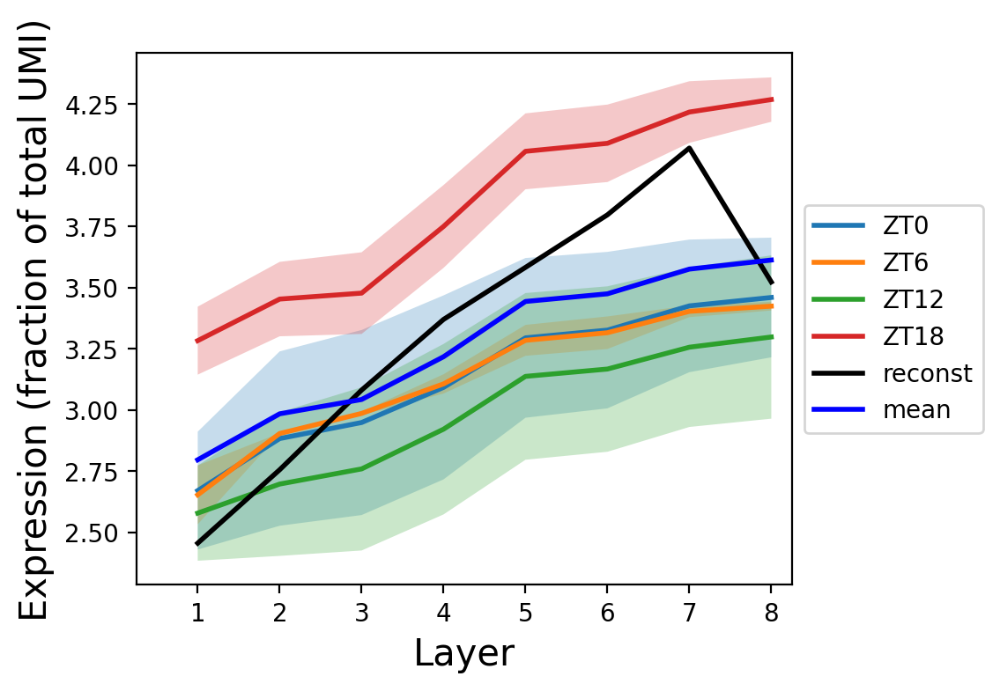

0.8528837070205623


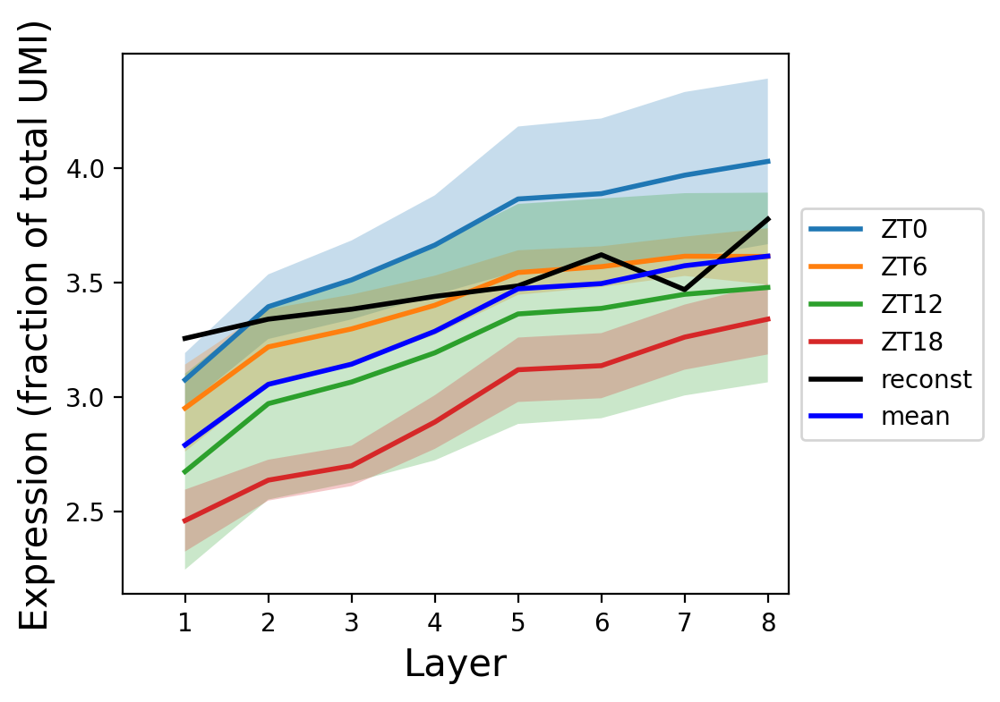

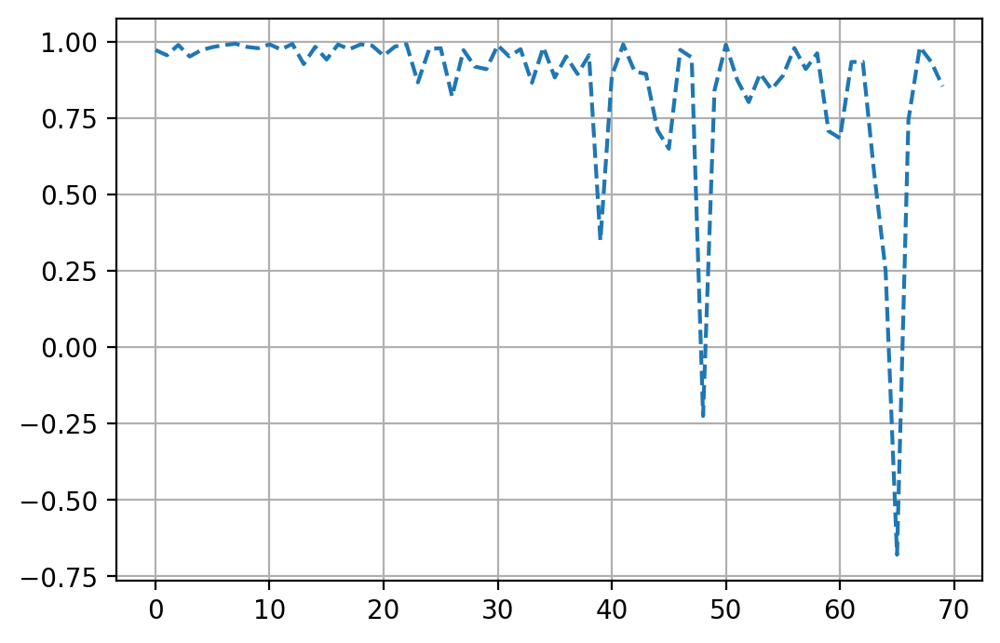

In [64]:
# compare AE output to the true average
res_z = []
num = np.random.randint(0, 1000, 2)

for i in z_gene[0:70]:
#     res.append(data1[z_gene[i]])
#     if i in z_gene:
#     if i in r_gene:
        temp = helper.partial_average_shift(data_mat_norm_total[i][0:train_len], np.array(shifted_codes).T[0], 0)
        res_z.append(plot_cir(dic_itz_clean, i, np.flip(transform_data(np.array(temp)))))
#         res.append(plot_cir(dic_itz_clean, i, (transform_data(np.array(temp)))))


helper.plot_vec([res_z])

In [ ]:
# plot of correlation coeff
helper.plot_vec([res_z])

```{Note}
    clustering r_genes
```

In [41]:
l_circadian = ['arntl', 'clock', 'npas2', 'nr1d1', 'nr1d2', 'per1', 'per2', 'cry1', 'cry2', 'dbp', 'tef', 'hlf', 
               'elovl3', 'rora', 'rorc']
index = [g for g in r_gene if g in l_circadian]

In [42]:
print(index)

['nr1d2', 'per2', 'npas2']


In [44]:
# ‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘cosine’, ‘precomputed’
ker_type = 'linear'

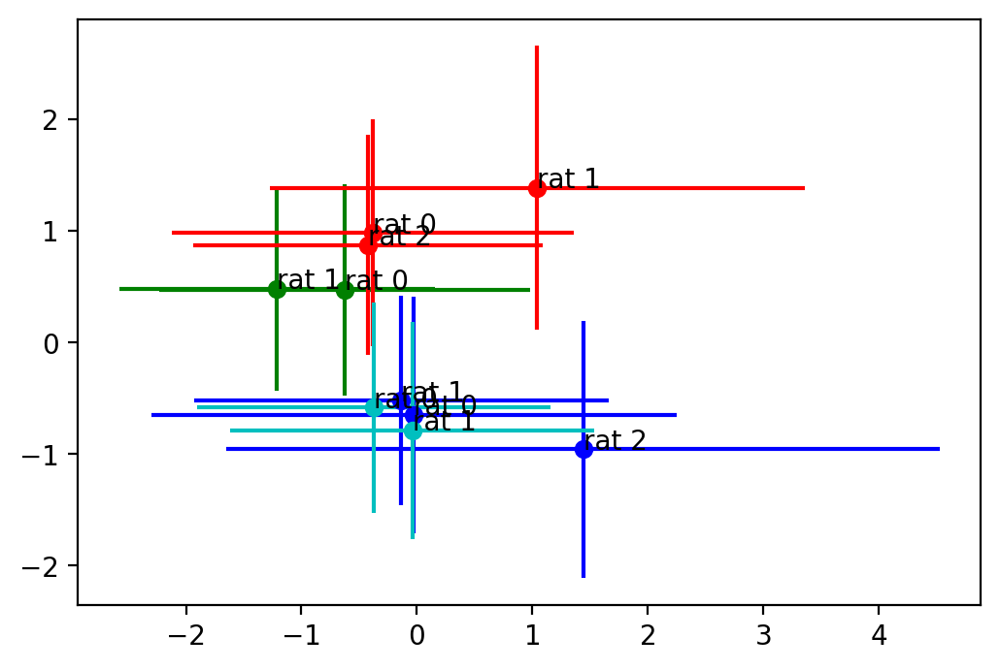

In [134]:
output_mat = helper.dic_to_array(data_total, [r_gene])
output_mat = dataset_gen.normalized_row(output_mat)
pca = KernelPCA(n_components=3, kernel=ker_type)

pca_cluster =  pca.fit_transform(output_mat.T)
color = 'bgrc'
for t in range(4):
    for i in range(len(time_cell_num[t])):
#         temp = np.concatenate([pca_cluster[r1:r2, :] for (r1, r2) in time_cell_num[t]])
        (r1, r2) = time_cell_num[t][i]
        temp = pca_cluster[r1:r2, :]
#         print(temp.shape)
        x, y, z = temp.T
        xm, ym, zm = np.mean(temp.T, axis = 1)
        xv, yv, zv = np.var(temp.T, axis = 1)
    #     print(yv)
    #     print(t)
    #     ax.scatter3D(xm, ym, s = np.sqrt(xv + yv) * 100, c = color[t], alpha = 1)
#         plt.scatter(x, y, c = color[t], alpha = 0.05)
        plt.scatter(xm, ym, s = np.sqrt(xv + yv), c = color[t], alpha = 1)
        plt.text(xm,ym,'rat ' + str(i))
        plt.errorbar(xm, ym,
                 xerr = np.sqrt(xv),
                 yerr = np.sqrt(yv),
                 fmt ='o', c = color[t])

```{note}
experiments on r_gene
```

In [51]:
# find true mean based on 
reload()
test_data_total = {}
num_cell = len(data_total[r_gene[0]])
order_array = np.zeros(num_cell)
for k in time_cell_num.keys():
    ranges = time_cell_num[k]
    for r in ranges:
        order_array[r[0]:r[1]] = k
# plot_vec([order_array])
for g in r_gene:
    temp = data_total[g]
    avg = helper.time_base_avg(temp, time_cell_num, num_cell)
    cur = [avg[int(order_array[i])] for i in range(num_cell)]
    test_data_total[g] = cur
    test_data_total[g] = helper.shift(cur, 'none')

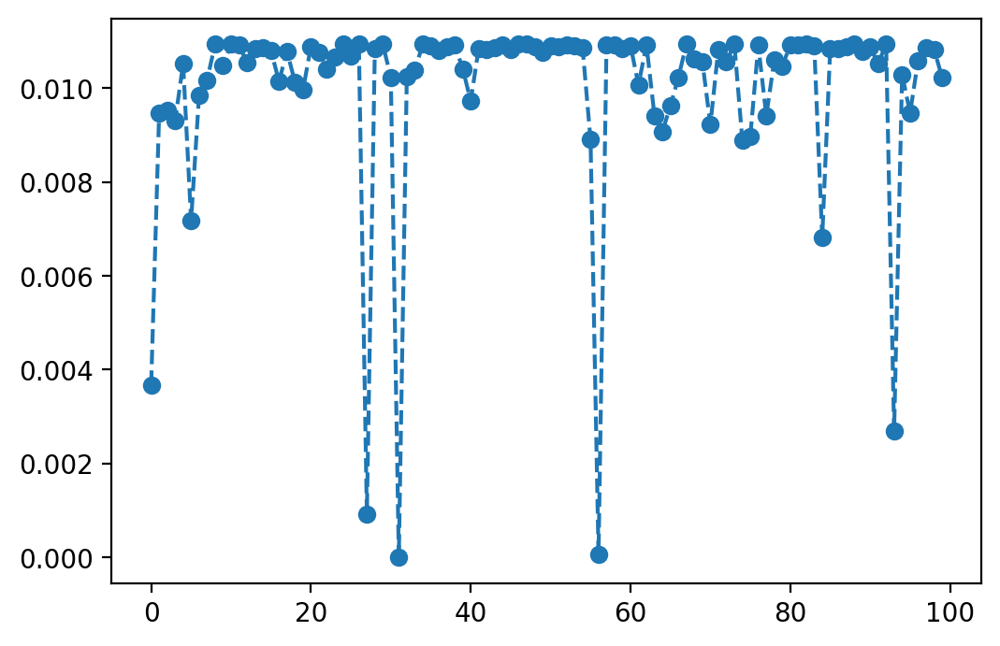

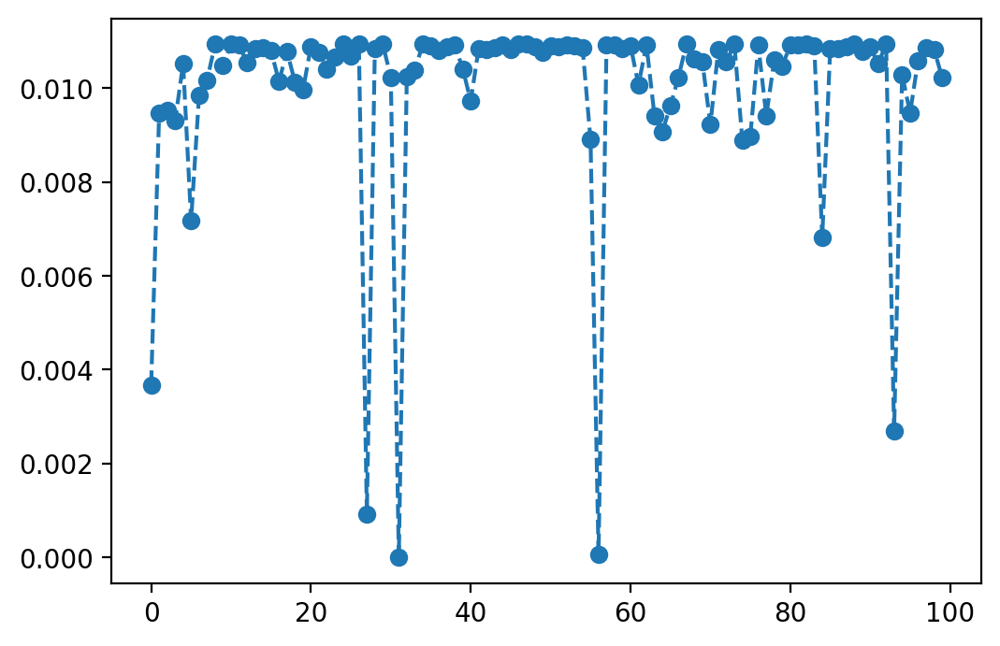

In [96]:
reload()
output_mat = helper.dic_to_array(test_data_total, [r_gene[0:100]])
output_mat = dataset_gen.normalized_row_nan(output_mat)

data_dim, cell_dim = output_mat.shape

# set input parameters for the algorithm
max_epoch = 400
code_dim = 1
# hidden_layers = [64, 8]
hidden_layers = [256, 128]
step_size = 0.1
num_iter = 0
train_len = int(cell_dim * 0.99)

# set initial weights for cell and gene
init_weight = 1 * np.array([1/data_dim]*data_dim) 
# init_weight = np.sum([output_mat >0][0], axis = 1)/ np.sum(np.sum([output_mat >0][0]))
init_cell_weight = np.array([1/train_len]*train_len)

algo_output4 = sudo_algo2.multi_weight_weightedMSE(output_mat, data_dim, max_epoch, code_dim, hidden_layers, step_size, num_iter, init_weight,init_cell_weight, False)

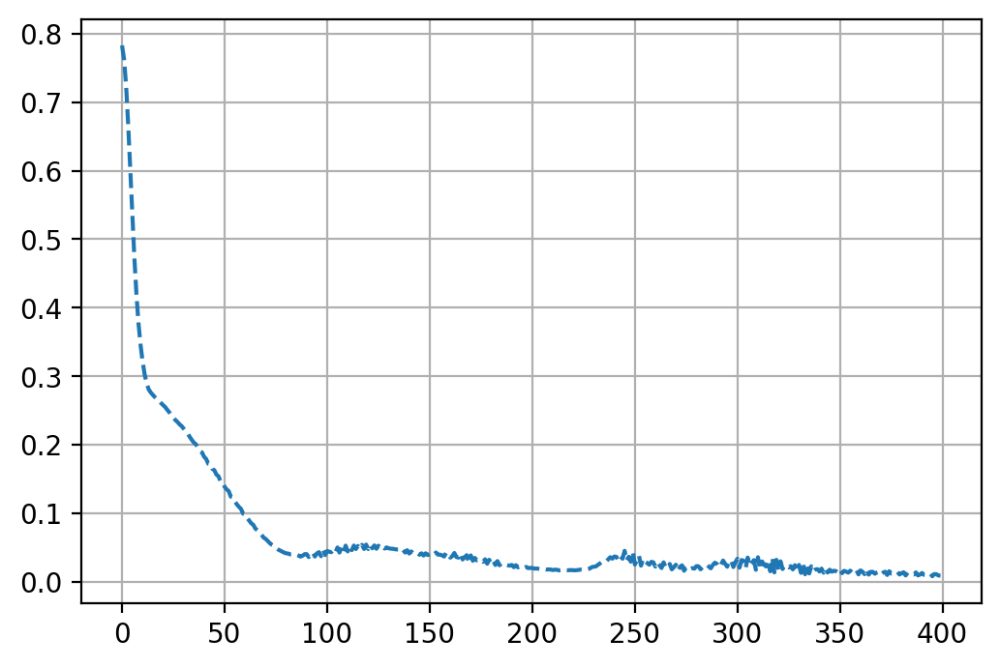

In [98]:
# check loss function is decreasing
helper.plot_vec(algo_output4[-1])

1.6451281 -0.86831856
[-1.11966324 -1.0693943  -1.01912537 -0.96885643 -0.91858749 -0.86831856
 -0.81804962 -0.76778069 -0.71751175 -0.66724281 -0.61697388 -0.56670494
 -0.516436   -0.46616707 -0.41589813 -0.3656292  -0.31536026 -0.26509132
 -0.21482239 -0.16455345 -0.11428452 -0.06401558 -0.01374664  0.03652229
  0.08679123  0.13706017  0.1873291   0.23759804  0.28786697  0.33813591
  0.38840485  0.43867378  0.48894272  0.53921165  0.58948059  0.63974953
  0.69001846  0.7402874   0.79055634  0.84082527  0.89109421  0.94136314
  0.99163208  1.04190102  1.09216995  1.14243889  1.19270782  1.24297676
  1.2932457   1.34351463  1.39378357  1.44405251  1.49432144  1.54459038
  1.59485931  1.64512825  1.69539719  1.74566612  1.79593506  1.84620399]


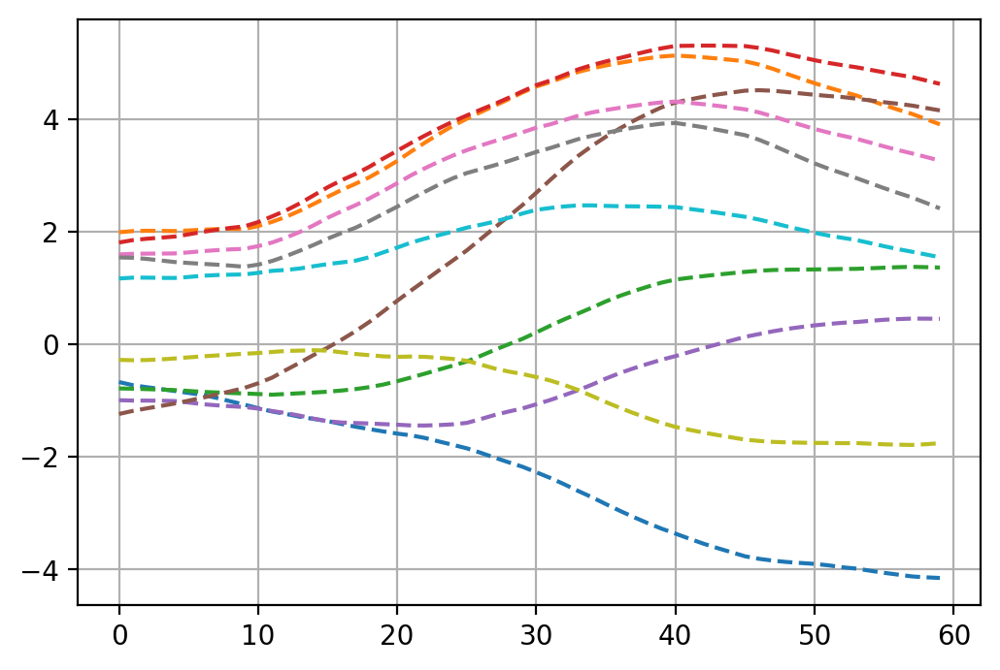

In [99]:
codes = helper.get_encoder(algo_output4[0], output_mat[:, 0:train_len])

print(np.max(codes), np.min(codes))

# check decoder function for first 10 genes
reload()
low = np.min(codes)
high = np.max(codes)
helper.plot_output_function(algo_output4[0], range(10), low, high)

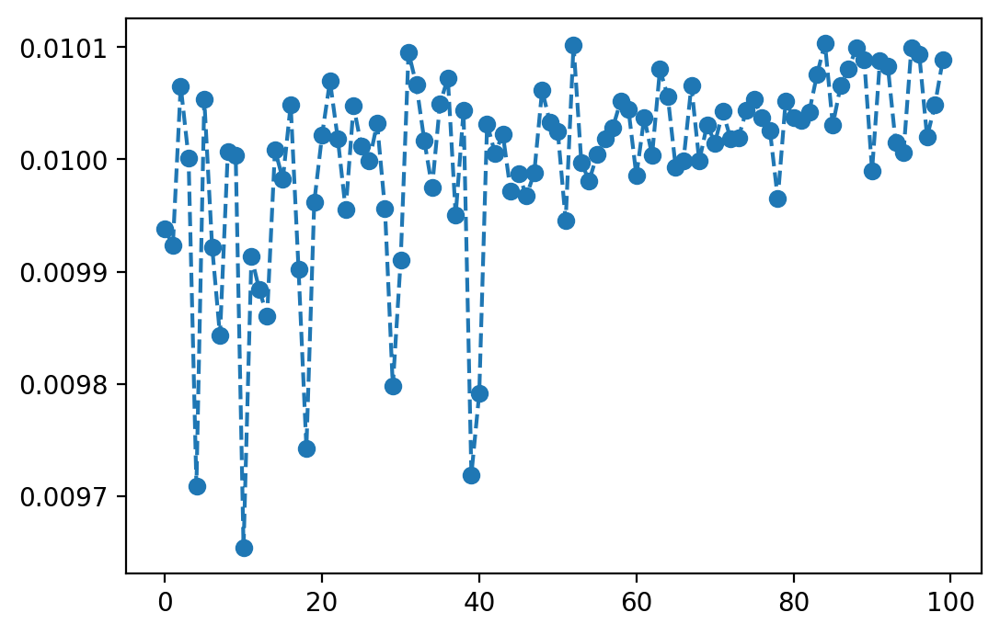

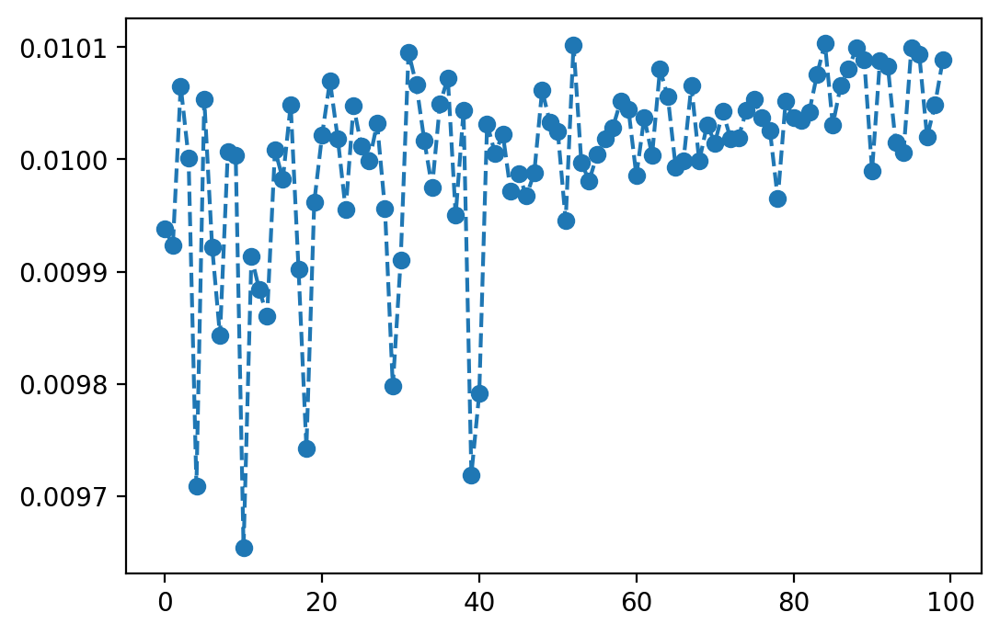

In [100]:
# check performace on r_gene only 

reload()
output_mat = helper.dic_to_array(data_total, [r_gene[0:100]])
output_mat = dataset_gen.normalized_row_nan(output_mat)
data_dim, cell_dim = output_mat.shape

# set input parameters for the algorithm
max_epoch = 400
code_dim = 1
# hidden_layers = [64, 8]
hidden_layers = [128, 64]
step_size = 0.1
num_iter = 0
train_len = int(cell_dim * 0.99)

# set initial weights for cell and gene
init_weight = 1 * np.array([1/data_dim]*data_dim) 
# init_weight = np.sum([output_mat >0][0], axis = 1)/ np.sum(np.sum([output_mat >0][0]))
init_cell_weight = np.array([1/train_len]*train_len)

algo_output2 = sudo_algo2.multi_weight_weightedMSE(output_mat, data_dim, max_epoch, code_dim, hidden_layers, step_size, num_iter, init_weight,init_cell_weight, False)

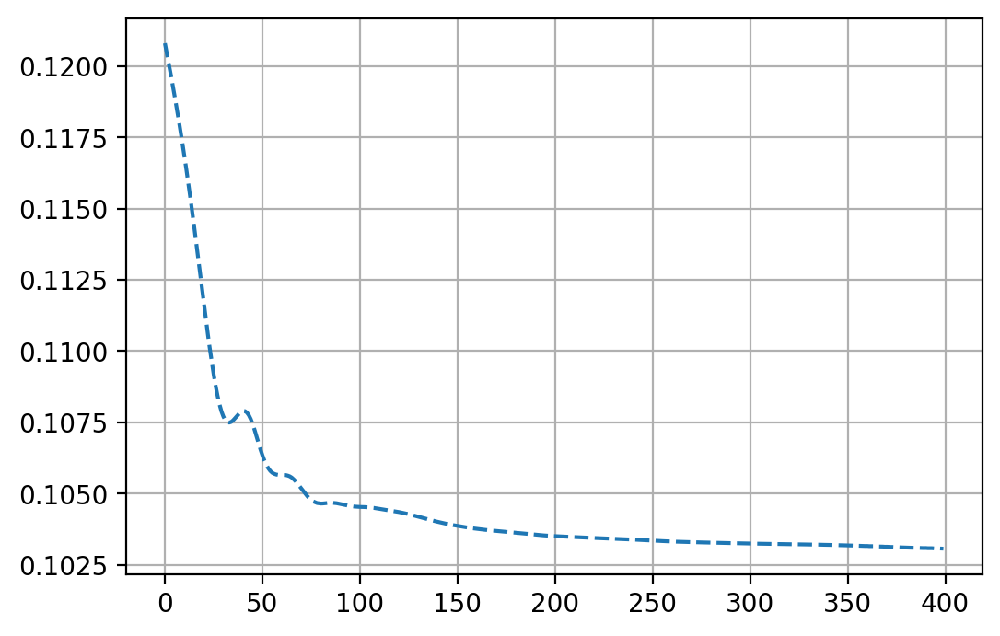

In [101]:
# check loss function is decreasing
helper.plot_vec(algo_output2[-1])

2.5950906 -1.2192653
[-1.60070093e+00 -1.52441381e+00 -1.44812669e+00 -1.37183958e+00
 -1.29555246e+00 -1.21926534e+00 -1.14297822e+00 -1.06669111e+00
 -9.90403991e-01 -9.14116874e-01 -8.37829757e-01 -7.61542640e-01
 -6.85255523e-01 -6.08968406e-01 -5.32681289e-01 -4.56394172e-01
 -3.80107055e-01 -3.03819938e-01 -2.27532821e-01 -1.51245704e-01
 -7.49585867e-02  1.32853031e-03  7.76156473e-02  1.53902764e-01
  2.30189881e-01  3.06476998e-01  3.82764115e-01  4.59051232e-01
  5.35338349e-01  6.11625466e-01  6.87912583e-01  7.64199700e-01
  8.40486817e-01  9.16773934e-01  9.93061051e-01  1.06934817e+00
  1.14563529e+00  1.22192240e+00  1.29820952e+00  1.37449664e+00
  1.45078375e+00  1.52707087e+00  1.60335799e+00  1.67964510e+00
  1.75593222e+00  1.83221934e+00  1.90850646e+00  1.98479357e+00
  2.06108069e+00  2.13736781e+00  2.21365492e+00  2.28994204e+00
  2.36622916e+00  2.44251627e+00  2.51880339e+00  2.59509051e+00
  2.67137763e+00  2.74766474e+00  2.82395186e+00  2.90023898e+00]


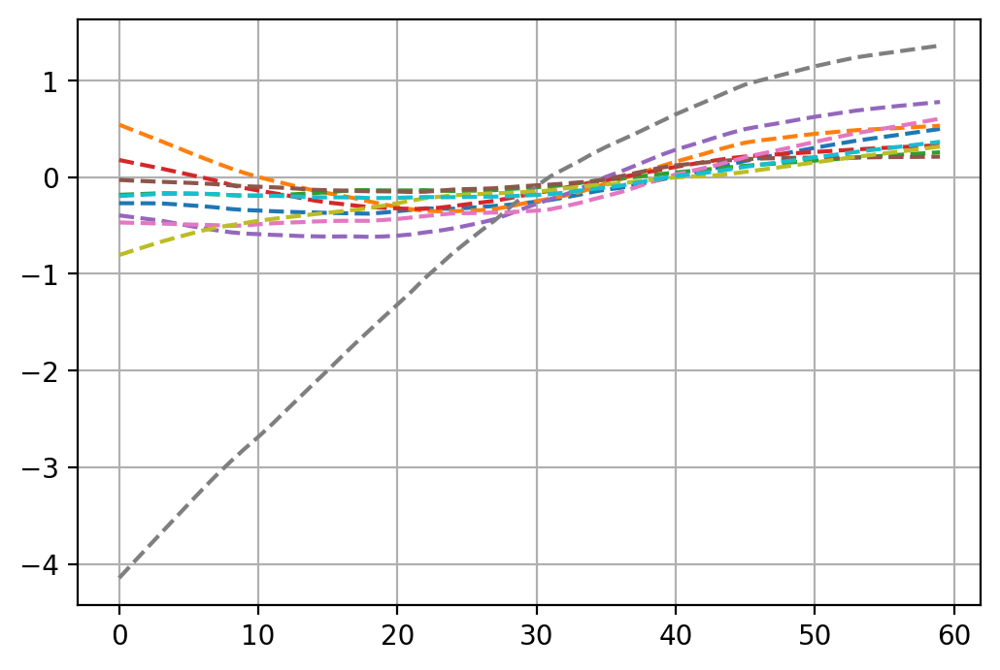

In [119]:
codes = helper.get_encoder(algo_output2[0], output_mat[:, 0:train_len])

print(np.max(codes), np.min(codes))

# check decoder function for first 10 genes
reload()
low = np.min(codes)
high = np.max(codes)
helper.plot_output_function(algo_output2[0], range(10), low, high)

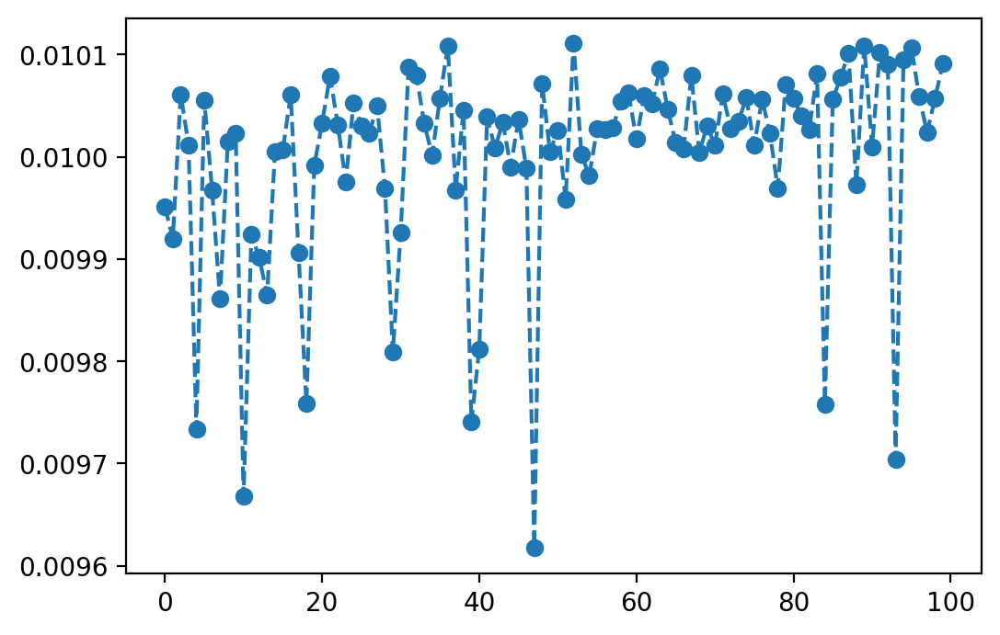

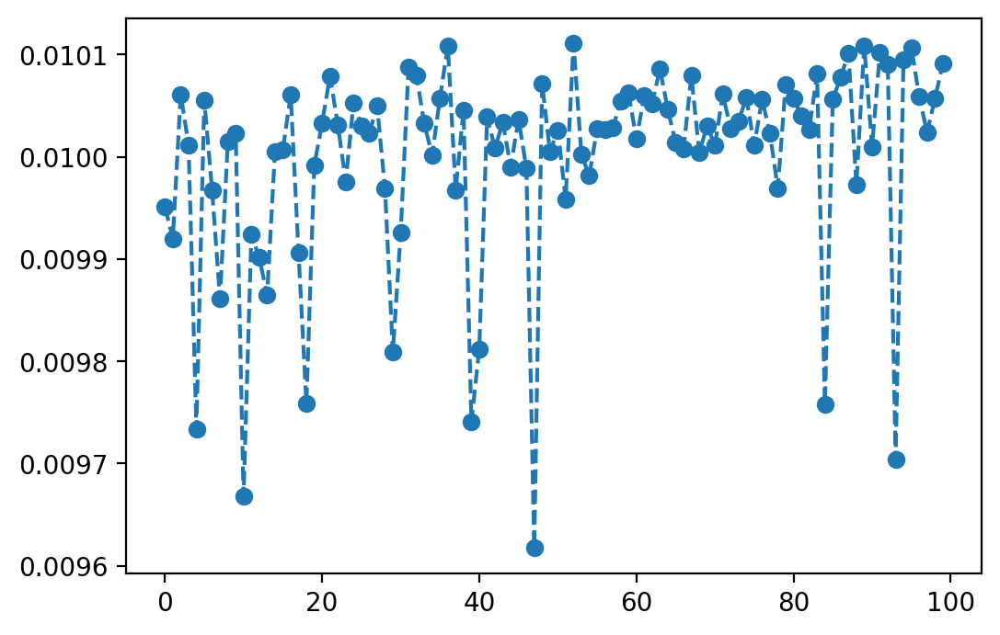

In [116]:
# check performace on r_gene only 

reload()
output_mat = helper.dic_to_array(data_total, [r_gene[0:100]])
output_mat = dataset_gen.normalized_row_nan(output_mat)


data_dim, cell_dim = output_mat.shape

# set input parameters for the algorithm
max_epoch = 400
code_dim = 1
# hidden_layers = [64, 8]
hidden_layers = [256, 128]
step_size = 0.1
num_iter = 0
train_len = int(cell_dim * 0.99)

# set initial weights for cell and gene
init_weight = 1 * np.array([1/data_dim]*data_dim) 
# init_weight = np.sum([output_mat >0][0], axis = 1)/ np.sum(np.sum([output_mat >0][0]))
init_cell_weight = np.array([1/train_len]*train_len)

algo_output3 = sudo_algo2.multi_weight_weightedMSE(output_mat, data_dim, max_epoch, code_dim, hidden_layers, step_size, num_iter, init_weight,init_cell_weight, False)

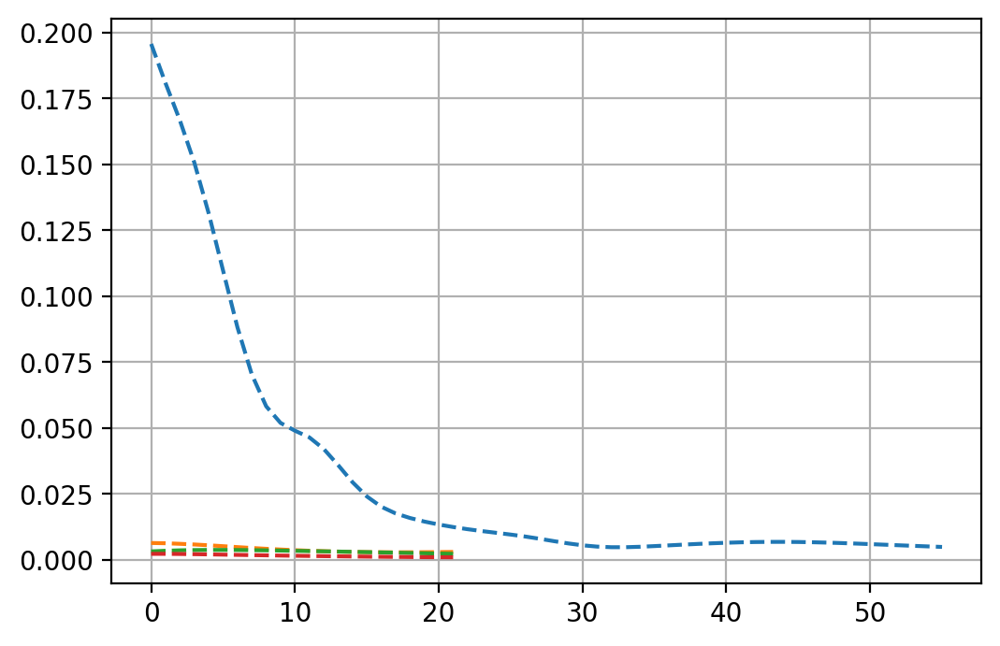

In [110]:
# check loss function is decreasing
helper.plot_vec(algo_output3[-1])

In [111]:
codes = helper.get_encoder(algo_output3[0], output_mat[:, 0:train_len])

print(np.max(codes), np.min(codes))

0.0930934 -0.16898614


[-0.1951941  -0.1899525  -0.18471091 -0.17946932 -0.17422773 -0.16898614
 -0.16374455 -0.15850296 -0.15326137 -0.14801978 -0.14277819 -0.1375366
 -0.13229501 -0.12705342 -0.12181183 -0.11657023 -0.11132864 -0.10608705
 -0.10084546 -0.09560387 -0.09036228 -0.08512069 -0.0798791  -0.07463751
 -0.06939592 -0.06415433 -0.05891274 -0.05367115 -0.04842955 -0.04318796
 -0.03794637 -0.03270478 -0.02746319 -0.0222216  -0.01698001 -0.01173842
 -0.00649683 -0.00125524  0.00398635  0.00922794  0.01446953  0.01971112
  0.02495272  0.03019431  0.0354359   0.04067749  0.04591908  0.05116067
  0.05640226  0.06164385  0.06688544  0.07212703  0.07736862  0.08261021
  0.0878518   0.0930934   0.09833499  0.10357658  0.10881817  0.11405976]


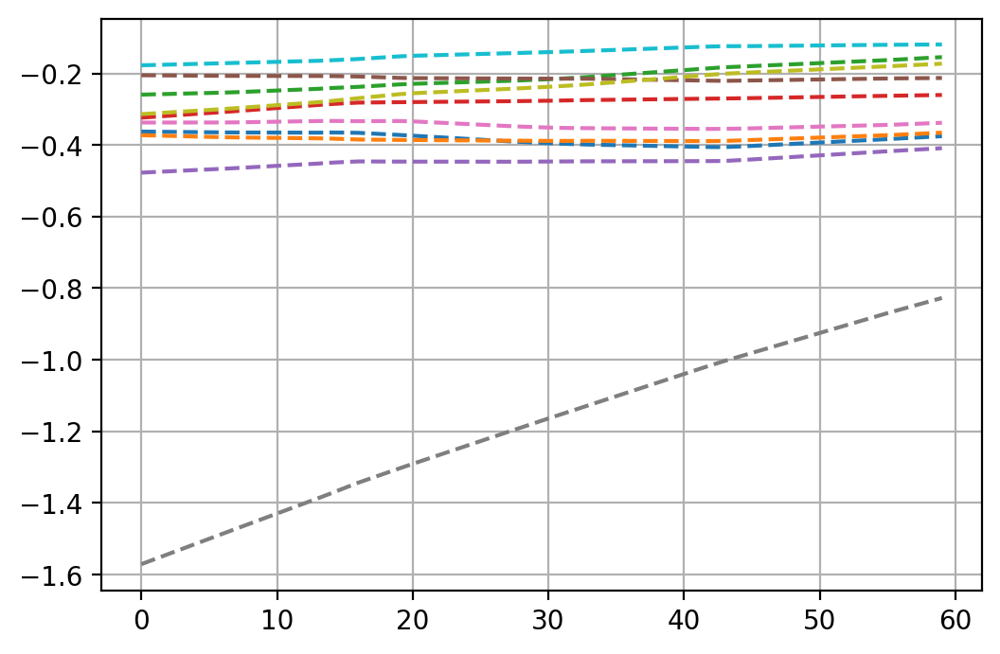

In [117]:
# check decoder function for first 10 genes
reload()
low = np.min(codes)
high = np.max(codes)
helper.plot_output_function(algo_output3[0], range(10), low, high)

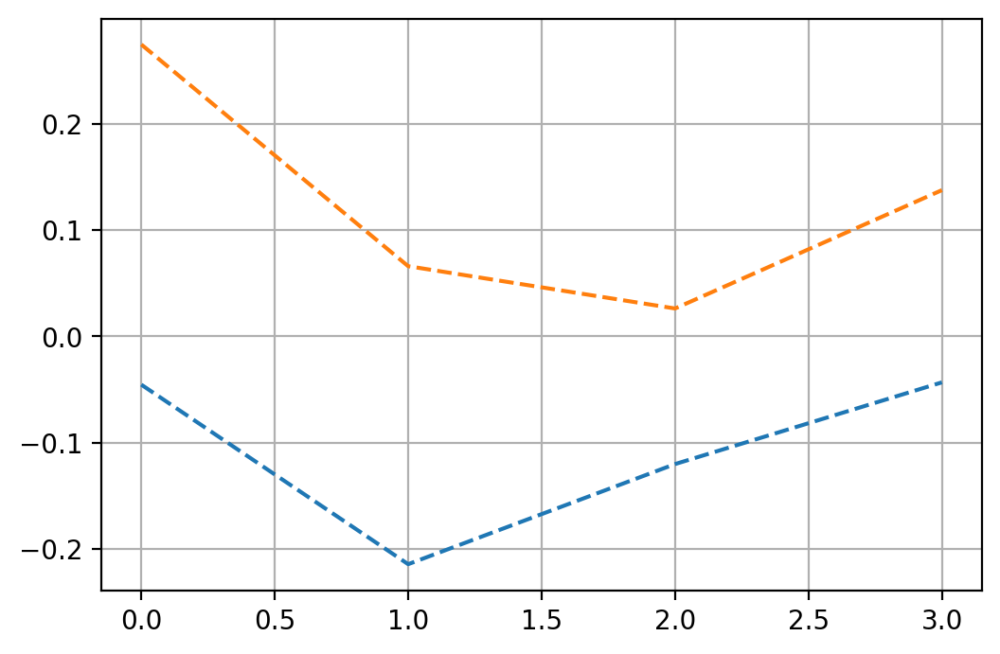

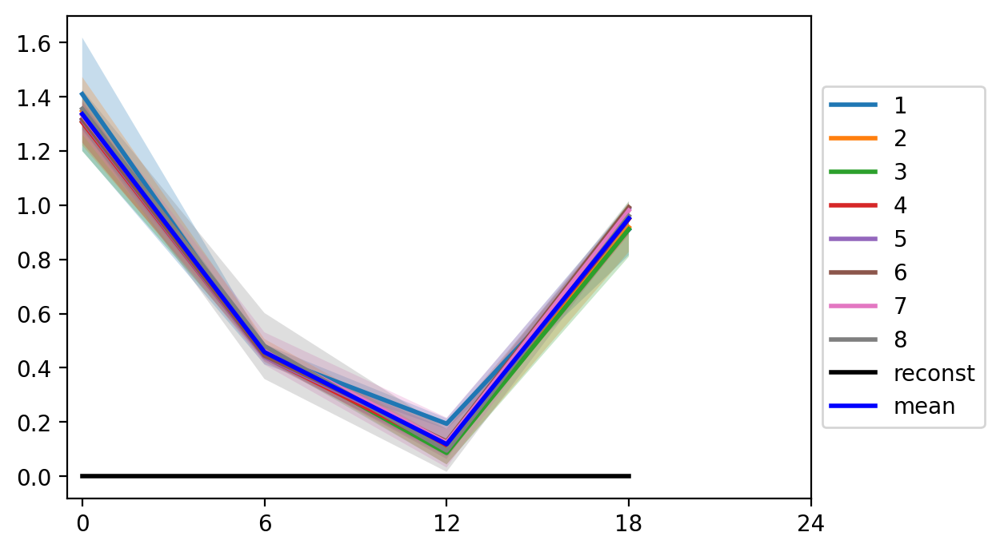

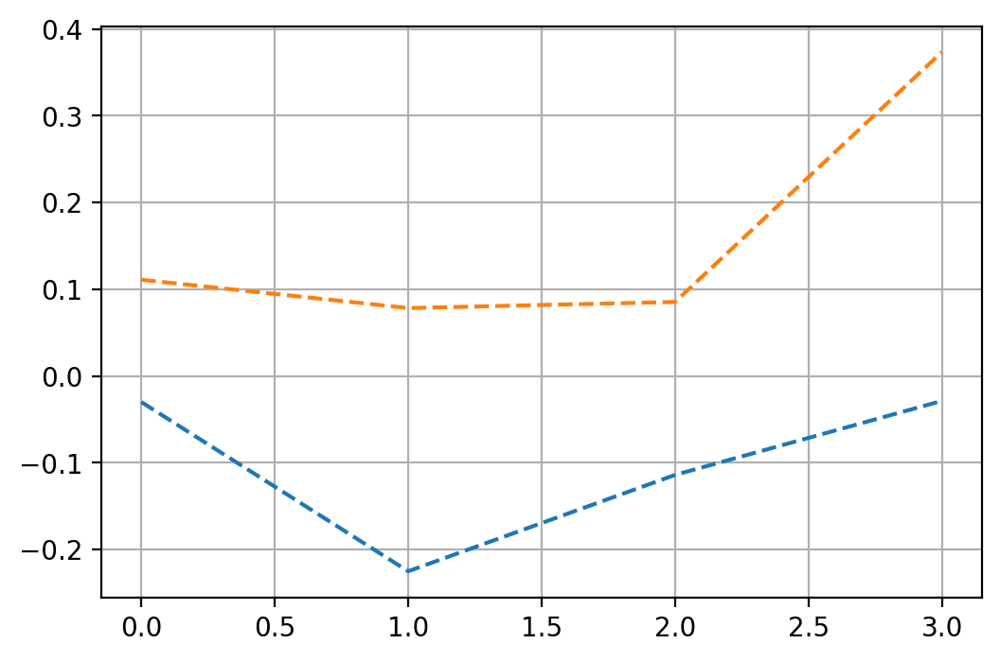

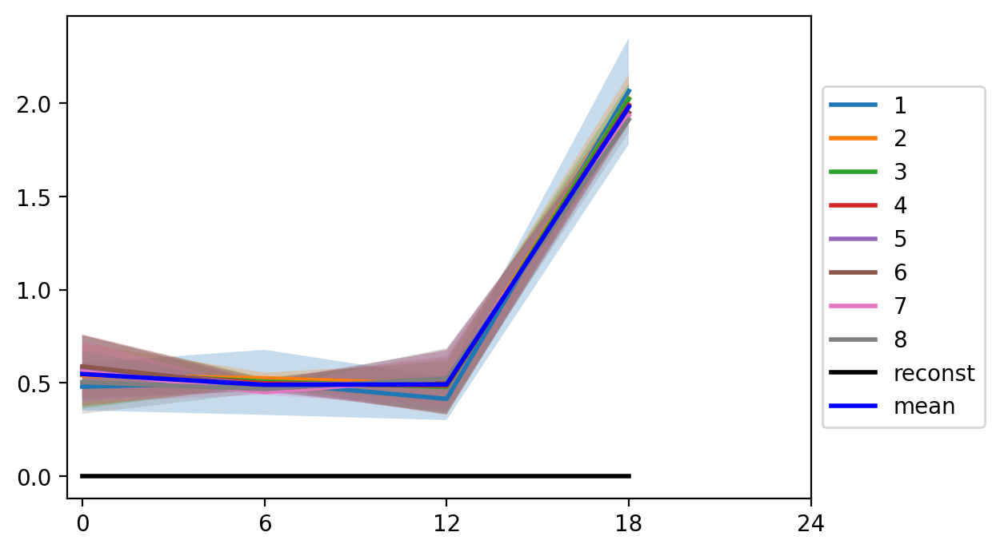

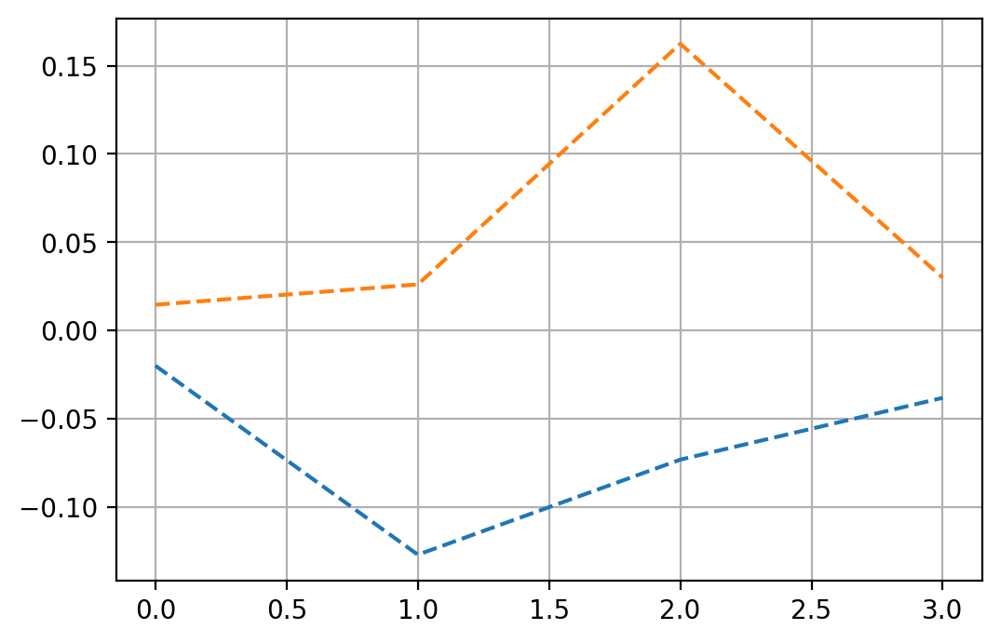

...

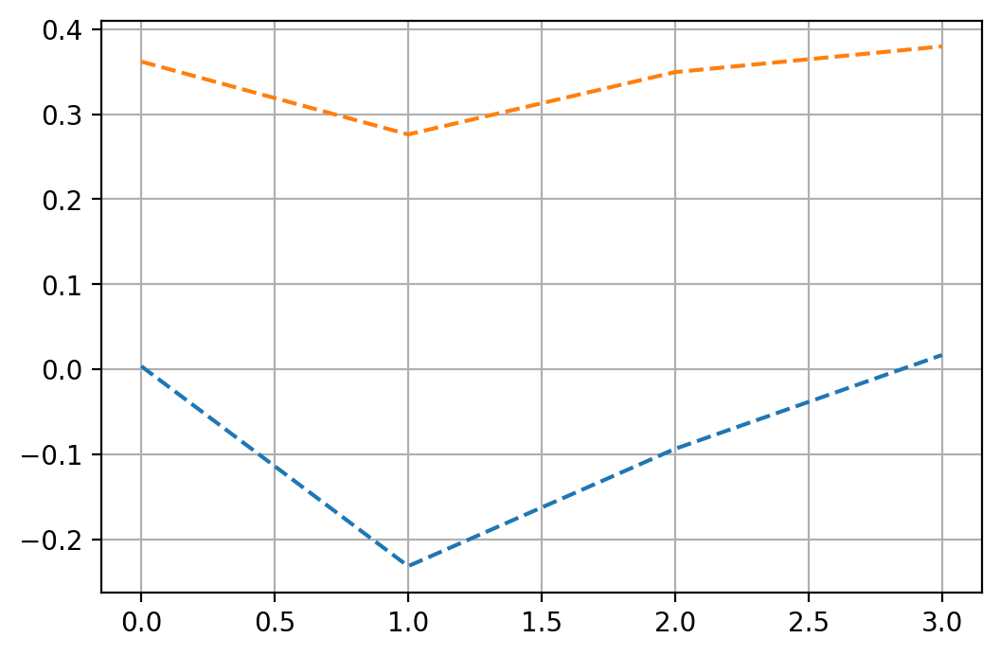

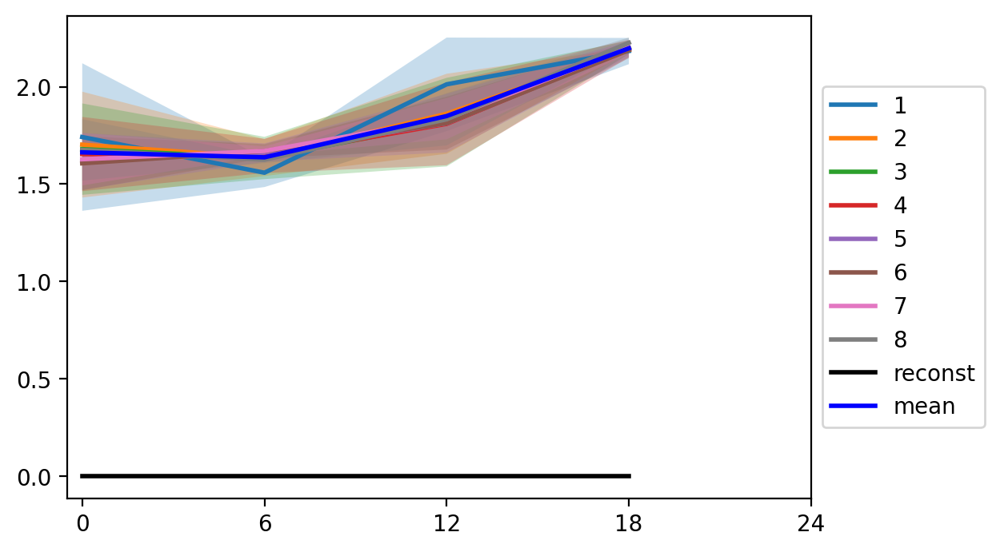

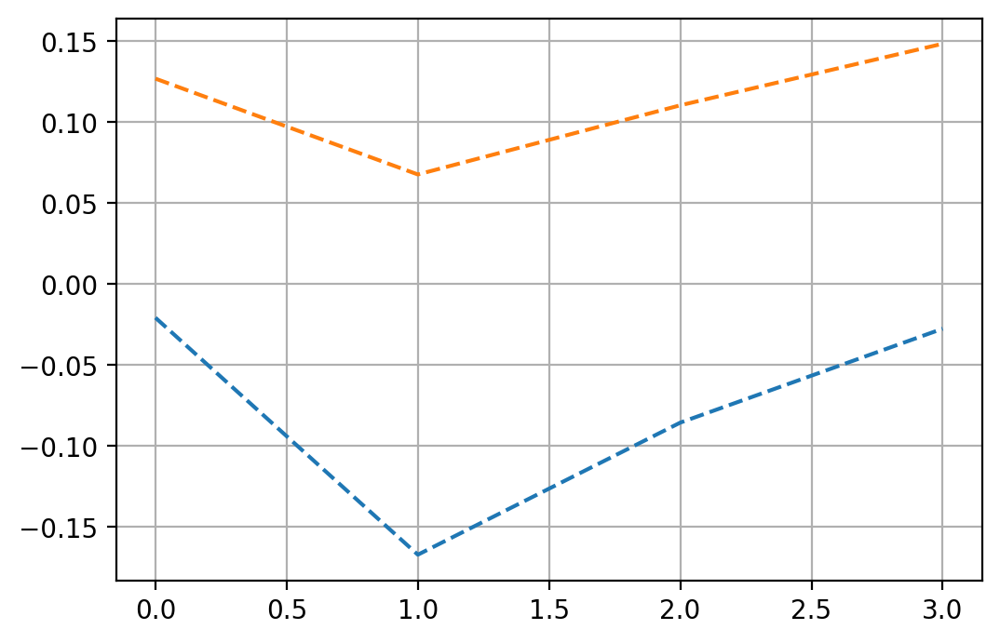

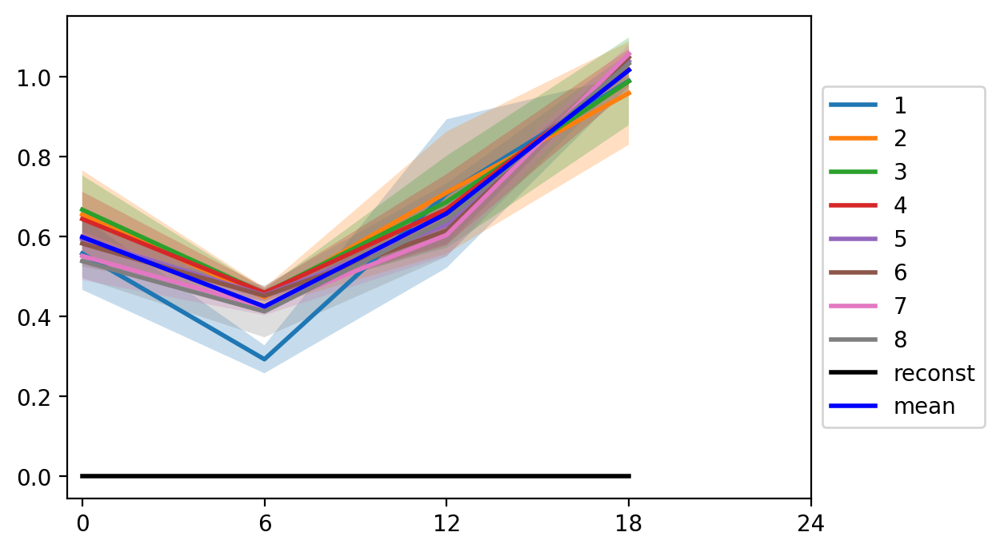

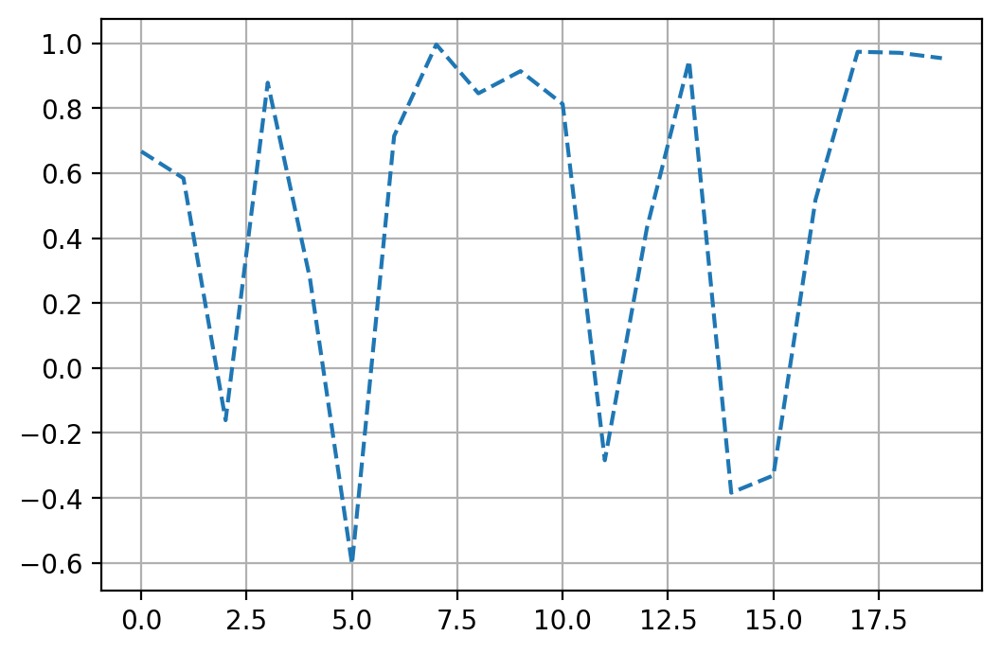

In [125]:
# output_mat = dic_to_array(data_total, [r_gene[4:5]])
outputs = np.array(helper.get_output(algo_output3[0], output_mat))
# print(outputs[:, 0].shape)
res = []
# picked = [0, 2, 4]
for i in range(20):
#     res.append(data_total[r_gene[i]])
    out = helper.time_base_avg(outputs[:, i], time_cell_num, 18378)
    target = helper.time_base_avg(data_total[r_gene[i]], time_cell_num, 18378)
    helper.plot_vec([out, target])
    plot_temp(dic_itz_clean, r_gene[i], [0]*4)
    core = np.corrcoef(out, target)
    res.append(core[0][1])
#     plot_vec([np.array(time_base_avg(outputs[:, i], time_cell_num, 18378))[np.array([0, 1, 2, 3])], np.array(time_base_avg(test_data_total[r_gene[i]], time_cell_num, 18378))[np.array([0, 1, 2, 3])]])
#     plot_temp(dic_itz_clean, r_gene[i], [0]*4)
#     res.append(outputs[:, i][0:train_len])
helper.plot_vec([res])
# plot_vec([outputs[:, i] for i in range(3)])

In [130]:
print(dic_itz_clean[r_gene[0]]['rep1'])

[[1.11791945 0.48749238 0.1721225  0.81600749]
 [1.24594007 0.50632229 0.04563059 0.82783996]
 [1.258075   0.48167482 0.04872787 0.80992626]
 [1.27391483 0.46130931 0.10186491 0.89210173]
 [1.28281752 0.45584814 0.19427019 0.9712753 ]
 [1.27888874 0.45875777 0.21986378 0.99158699]
 [1.24043265 0.5309043  0.25231738 0.96086538]
 [1.27147324 0.60214684 0.19612382 0.90492645]]
